#**Data Science Assignment 4**
**Abhishek Badhe -
002743591**




# **Abstract**

The Car Price dataset is a comprehensive dataset consisting of technical specifications, fuel efficiency, and pricing information for various car models. The dataset contains information on 205 car models and 26 features, including engine size, fuel type, horsepower, and price. The data is widely used in the automotive industry for predictive modeling and price estimation of cars based on their features.

The dataset includes both numerical and categorical variables, and some variables have missing values that require imputation. Data cleaning and preprocessing are necessary to prepare the dataset for modeling. Additionally, feature selection is important to identify the most relevant variables for predicting the car price. Several statistical techniques can be employed to determine which variables are most important for predictive modeling.

The Car Price dataset is a valuable resource for anyone interested in predicting car prices or conducting research in the automotive industry. Its comprehensive coverage of technical and pricing information for a large number of car models makes it a popular choice for data analysis and modeling.

# **Description**
The CarPrice_Assignment dataset contains the following features:

**car_ID**: ID of the car

**symboling**: Its assigned insurance risk rating, A value of +3 indicates that the auto is risky, -3 that it is probably pretty safe.

**CarName**: Name of the car

**fueltype**: Type of fuel used by the car (gas or diesel)

**aspiration**: Aspiration used by the car (std or turbo)

**doornumber**: Number of doors in the car (two or four)

**carbody**: Body of the car (sedan, hatchback, wagon, hardtop, convertible)

**drivewheel**: Type of drive wheel (fwd, rwd, 4wd)

**enginelocation**: Location of the car engine (front or rear)

**wheelbase**: Length between the center of the front and rear wheels of the car

**carlength**: Length of the car

**carwidth**: Width of the car

**carheight**: Height of the car

**curbweight**: The weight of a car without occupants or baggage.

**enginetype**: Type of engine (ohc, ohcf, ohcv, dohc, dohcv, l, rotor)

**cylindernumber**: Number of cylinders in the car engine (four, six, five, eight, two, twelve, three)

**enginesize**: Size of the car engine

**fuelsystem**: Fuel system of the car (mpfi, 2bbl, idi, 1bbl, spfi, 4bbl, mfi)

**boreratio**: Boreratio of the car engine

**stroke**: Stroke of the car engine

**compressionratio**: Compression ratio of the car engine

**horsepower**: Horsepower of the car

**peakrpm**: Maximum rpm value achieved by the car engine

**citympg**: Miles per gallon (mpg) of the car in the city

**highwaympg**: Miles per gallon (mpg) of the car on the highway

**price**: Price of the car (Target variable)

## **Feature Selection and Data Cleaning**

In [166]:
#installing dependencies
!pip install eli5
!pip install fitter
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [167]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from fitter import Fitter, get_common_distributions, get_distributions
import shap
import warnings
warnings.filterwarnings('ignore')

In [168]:
#Reading the dataset
data=pd.read_csv("https://raw.githubusercontent.com/BadheA/DataScienceABD/main/CarPrice_Assignment.csv")

In [169]:
data.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [170]:
num_cols = data._get_numeric_data().columns
num_cols, len(num_cols)

(Index(['car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth',
        'carheight', 'curbweight', 'enginesize', 'boreratio', 'stroke',
        'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
        'price'],
       dtype='object'),
 16)

In [171]:
cat_cols = data.select_dtypes(include=['object']).columns.tolist()
cat_cols, len(cat_cols)

(['CarName',
  'fueltype',
  'aspiration',
  'doornumber',
  'carbody',
  'drivewheel',
  'enginelocation',
  'enginetype',
  'cylindernumber',
  'fuelsystem'],
 10)

In [172]:
#checking if the any data is missing
data.isnull().sum()

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

In [173]:
# converting 
for cat_col in cat_cols:
  classes = list(np.unique(data[cat_col]))
  tokens = []
  i = 0
  for c in classes:
    tokens.append(i)
    i += 1

  data[cat_col].replace(classes, tokens, inplace=True)

In [174]:
data.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,2,1,0,1,0,2,0,88.6,...,130,5,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,3,1,0,1,0,2,0,88.6,...,130,5,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,1,1,0,1,2,2,0,94.5,...,152,5,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,4,1,0,0,3,1,0,99.8,...,109,5,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,5,1,0,0,3,0,0,99.4,...,136,5,3.19,3.40,8.0,115,5500,18,22,17450.0


In [175]:
#checking if the any data is missing
data.isnull().sum()

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.49it/s]


          sumsquare_error          aic          bic    kl_div  ks_statistic  \
uniform          0.000027  1067.623999 -3235.894892  0.004419      0.004878   
powerlaw         0.000086  1072.398517 -2994.607402  0.015589      0.063365   
rayleigh         0.000318  1098.056412 -2731.613431  0.076008      0.071593   
chi2             0.000346  1105.122595 -2708.948031  0.083823      0.065420   
norm             0.000349  1102.915881 -2712.279954  0.084660      0.059643   

          ks_pvalue  
uniform    1.000000  
powerlaw   0.367420  
rayleigh   0.232760  
chi2       0.329736  
norm       0.442281  


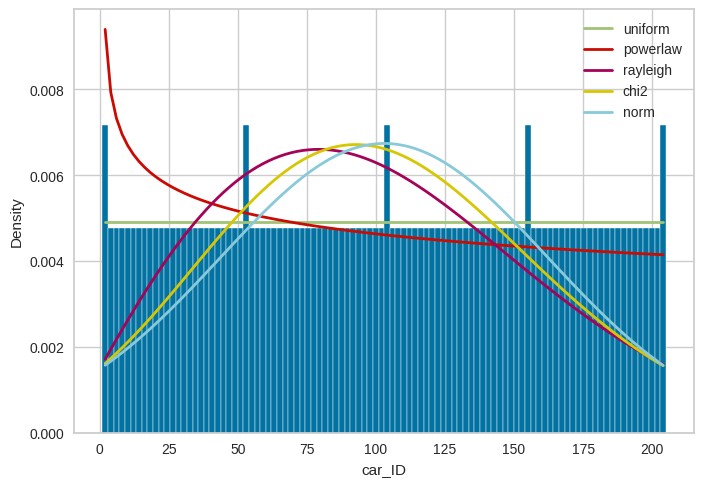

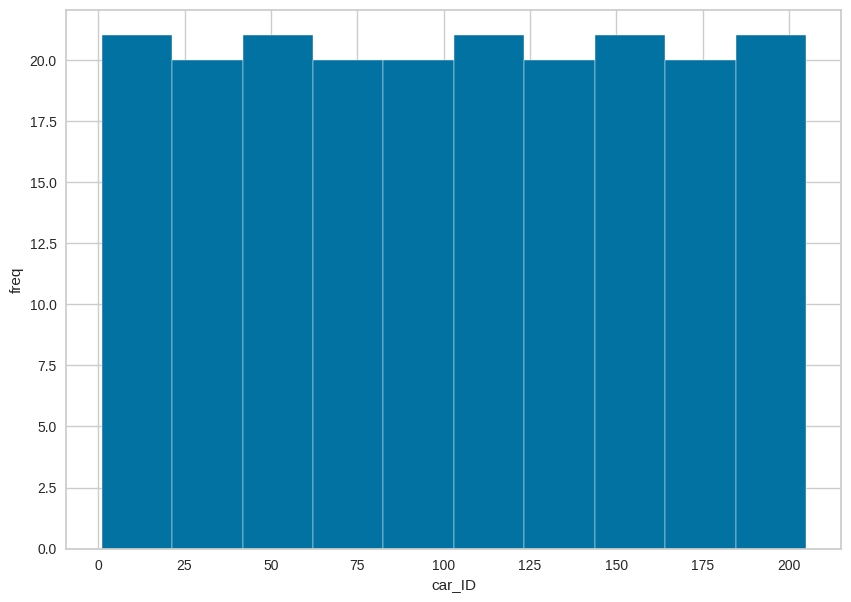

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.46it/s]


          sumsquare_error         aic         bic  kl_div  ks_statistic  \
gamma           87.380532  381.691750 -158.842150     inf      0.186740   
lognorm         87.387686  381.450233 -158.825368     inf      0.188260   
norm            87.485751  373.395436 -163.918460     inf      0.197820   
rayleigh        87.513477  362.199324 -163.853501     inf      0.228657   
powerlaw        87.527775  340.852520 -158.497001     inf      0.228601   

             ks_pvalue  
gamma     9.883747e-07  
lognorm   7.788587e-07  
norm      1.662923e-07  
rayleigh  6.655339e-10  
powerlaw  6.727041e-10  


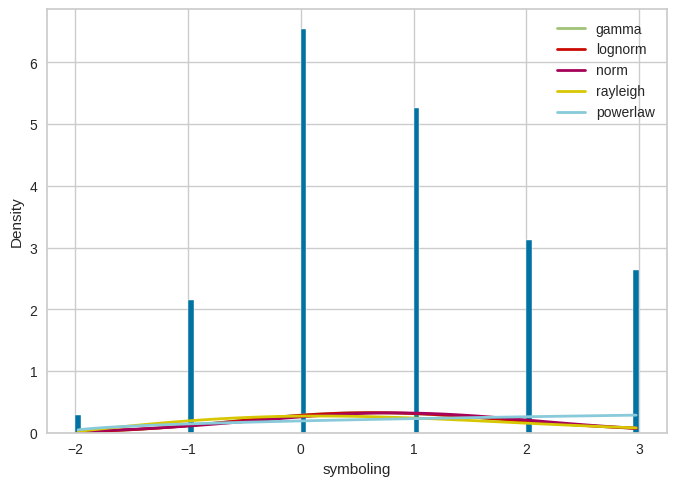

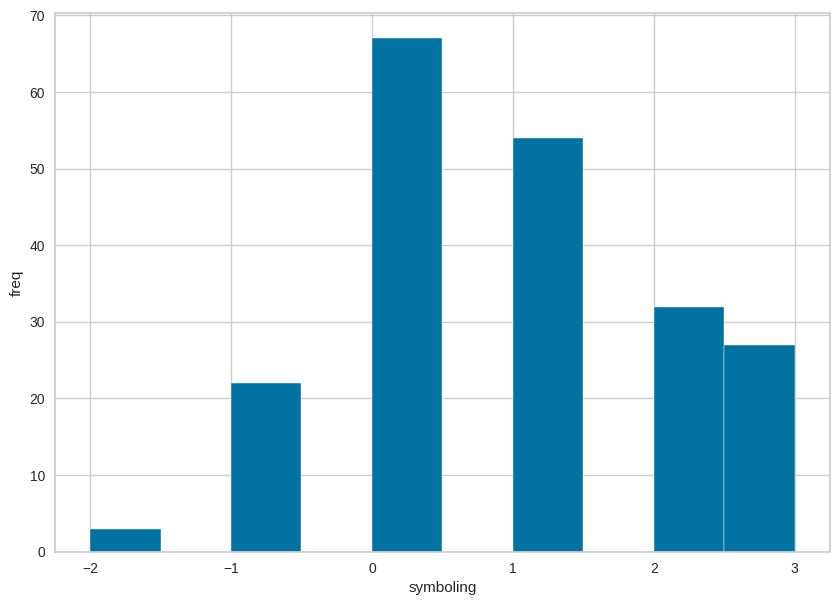

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.34it/s]


          sumsquare_error         aic          bic  kl_div  ks_statistic  \
cauchy           0.210805  905.696340 -1399.719544     inf      0.157982   
lognorm          0.223409  850.383265 -1382.491566     inf      0.119614   
chi2             0.226807  850.982047 -1379.397314     inf      0.127477   
gamma            0.226807  850.981742 -1379.397305     inf      0.127478   
rayleigh         0.238882  819.704739 -1374.086947     inf      0.166309   

          ks_pvalue  
cauchy     0.000062  
lognorm    0.005167  
chi2       0.002307  
gamma      0.002307  
rayleigh   0.000020  


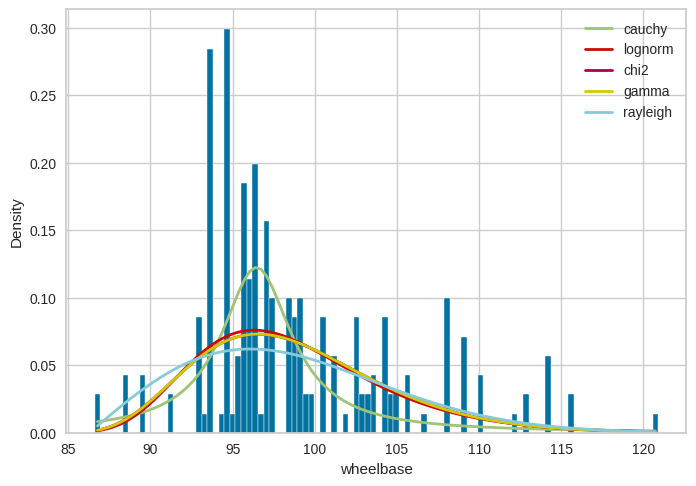

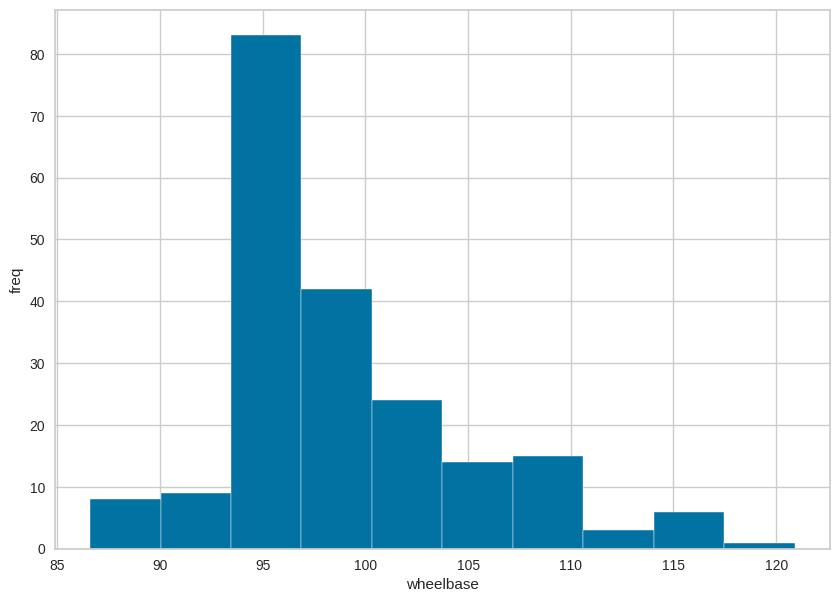

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.21it/s]


         sumsquare_error         aic          bic  kl_div  ks_statistic  \
cauchy          0.043878  975.413375 -1721.469894     inf      0.090076   
chi2            0.044881  940.332286 -1711.516755     inf      0.075748   
lognorm         0.044916  940.094496 -1711.355359     inf      0.078027   
gamma           0.044919  940.066107 -1711.340859     inf      0.078107   
norm            0.045121  936.974291 -1715.746663     inf      0.087592   

         ks_pvalue  
cauchy    0.067473  
chi2      0.180676  
lognorm   0.156256  
gamma     0.155450  
norm      0.081024  


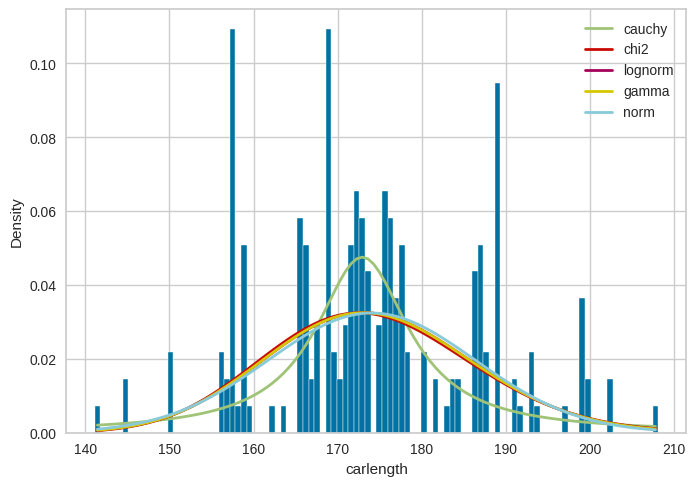

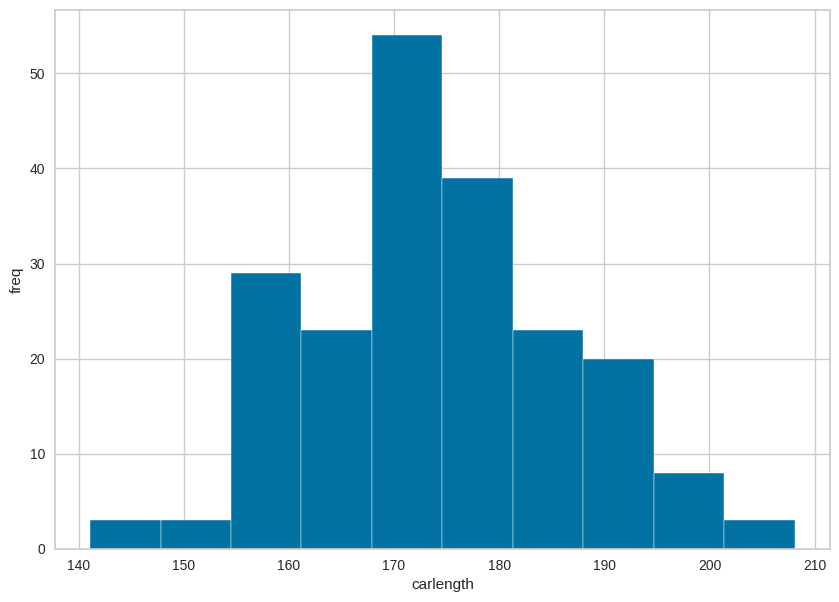

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.82it/s]


         sumsquare_error         aic         bic  kl_div  ks_statistic  \
lognorm         2.449878  655.460202 -891.560185     inf      0.100305   
chi2            2.463666  643.383810 -890.409657     inf      0.104500   
gamma           2.463666  643.383943 -890.409653     inf      0.104499   
norm            2.545326  605.318402 -889.047986     inf      0.132457   
cauchy          2.585271  635.680817 -885.855788     inf      0.167761   

         ks_pvalue  
lognorm   0.030084  
chi2      0.021067  
gamma     0.021068  
norm      0.001348  
cauchy    0.000016  


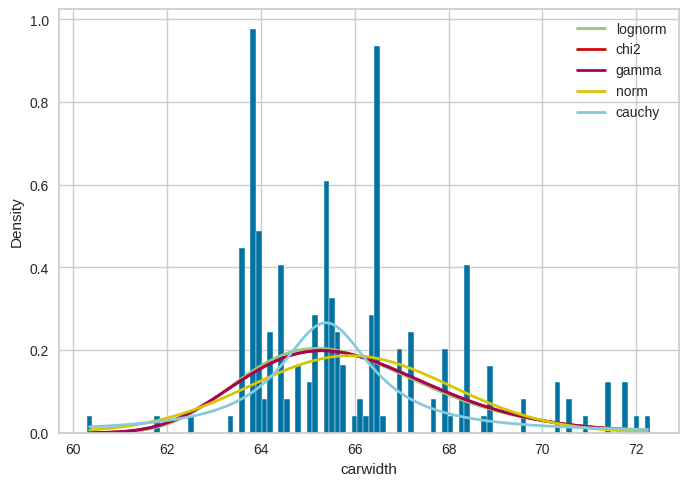

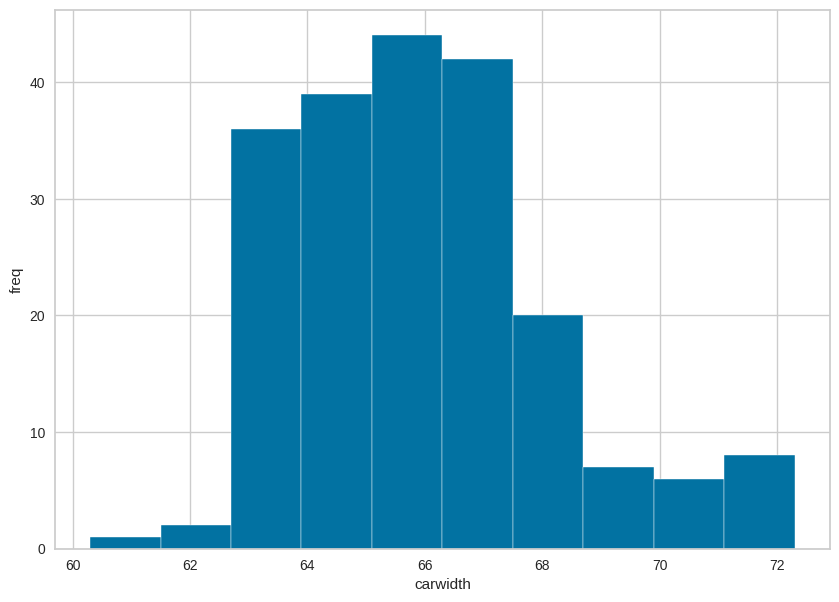

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.06it/s]


          sumsquare_error         aic         bic  kl_div  ks_statistic  \
norm             1.580809  568.024869 -986.693944     inf      0.075159   
gamma            1.583531  570.072873 -981.018259     inf      0.078068   
lognorm          1.584819  570.336847 -980.851639     inf      0.079434   
chi2             1.593917  569.422453 -979.678174     inf      0.094065   
rayleigh         1.638117  541.593892 -979.393796     inf      0.132607   

          ks_pvalue  
norm       0.187444  
gamma      0.155840  
lognorm    0.142549  
chi2       0.049752  
rayleigh   0.001325  


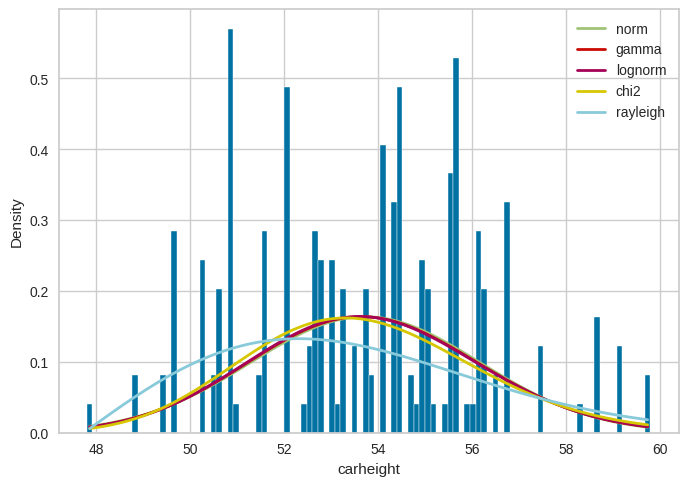

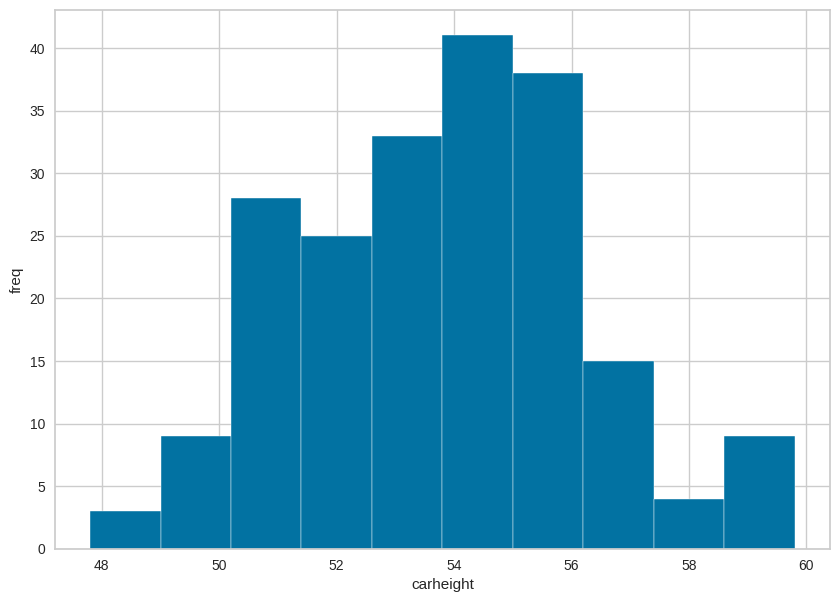

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.84it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
gamma            0.000011  1664.196807 -3412.587619     inf      0.058856   
rayleigh         0.000011  1636.242268 -3412.662705     inf      0.085801   
chi2             0.000012  1660.631043 -3399.376960     inf      0.086612   
norm             0.000013  1661.769452 -3392.377160     inf      0.111433   
cauchy           0.000013  1705.147022 -3382.969710     inf      0.147978   

          ks_pvalue  
gamma      0.459142  
rayleigh   0.092159  
chi2       0.086963  
norm       0.011322  
cauchy     0.000221  


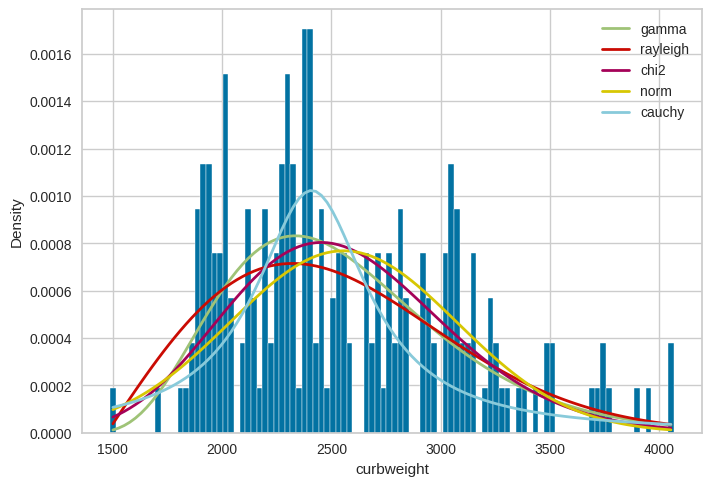

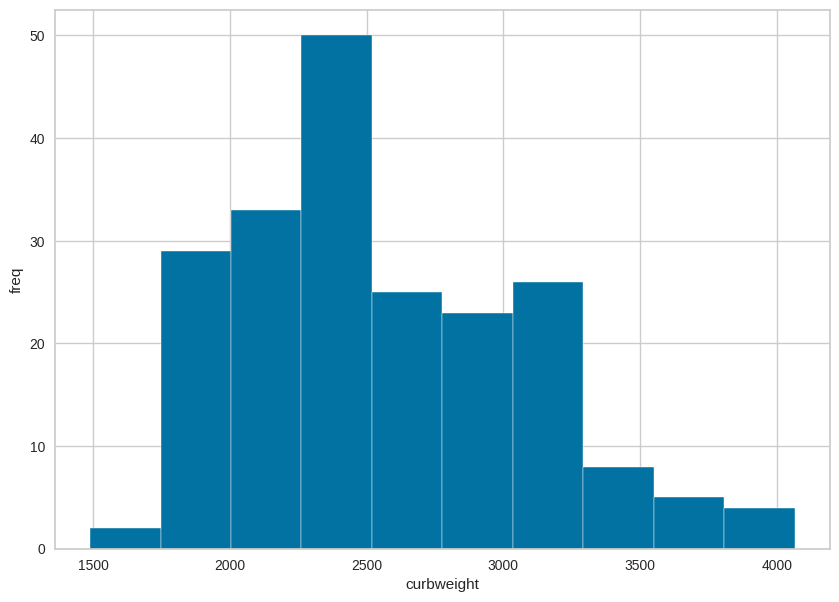

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.13it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
chi2             0.005574  1379.048288 -2139.131161     inf      0.115160   
gamma            0.005574  1379.038962 -2139.131065     inf      0.115168   
rayleigh         0.005815  1443.668330 -2135.780798     inf      0.167124   
cauchy           0.005891  1371.079516 -2133.121225     inf      0.189224   
norm             0.006129  1529.192319 -2125.000547     inf      0.181165   

             ks_pvalue  
chi2      7.974986e-03  
gamma     7.968729e-03  
rayleigh  1.790779e-05  
cauchy    6.689862e-07  
norm      2.328409e-06  


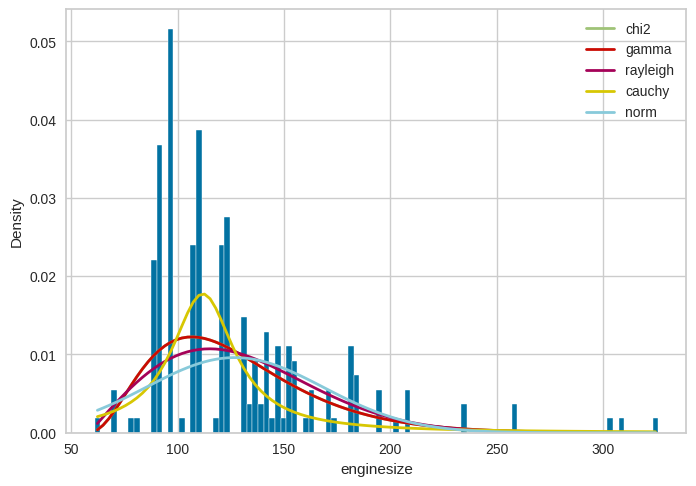

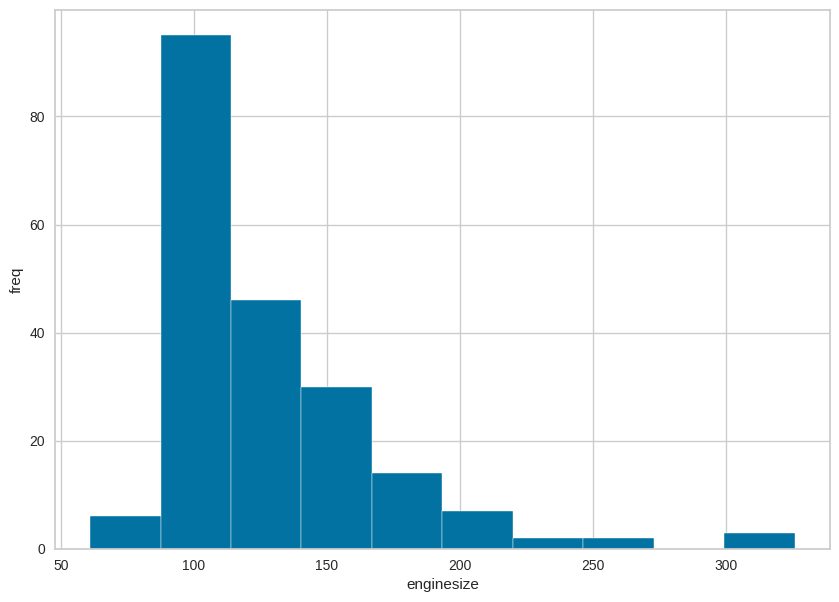

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.13it/s]


          sumsquare_error         aic        bic  kl_div  ks_statistic  \
exponpow       201.856678  143.571799  12.801360     inf      0.123588   
lognorm        202.760315  166.078511  13.717020     inf      0.119094   
gamma          202.849915  163.743585  13.807590     inf      0.121000   
norm           202.897742  160.818684   8.532908     inf      0.121905   
rayleigh       207.788782  110.267374  13.416003     inf      0.187142   

             ks_pvalue  
exponpow  3.459768e-03  
lognorm   5.440673e-03  
gamma     4.499531e-03  
norm      4.107185e-03  
rayleigh  9.281450e-07  


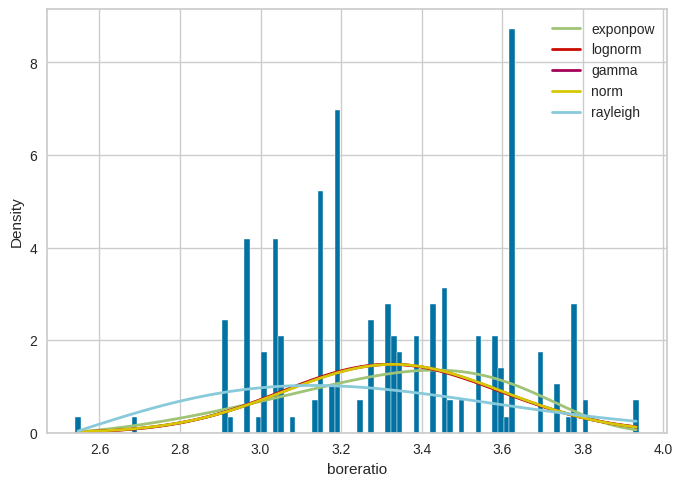

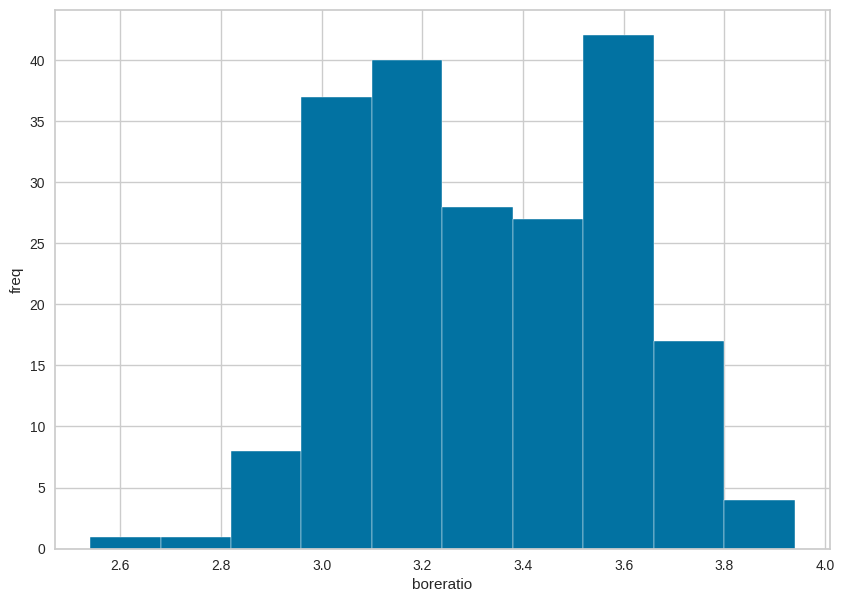

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.31it/s]


         sumsquare_error         aic         bic  kl_div  ks_statistic  \
cauchy         72.187019  321.623258 -203.322677     inf      0.093300   
norm           73.706925  349.592897 -199.051190     inf      0.118516   
lognorm        73.707866  352.410979 -193.725564     inf      0.117990   
gamma          74.892672  351.799394 -190.456526     inf      0.131487   
chi2           74.907812  346.241538 -190.415088     inf      0.131198   

         ks_pvalue  
cauchy    0.052801  
norm      0.005760  
lognorm   0.006065  
gamma     0.001499  
chi2      0.001547  


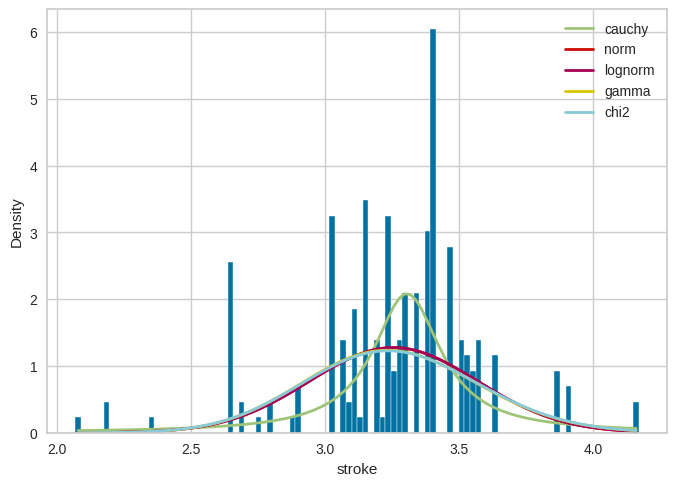

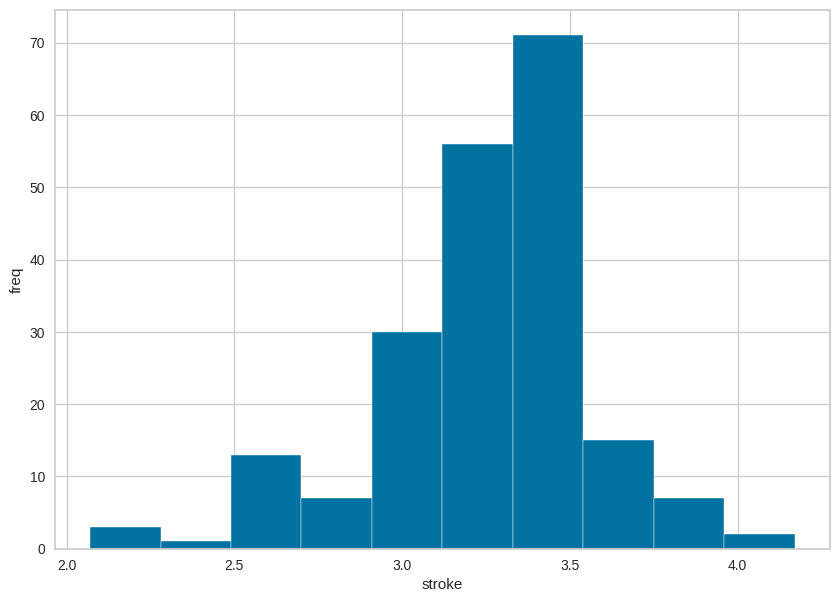

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.44it/s]


          sumsquare_error          aic         bic  kl_div  ks_statistic  \
cauchy           1.948242  1007.432760 -943.850940     inf      0.121779   
lognorm          3.055822   795.953297 -846.253060     inf      0.286310   
gamma            3.306849   753.359093 -830.068911     inf      0.327668   
expon            3.388775   742.148900 -830.375012     inf      0.315252   
rayleigh         3.573899   754.062718 -819.471322     inf      0.477854   

             ks_pvalue  
cauchy    4.159800e-03  
lognorm   2.281046e-15  
gamma     4.197239e-20  
expon     1.311654e-18  
rayleigh  1.514697e-43  


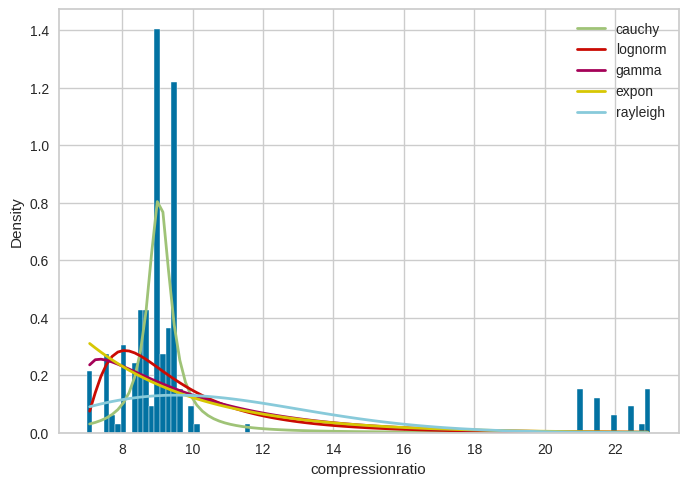

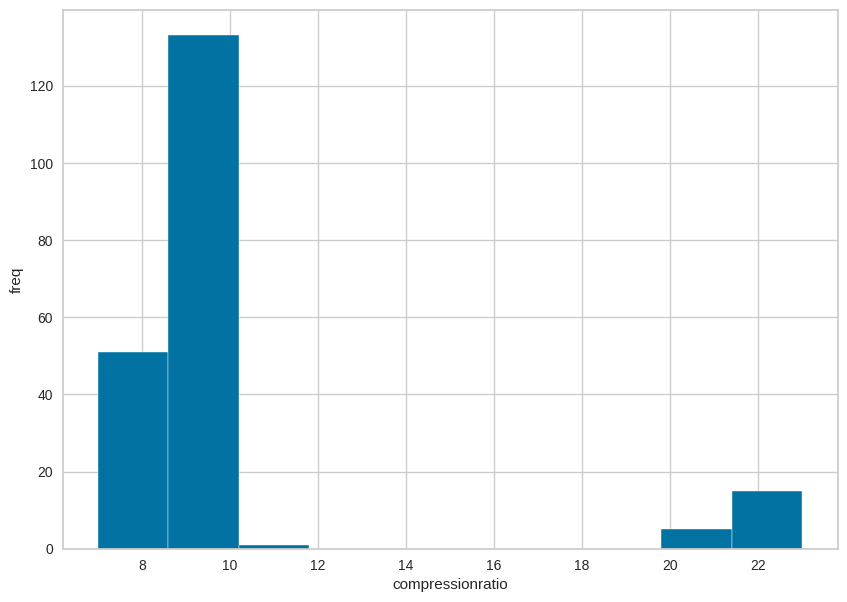

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.92it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
gamma            0.004193  1309.580786 -2197.486714     inf      0.093436   
chi2             0.004193  1309.579867 -2197.486697     inf      0.093436   
rayleigh         0.004479  1417.918397 -2189.263959     inf      0.123428   
cauchy           0.004680  1331.049047 -2180.300230     inf      0.153802   
norm             0.004764  1493.470185 -2176.631262     inf      0.137716   

          ks_pvalue  
gamma      0.052248  
chi2       0.052245  
rayleigh   0.003517  
cauchy     0.000106  
norm       0.000747  


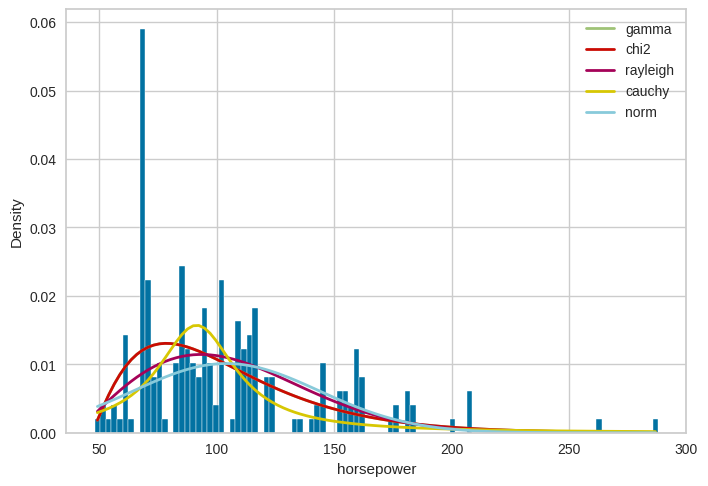

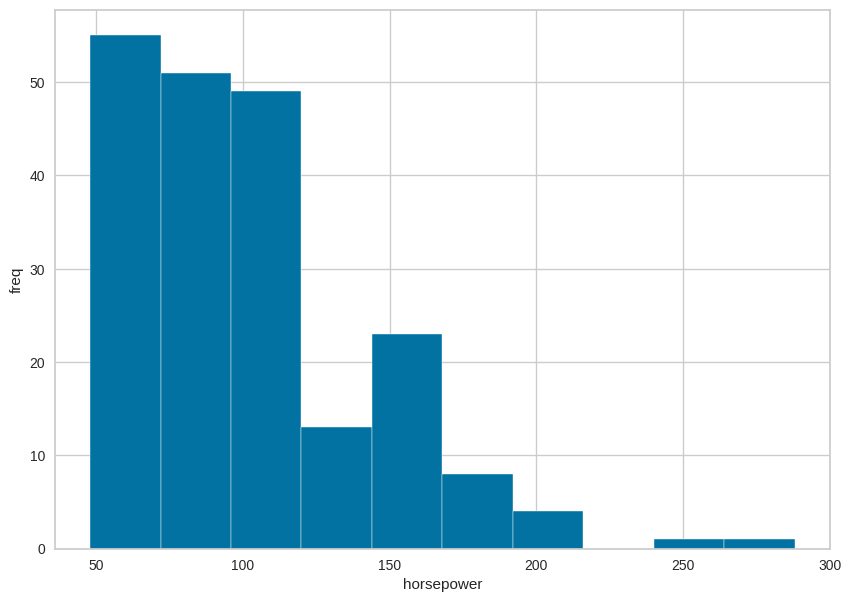

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  8.24it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
norm             0.000153  1669.287043 -2881.976000     inf      0.103196   
gamma            0.000153  1666.698850 -2876.612408     inf      0.101791   
rayleigh         0.000154  1625.978180 -2879.674281     inf      0.172474   
cauchy           0.000155  1686.957439 -2878.742351     inf      0.102903   
uniform          0.000160  1564.768661 -2872.001607     inf      0.336784   

             ks_pvalue  
norm      2.357235e-02  
gamma     2.656251e-02  
rayleigh  8.396824e-06  
cauchy    2.416937e-02  
uniform   3.052410e-21  


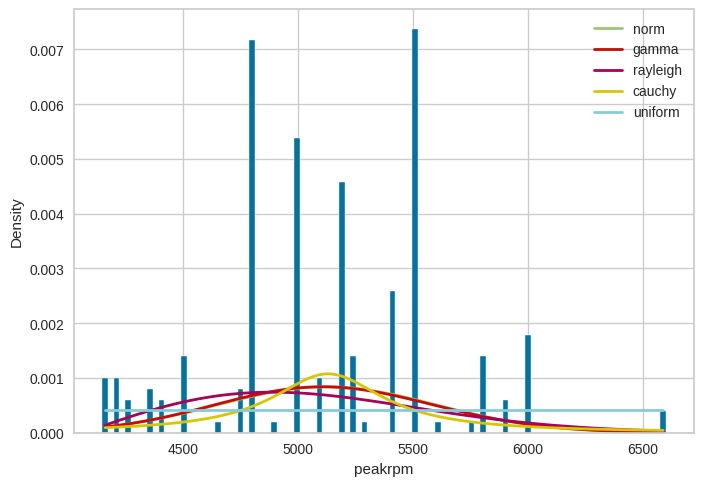

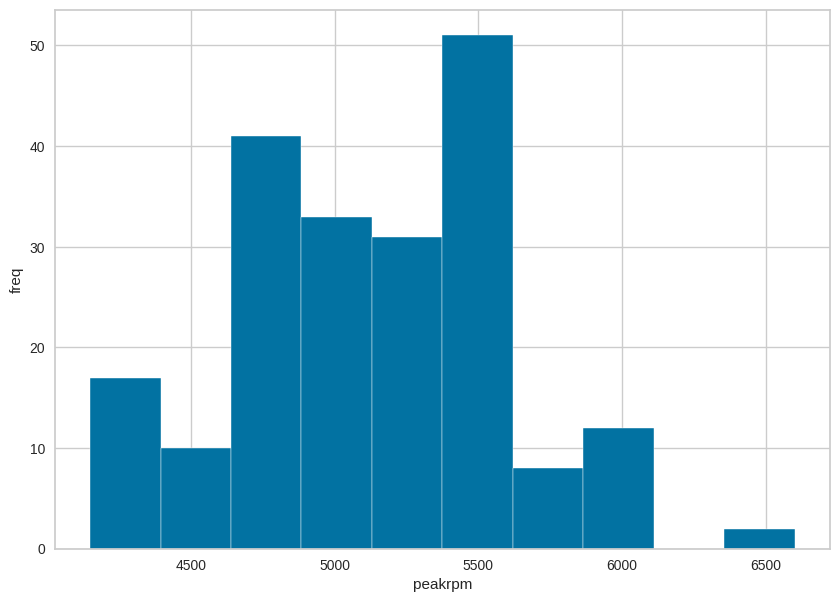

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.42it/s]


          sumsquare_error         aic          bic  kl_div  ks_statistic  \
rayleigh         0.442296  840.564058 -1247.805284     inf      0.085012   
gamma            0.443851  838.705493 -1241.762700     inf      0.098153   
chi2             0.443851  838.705592 -1241.762692     inf      0.098153   
lognorm          0.444385  841.439704 -1241.516096     inf      0.103366   
norm             0.444726  894.955509 -1246.681697     inf      0.098001   

          ks_pvalue  
rayleigh   0.097456  
gamma      0.035916  
chi2       0.035916  
lognorm    0.023230  
norm       0.036363  


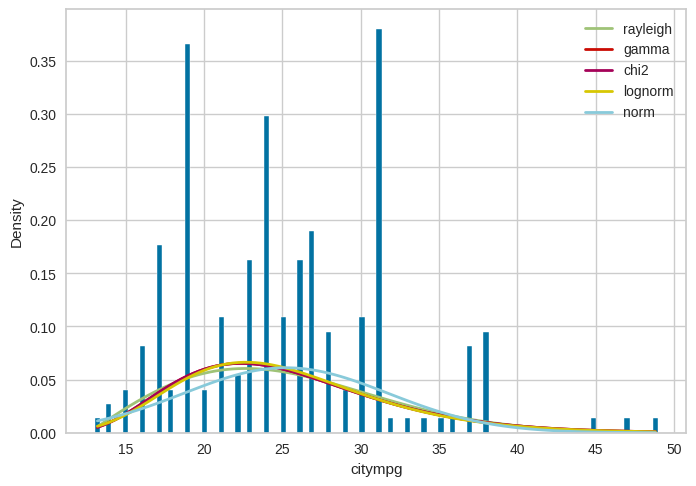

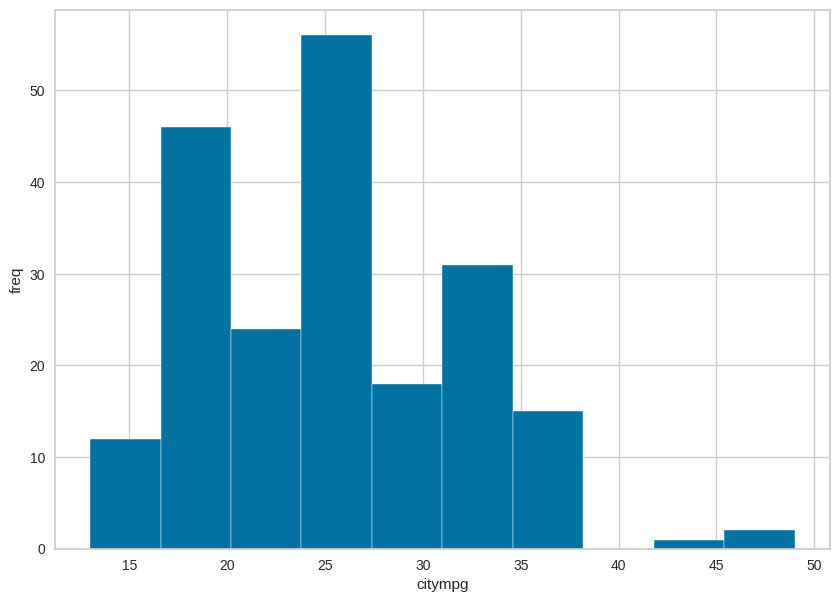

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.31it/s]


          sumsquare_error         aic          bic  kl_div  ks_statistic  \
chi2             0.292389  842.216181 -1327.330091     inf      0.086098   
gamma            0.292389  842.216315 -1327.330090     inf      0.086098   
lognorm          0.292477  842.441731 -1327.268485     inf      0.087876   
norm             0.293942  866.424856 -1331.567179     inf      0.091442   
rayleigh         0.295650  809.701100 -1330.380031     inf      0.107853   

          ks_pvalue  
chi2       0.090225  
gamma      0.090225  
lognorm    0.079363  
norm       0.060879  
rayleigh   0.015680  


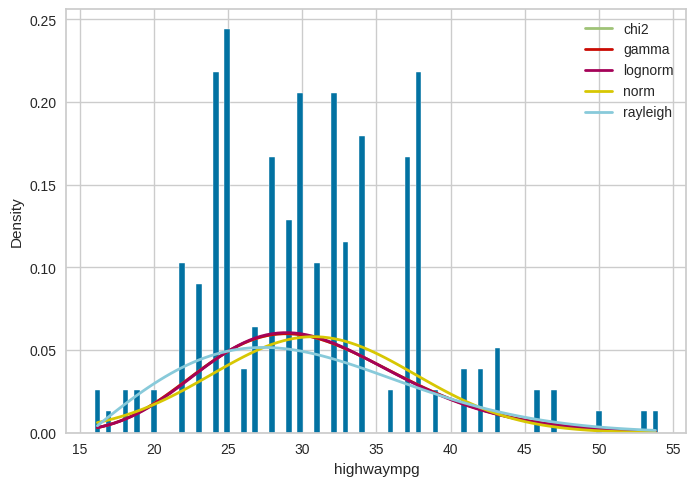

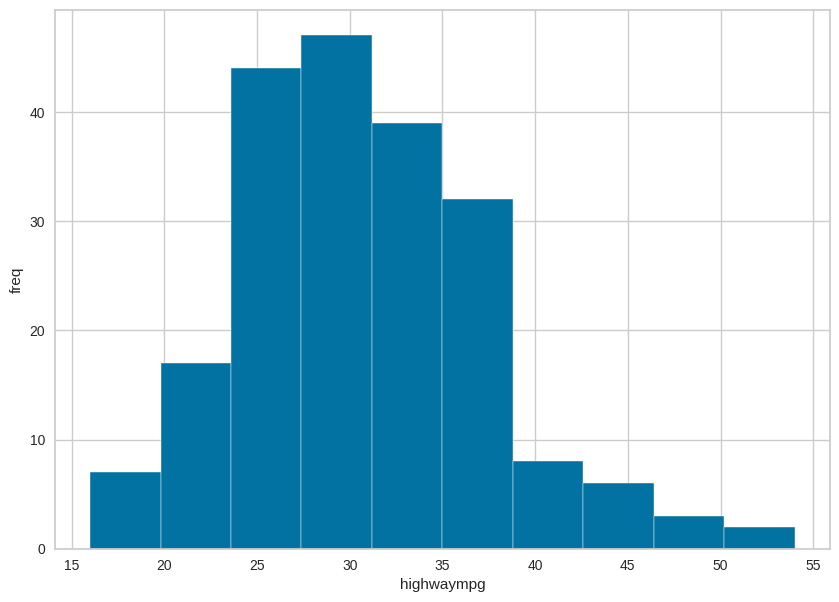

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 10.37it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
gamma        4.189945e-08  2310.349985 -4557.786612     inf      0.059106   
expon        4.624151e-08  2299.098263 -4542.895545     inf      0.075596   
cauchy       5.924007e-08  2415.067342 -4492.112883     inf      0.190348   
exponpow     6.765883e-08  2281.425575 -4459.549562     inf      0.126428   
rayleigh     7.279740e-08  2397.690706 -4449.866083     inf      0.185115   

             ks_pvalue  
gamma     4.537460e-01  
expon     1.824086e-01  
cauchy    5.596951e-07  
exponpow  2.576518e-03  
rayleigh  1.272268e-06  


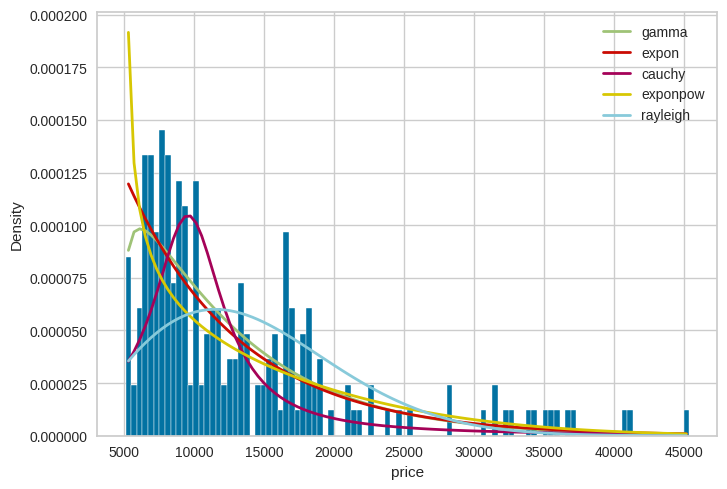

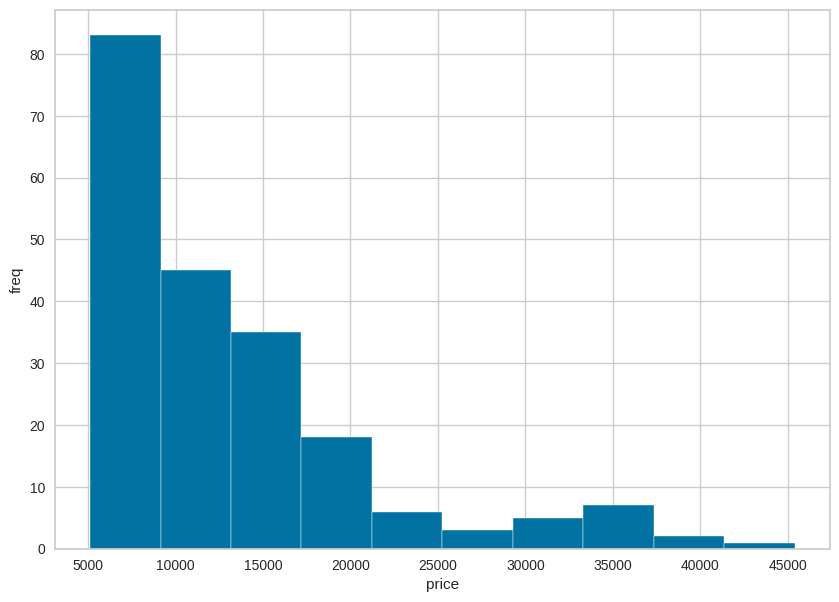

In [176]:
cols = data.drop(columns = ['CarName',
 'fueltype',
 'aspiration',
 'doornumber',
 'carbody',
 'drivewheel',
 'enginelocation',
 'enginetype',
 'cylindernumber',
 'fuelsystem'])


for col in cols:

  col_vs = data[col].values
  f = Fitter(col_vs, distributions=get_common_distributions())
  f.fit()
  print(f.summary())
  plt.ylabel("Density")
  plt.xlabel(f"{col}")
  
  col_list = data[col].to_list()
  fig, ax = plt.subplots(figsize =(10, 7))
  ax.hist(col_list) #, bins = [0, 25, 50, 75, 100])
  
  plt.xlabel(f"{col}")
  plt.ylabel("freq")
  plt.show()

In [177]:
data.describe()


,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,...,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,103.000000,0.834146,77.209756,0.902439,0.180488,0.439024,2.614634,1.326829,0.014634,98.756585,...,126.907317,3.253659,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,59.322565,1.245307,41.014583,0.297446,0.385535,0.497483,0.859081,0.556171,0.120377,6.021776,...,41.642693,2.013204,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,1.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,86.600000,...,61.000000,0.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,52.000000,0.000000,44.000000,1.000000,0.000000,0.000000,2.000000,1.000000,0.000000,94.500000,...,97.000000,1.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,103.000000,1.000000,80.000000,1.000000,0.000000,0.000000,3.000000,1.000000,0.000000,97.000000,...,120.000000,5.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,154.000000,2.000000,115.000000,1.000000,0.000000,1.000000,3.000000,2.000000,0.000000,102.400000,...,141.000000,5.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,205.000000,3.000000,146.000000,1.000000,1.000000,1.000000,4.000000,2.000000,1.000000,120.900000,...,326.000000,7.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


### *Min and Max Scaling*

In [178]:
from sklearn import preprocessing

print(data.columns)

x = data.drop(columns = cat_cols)
x = x.drop(columns=['price'])

min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
print(x_scaled)

num_cols_ = num_cols[:-1]
print(x_scaled.shape, len(num_cols), num_cols)

data_norm = pd.DataFrame(data=x_scaled, columns=num_cols_)
data_norm['price'] = data['price']

Index(['car_ID', 'symboling', 'CarName', 'fueltype', 'aspiration',
       'doornumber', 'carbody', 'drivewheel', 'enginelocation', 'wheelbase',
       'carlength', 'carwidth', 'carheight', 'curbweight', 'enginetype',
       'cylindernumber', 'enginesize', 'fuelsystem', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'price'],
      dtype='object')
[[0.         1.         0.05830904 ... 0.34693878 0.22222222 0.28947368]
 [0.00490196 1.         0.05830904 ... 0.34693878 0.22222222 0.28947368]
 [0.00980392 0.6        0.2303207  ... 0.34693878 0.16666667 0.26315789]
 ...
 [0.99019608 0.2        0.65597668 ... 0.55102041 0.13888889 0.18421053]
 [0.99509804 0.2        0.65597668 ... 0.26530612 0.36111111 0.28947368]
 [1.         0.2        0.65597668 ... 0.51020408 0.16666667 0.23684211]]
(205, 15) 16 Index(['car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth',
       'carheight', 'curbweight', 'enginesize', 'boreratio', 'stro

In [179]:
data_norm.head()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,0.000000,1.0,0.058309,0.413433,0.316667,0.083333,0.411171,0.260377,0.664286,0.290476,0.1250,0.262500,0.346939,0.222222,0.289474,13495.0
1,0.004902,1.0,0.058309,0.413433,0.316667,0.083333,0.411171,0.260377,0.664286,0.290476,0.1250,0.262500,0.346939,0.222222,0.289474,16500.0
2,0.009804,0.6,0.230321,0.449254,0.433333,0.383333,0.517843,0.343396,0.100000,0.666667,0.1250,0.441667,0.346939,0.166667,0.263158,16500.0
3,0.014706,0.8,0.384840,0.529851,0.491667,0.541667,0.329325,0.181132,0.464286,0.633333,0.1875,0.225000,0.551020,0.305556,0.368421,13950.0
4,0.019608,0.8,0.373178,0.529851,0.508333,0.541667,0.518231,0.283019,0.464286,0.633333,0.0625,0.279167,0.551020,0.138889,0.157895,17450.0


In [180]:
data_norm.describe()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.500000,0.566829,0.354419,0.491780,0.467317,0.493740,0.414106,0.248707,0.564111,0.564483,0.196409,0.233821,0.398009,0.339431,0.388190,13276.710571
std,0.290797,0.249061,0.175562,0.184139,0.178767,0.203627,0.201971,0.157142,0.193460,0.149332,0.248253,0.164767,0.194688,0.181726,0.181222,7988.852332
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5118.000000
25%,0.250000,0.400000,0.230321,0.376119,0.316667,0.350000,0.254849,0.135849,0.435714,0.495238,0.100000,0.091667,0.265306,0.166667,0.236842,7788.000000
50%,0.500000,0.600000,0.303207,0.479104,0.433333,0.525000,0.359193,0.222642,0.550000,0.580952,0.125000,0.195833,0.428571,0.305556,0.368421,10295.000000
75%,0.750000,0.800000,0.460641,0.626866,0.550000,0.641667,0.561288,0.301887,0.742857,0.638095,0.150000,0.283333,0.551020,0.472222,0.473684,16503.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,45400.000000


In [181]:
data_norm.corr()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
car_ID,1.000000,-0.151621,0.129729,0.170636,0.052387,0.255960,0.071962,-0.033930,0.260064,-0.160824,0.150276,-0.015006,-0.203789,0.015940,0.011255,-0.109093
symboling,-0.151621,1.000000,-0.531954,-0.357612,-0.232919,-0.541038,-0.227691,-0.105790,-0.130051,-0.008735,-0.178515,0.070873,0.273606,-0.035823,0.034606,-0.079978
wheelbase,0.129729,-0.531954,1.000000,0.874587,0.795144,0.589435,0.776386,0.569329,0.488750,0.160959,0.249786,0.353294,-0.360469,-0.470414,-0.544082,0.577816
carlength,0.170636,-0.357612,0.874587,1.000000,0.841118,0.491029,0.877728,0.683360,0.606454,0.129533,0.158414,0.552623,-0.287242,-0.670909,-0.704662,0.682920
carwidth,0.052387,-0.232919,0.795144,0.841118,1.000000,0.279210,0.867032,0.735433,0.559150,0.182942,0.181129,0.640732,-0.220012,-0.642704,-0.677218,0.759325
carheight,0.255960,-0.541038,0.589435,0.491029,0.279210,1.000000,0.295572,0.067149,0.171071,-0.055307,0.261214,-0.108802,-0.320411,-0.048640,-0.107358,0.119336
curbweight,0.071962,-0.227691,0.776386,0.877728,0.867032,0.295572,1.000000,0.850594,0.648480,0.168790,0.151362,0.750739,-0.266243,-0.757414,-0.797465,0.835305
enginesize,-0.033930,-0.105790,0.569329,0.683360,0.735433,0.067149,0.850594,1.000000,0.583774,0.203129,0.028971,0.809769,-0.244660,-0.653658,-0.677470,0.874145
boreratio,0.260064,-0.130051,0.488750,0.606454,0.559150,0.171071,0.648480,0.583774,1.000000,-0.055909,0.005197,0.573677,-0.254976,-0.584532,-0.587012,0.553173
stroke,-0.160824,-0.008735,0.160959,0.129533,0.182942,-0.055307,0.168790,0.203129,-0.055909,1.000000,0.186110,0.080940,-0.067964,-0.042145,-0.043931,0.079443


In [182]:
data_norm[['enginesize', 'stroke']]

,enginesize,stroke
0,0.260377,0.290476
1,0.260377,0.290476
2,0.343396,0.666667
3,0.181132,0.633333
4,0.283019,0.633333
...,...,...
200,0.301887,0.514286
201,0.301887,0.514286
202,0.422642,0.380952
203,0.316981,0.633333


In [183]:
final_data = pd.concat([data_norm, data[cat_cols]], axis=1)

In [184]:
final_data.head()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,...,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,enginetype,cylindernumber,fuelsystem
0,0.000000,1.0,0.058309,0.413433,0.316667,0.083333,0.411171,0.260377,0.664286,0.290476,...,2,1,0,1,0,2,0,0,2,5
1,0.004902,1.0,0.058309,0.413433,0.316667,0.083333,0.411171,0.260377,0.664286,0.290476,...,3,1,0,1,0,2,0,0,2,5
2,0.009804,0.6,0.230321,0.449254,0.433333,0.383333,0.517843,0.343396,0.100000,0.666667,...,1,1,0,1,2,2,0,5,3,5
3,0.014706,0.8,0.384840,0.529851,0.491667,0.541667,0.329325,0.181132,0.464286,0.633333,...,4,1,0,0,3,1,0,3,2,5
4,0.019608,0.8,0.373178,0.529851,0.508333,0.541667,0.518231,0.283019,0.464286,0.633333,...,5,1,0,0,3,0,0,3,1,5


### *Correlation Matrix*

In [185]:
final_data.corr()['price']

car_ID             -0.109093
symboling          -0.079978
wheelbase           0.577816
carlength           0.682920
carwidth            0.759325
carheight           0.119336
curbweight          0.835305
enginesize          0.874145
boreratio           0.553173
stroke              0.079443
compressionratio    0.067984
horsepower          0.808139
peakrpm            -0.085267
citympg            -0.685751
highwaympg         -0.697599
price               1.000000
CarName            -0.231439
fueltype           -0.105679
aspiration          0.177926
doornumber         -0.031835
carbody            -0.083976
drivewheel          0.577992
enginelocation      0.324973
enginetype          0.049171
cylindernumber     -0.027628
fuelsystem          0.526823
Name: price, dtype: float64

In [186]:
final_data.corr()['price'] >= 0.4

car_ID              False
symboling           False
wheelbase            True
carlength            True
carwidth             True
carheight           False
curbweight           True
enginesize           True
boreratio            True
stroke              False
compressionratio    False
horsepower           True
peakrpm             False
citympg             False
highwaympg          False
price                True
CarName             False
fueltype            False
aspiration          False
doornumber          False
carbody             False
drivewheel           True
enginelocation      False
enginetype          False
cylindernumber      False
fuelsystem           True
Name: price, dtype: bool

In [187]:
# ['wheelbase','carlength','carwidth','curbweight','enginesize','boreratio','fuelsystem']

<Axes: >

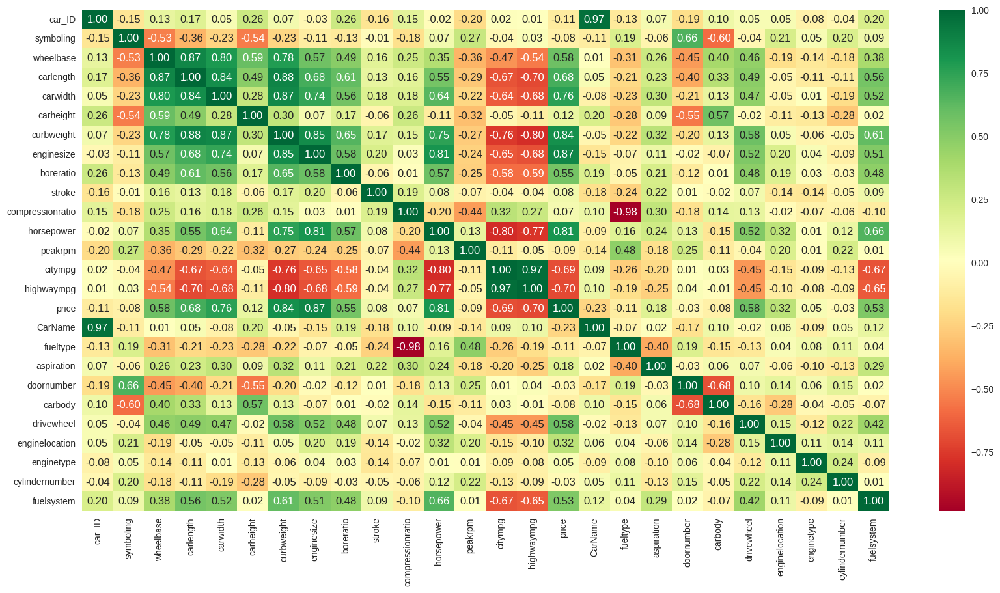

In [188]:
plt.figure(figsize=(20,10))
sns.heatmap(final_data.corr(), annot =True, cmap = "RdYlGn", fmt= '.2f')

We used corelation matrix to find the best independent variables to predict the price column, and from my observations,it's best to use 'wheelbase','carlength','carwidth','curbweight','enginesize','boreratio','fuelsystem'.

### *QQ Plot*

<Figure size 800x500 with 0 Axes>

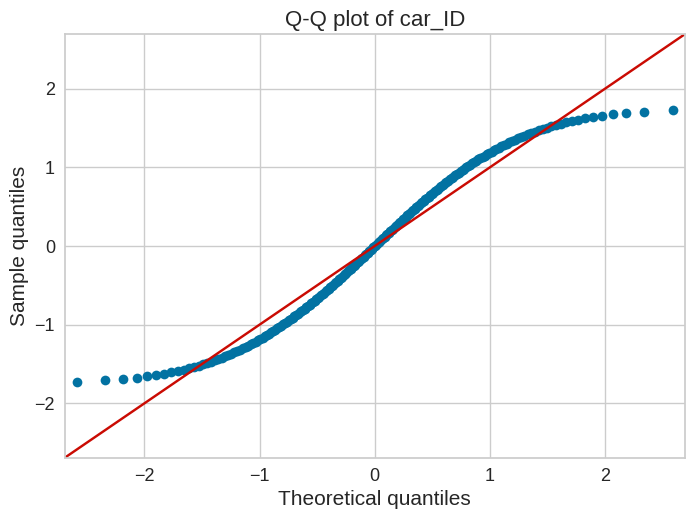

<Figure size 800x500 with 0 Axes>

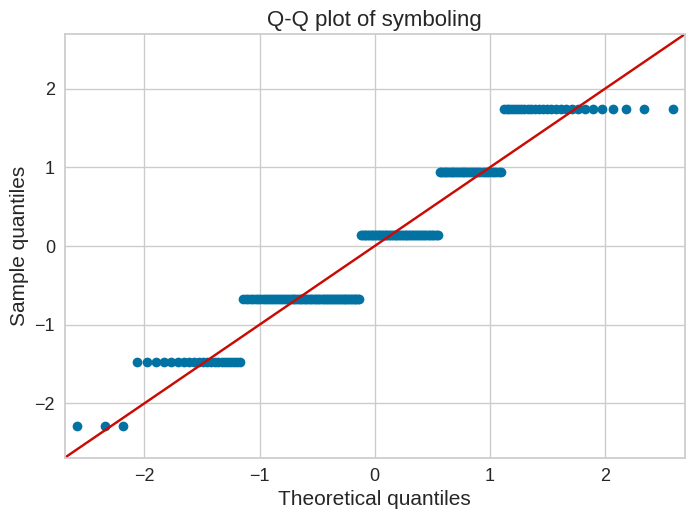

<Figure size 800x500 with 0 Axes>

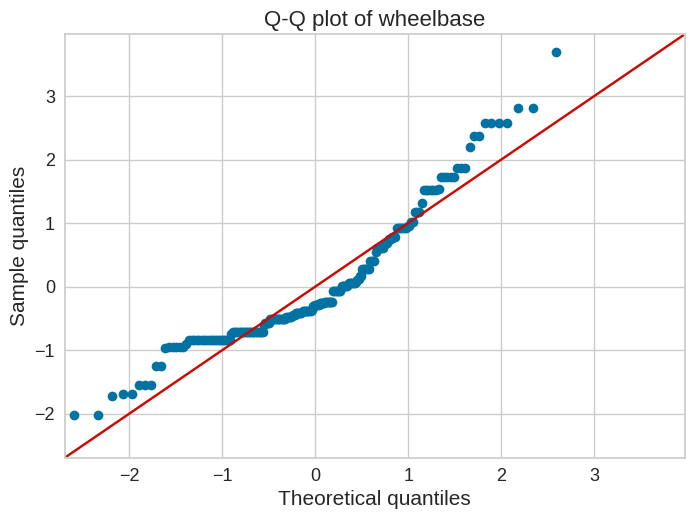

<Figure size 800x500 with 0 Axes>

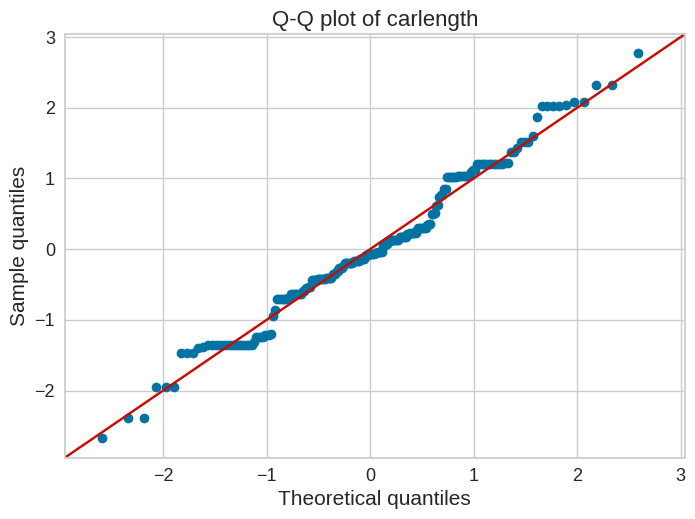

<Figure size 800x500 with 0 Axes>

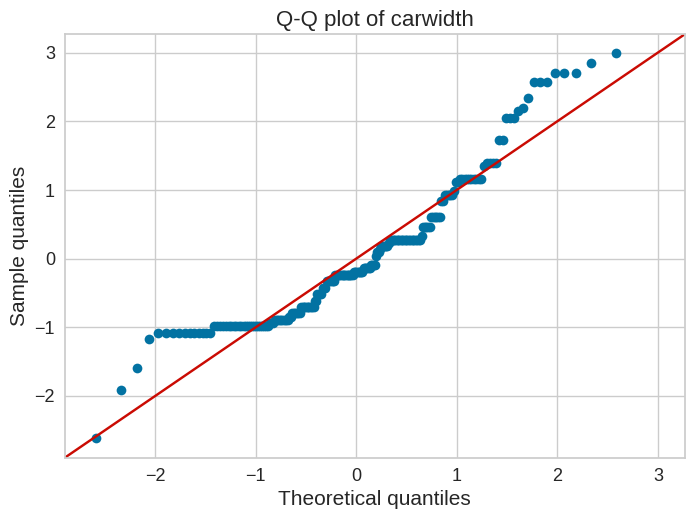

<Figure size 800x500 with 0 Axes>

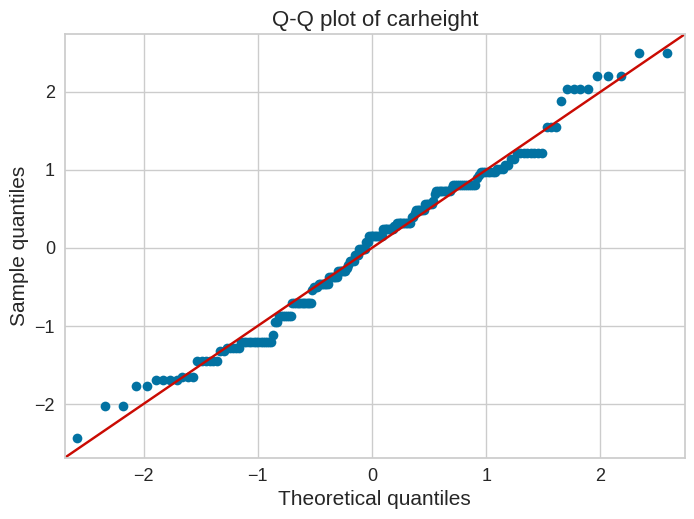

<Figure size 800x500 with 0 Axes>

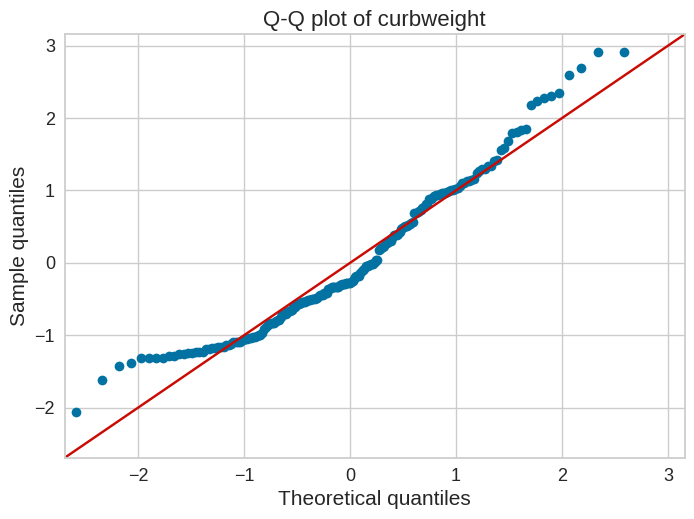

<Figure size 800x500 with 0 Axes>

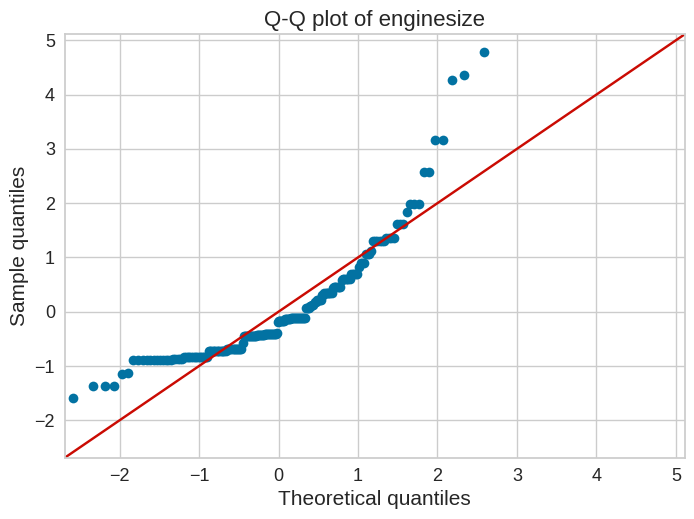

<Figure size 800x500 with 0 Axes>

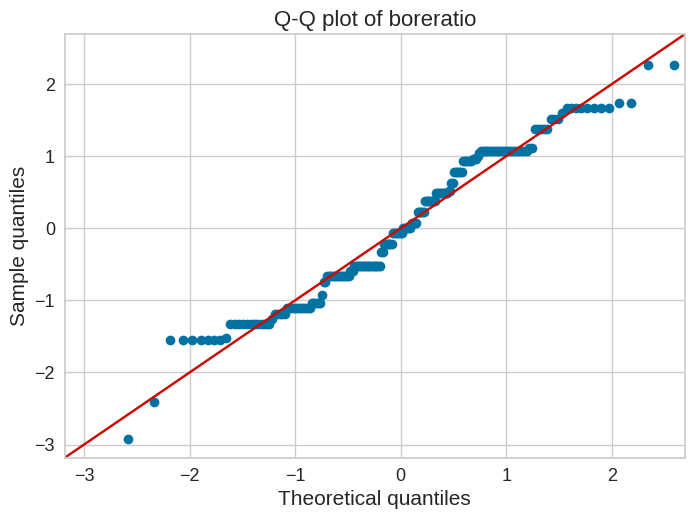

<Figure size 800x500 with 0 Axes>

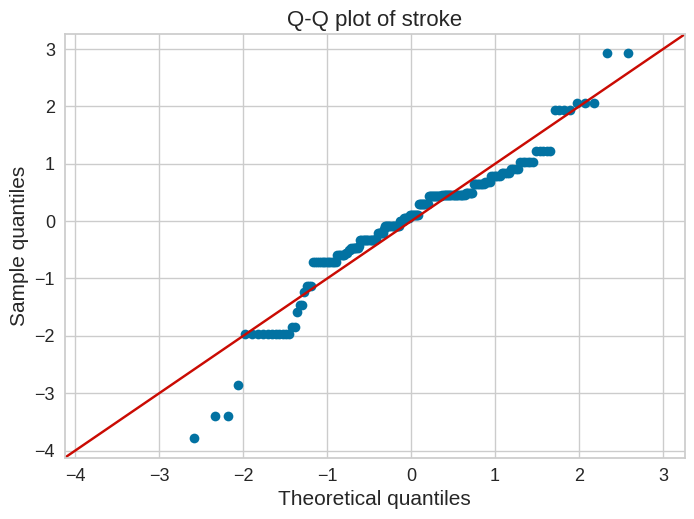

<Figure size 800x500 with 0 Axes>

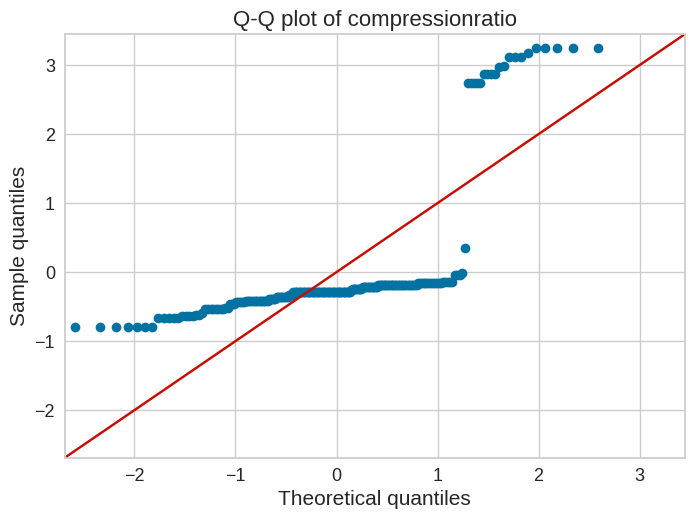

<Figure size 800x500 with 0 Axes>

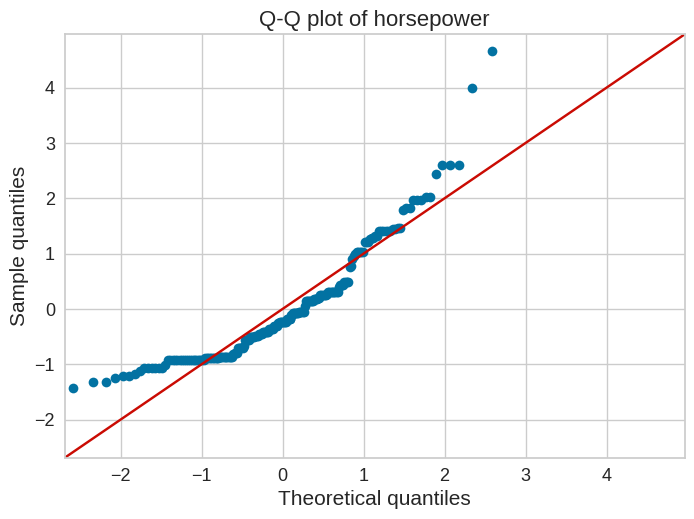

<Figure size 800x500 with 0 Axes>

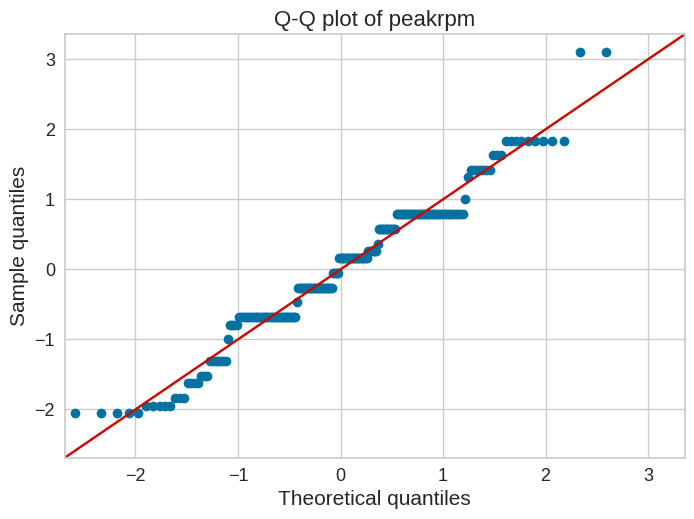

<Figure size 800x500 with 0 Axes>

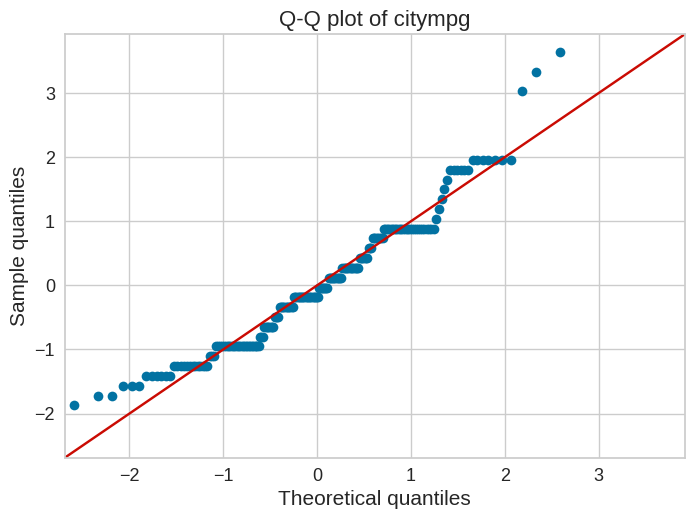

<Figure size 800x500 with 0 Axes>

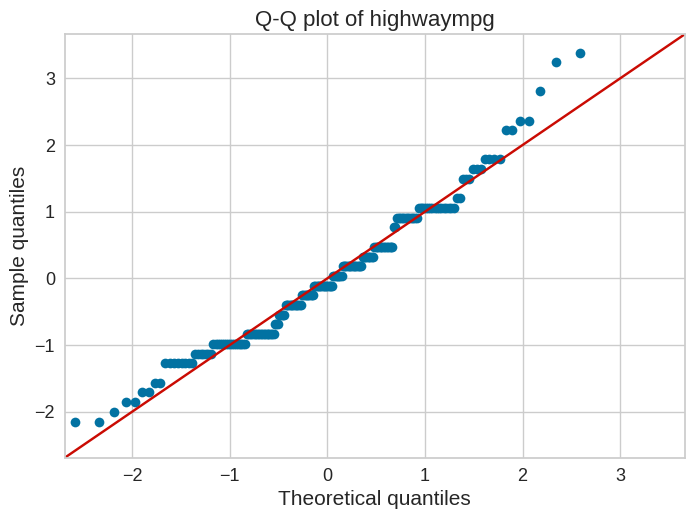

<Figure size 800x500 with 0 Axes>

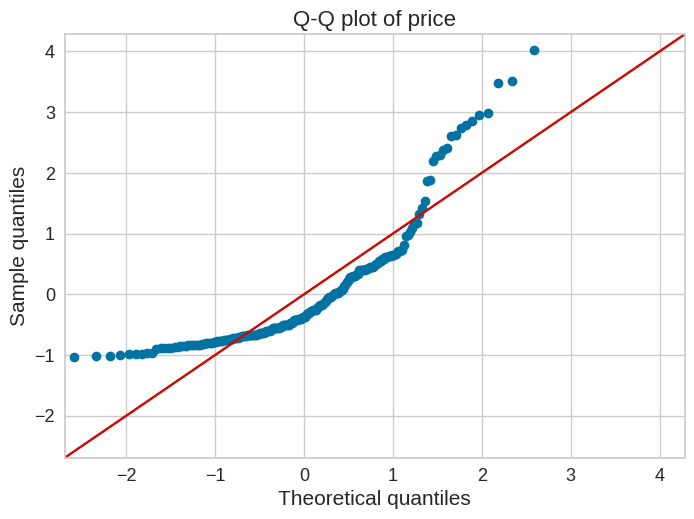

<Figure size 800x500 with 0 Axes>

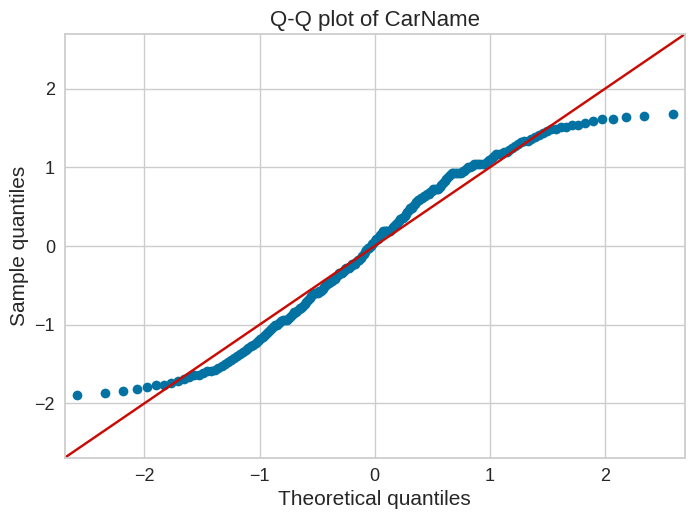

<Figure size 800x500 with 0 Axes>

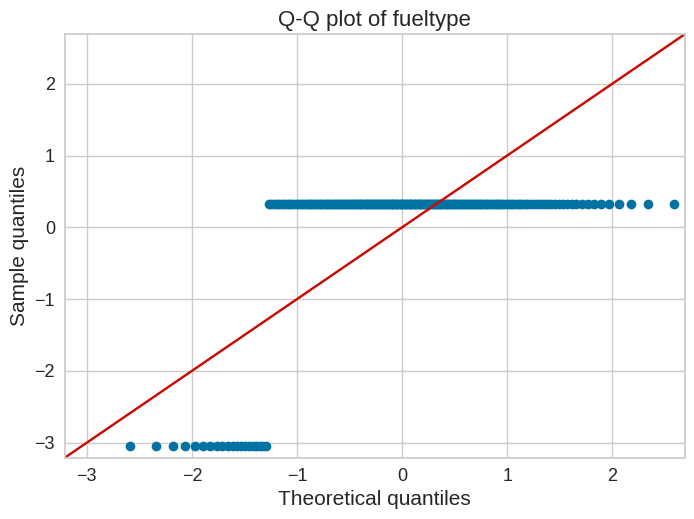

<Figure size 800x500 with 0 Axes>

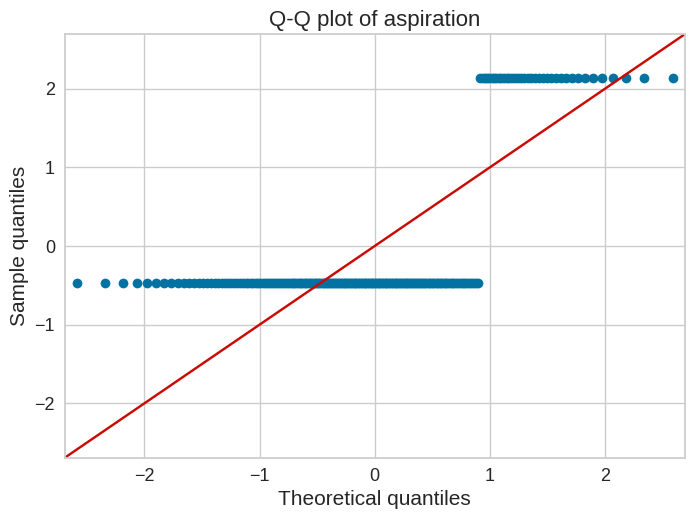

<Figure size 800x500 with 0 Axes>

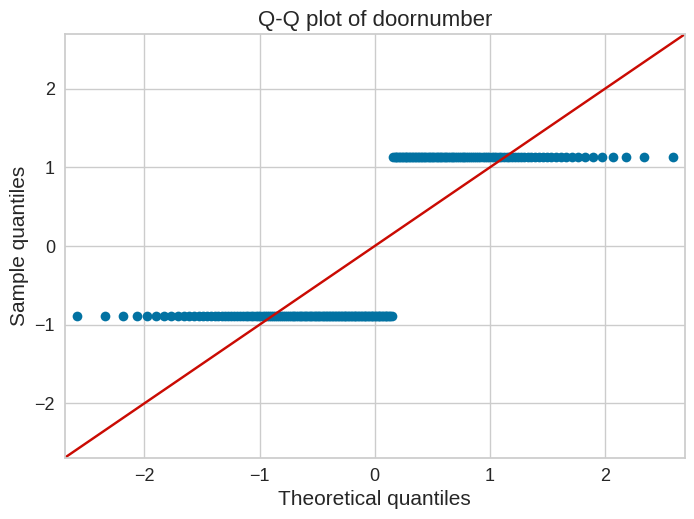

<Figure size 800x500 with 0 Axes>

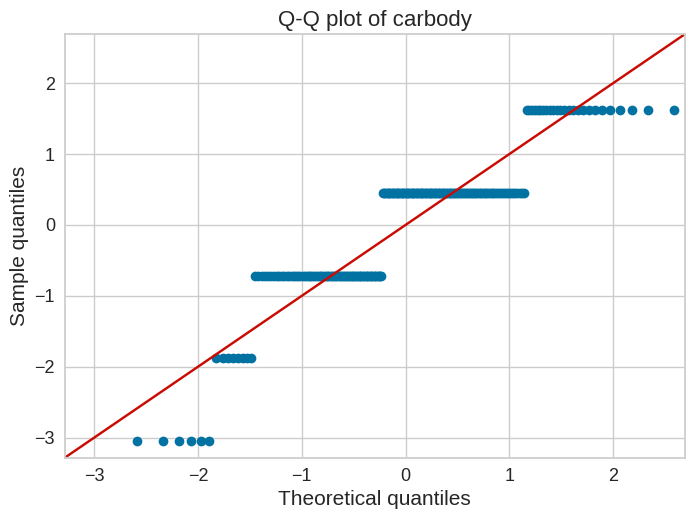

<Figure size 800x500 with 0 Axes>

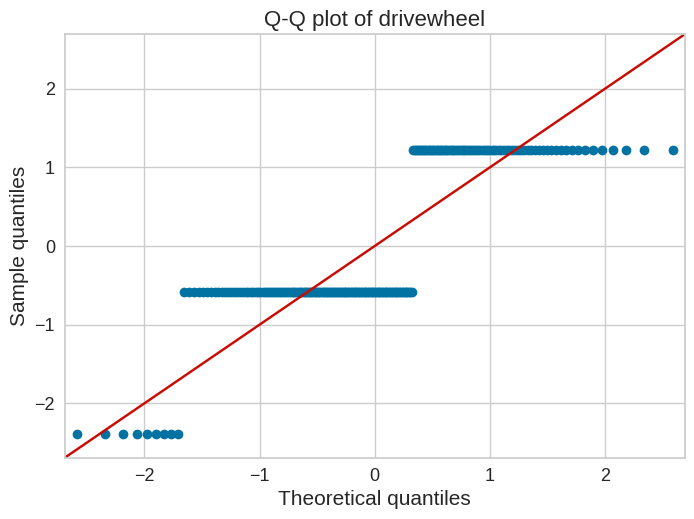

<Figure size 800x500 with 0 Axes>

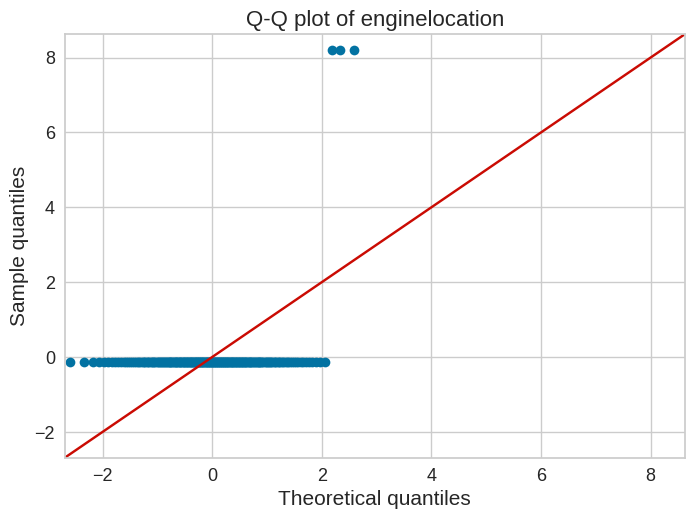

<Figure size 800x500 with 0 Axes>

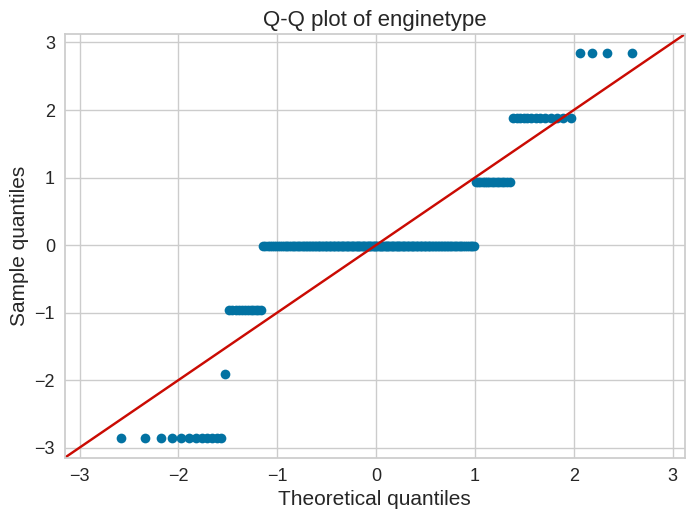

<Figure size 800x500 with 0 Axes>

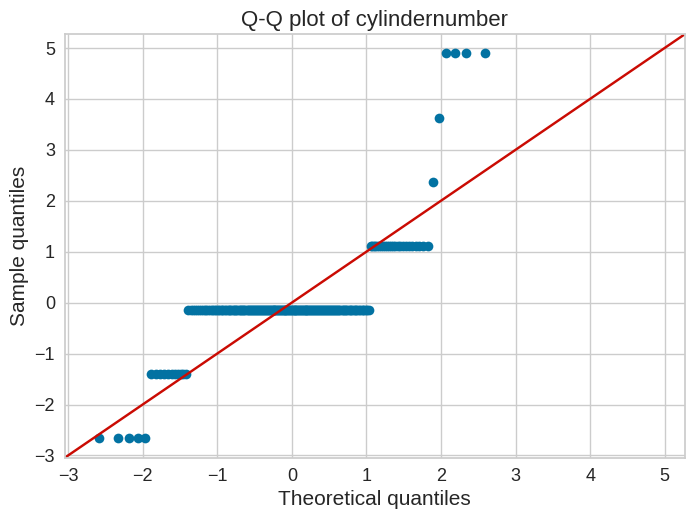

<Figure size 800x500 with 0 Axes>

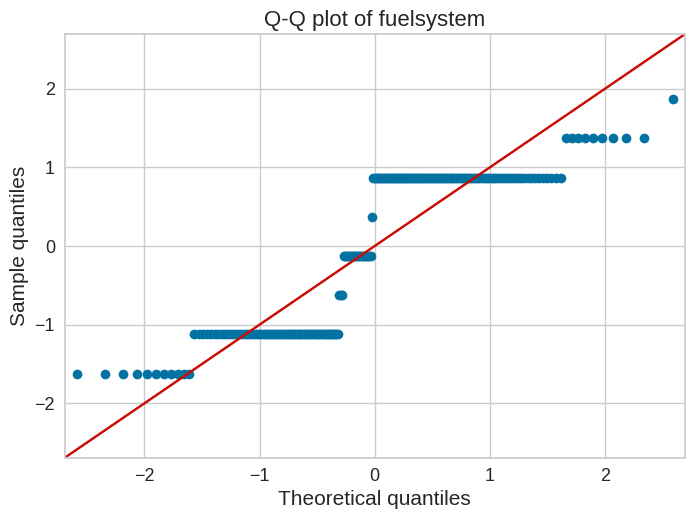

In [189]:
#checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
# data_norm=data[['car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth','carheight','curbweight','enginesize','boreratio','stroke','compressionratio','horsepower','peakrpm','citympg','highwaympg','price']]
for c in final_data.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(final_data[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

In [190]:
final_data.head()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,...,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,enginetype,cylindernumber,fuelsystem
0,0.000000,1.0,0.058309,0.413433,0.316667,0.083333,0.411171,0.260377,0.664286,0.290476,...,2,1,0,1,0,2,0,0,2,5
1,0.004902,1.0,0.058309,0.413433,0.316667,0.083333,0.411171,0.260377,0.664286,0.290476,...,3,1,0,1,0,2,0,0,2,5
2,0.009804,0.6,0.230321,0.449254,0.433333,0.383333,0.517843,0.343396,0.100000,0.666667,...,1,1,0,1,2,2,0,5,3,5
3,0.014706,0.8,0.384840,0.529851,0.491667,0.541667,0.329325,0.181132,0.464286,0.633333,...,4,1,0,0,3,1,0,3,2,5
4,0.019608,0.8,0.373178,0.529851,0.508333,0.541667,0.518231,0.283019,0.464286,0.633333,...,5,1,0,0,3,0,0,3,1,5


In [191]:
from sklearn.model_selection import train_test_split
X = final_data.drop(columns=['price'])
y = final_data['price']
print(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

0      13495.0
1      16500.0
2      16500.0
3      13950.0
4      17450.0
        ...   
200    16845.0
201    19045.0
202    21485.0
203    22470.0
204    22625.0
Name: price, Length: 205, dtype: float64


### *BoxPlot*

<Axes: >

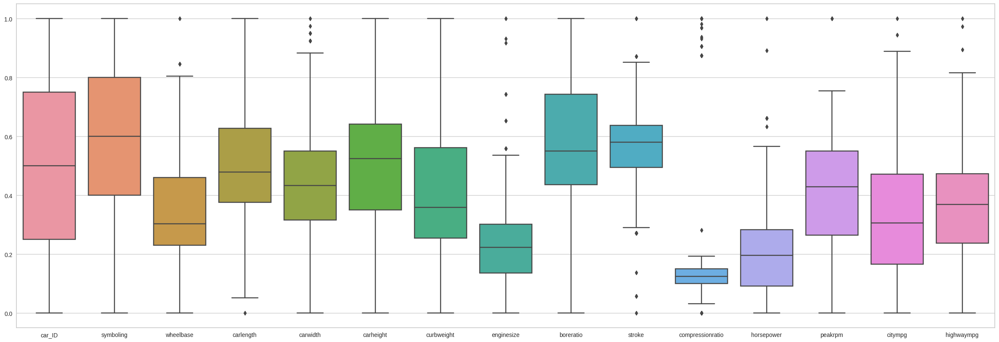

In [192]:
plt.figure(figsize=(30,10))
sns.boxplot(data=final_data.drop(columns=cat_cols+['price']))

In [193]:
list(final_data.duplicated()).count(False) == len(final_data) #to check for duplicates in independent variables

True

In [194]:
final_data = final_data.drop_duplicates()
X = final_data.drop(columns = ['price'])
y = final_data['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

train_df = pd.DataFrame(data = X_train,columns = X_train.columns)
train_df['price'] = y_train

test_df = pd.DataFrame(data = X_test,columns = X_test.columns)
test_df['price'] = y_test



In [195]:
cols = final_data.columns[:-1].values
Q1 = final_data[cols].quantile(0.25)
Q3 = final_data[cols].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 
print('InterQuartile Range\n',IQR)
# filter = (df['AVG'] >= Q1 - 1.5 * IQR) & (df['AVG'] <= Q3 + 1.5 *IQR)
# IQR['Solidity']

rm_outlier_df = final_data
for col in cols:
  print(col)
  filter = (rm_outlier_df[{col}] >= Q1[{col}] - 1.5 * IQR[{col}]) & (rm_outlier_df[{col}] <= Q3[{col}] + 1.5 *IQR[{col}])
  rm_outlier_df = rm_outlier_df.loc[filter[col]]
print('new_df shape',final_data.shape)

print('rm_outlier_df',rm_outlier_df.shape)

InterQuartile Range
 car_ID                 0.500000
symboling              0.400000
wheelbase              0.230321
carlength              0.250746
carwidth               0.233333
carheight              0.291667
curbweight             0.306439
enginesize             0.166038
boreratio              0.307143
stroke                 0.142857
compressionratio       0.050000
horsepower             0.191667
peakrpm                0.285714
citympg                0.305556
highwaympg             0.236842
price               8715.000000
CarName               71.000000
fueltype               0.000000
aspiration             0.000000
doornumber             1.000000
carbody                1.000000
drivewheel             1.000000
enginelocation         0.000000
enginetype             0.000000
cylindernumber         0.000000
dtype: float64
car_ID
symboling
wheelbase
carlength
carwidth
carheight
curbweight
enginesize
boreratio
stroke
compressionratio
horsepower
peakrpm
citympg
highwaympg
price
CarName


In [196]:
rm_outlier_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98 entries, 3 to 200
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            98 non-null     float64
 1   symboling         98 non-null     float64
 2   wheelbase         98 non-null     float64
 3   carlength         98 non-null     float64
 4   carwidth          98 non-null     float64
 5   carheight         98 non-null     float64
 6   curbweight        98 non-null     float64
 7   enginesize        98 non-null     float64
 8   boreratio         98 non-null     float64
 9   stroke            98 non-null     float64
 10  compressionratio  98 non-null     float64
 11  horsepower        98 non-null     float64
 12  peakrpm           98 non-null     float64
 13  citympg           98 non-null     float64
 14  highwaympg        98 non-null     float64
 15  price             98 non-null     float64
 16  CarName           98 non-null     int64  
 17



1% data removal

In [197]:
p = 0.01
nan_1p_df = final_data.copy()
mask = np.random.choice([True, False], size=nan_1p_df['carlength'].shape, p=[p,1-p])
nan_1p_df['carlength'] = nan_1p_df['carlength'].mask(mask)

In [198]:
nan_1p_df.isna().sum()

car_ID              0
symboling           0
wheelbase           0
carlength           2
carwidth            0
carheight           0
curbweight          0
enginesize          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
enginetype          0
cylindernumber      0
fuelsystem          0
dtype: int64

In [199]:
nan_1p_df.info()
#We can see 1% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
Int64Index: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    float64
 1   symboling         205 non-null    float64
 2   wheelbase         205 non-null    float64
 3   carlength         203 non-null    float64
 4   carwidth          205 non-null    float64
 5   carheight         205 non-null    float64
 6   curbweight        205 non-null    float64
 7   enginesize        205 non-null    float64
 8   boreratio         205 non-null    float64
 9   stroke            205 non-null    float64
 10  compressionratio  205 non-null    float64
 11  horsepower        205 non-null    float64
 12  peakrpm           205 non-null    float64
 13  citympg           205 non-null    float64
 14  highwaympg        205 non-null    float64
 15  price             205 non-null    float64
 16  CarName           205 non-null    int64  
 1

5% Data removal

In [200]:
p = 0.05
nan_5p_df = final_data.copy()

mask = np.random.choice([True, False], size=nan_5p_df['carlength'].shape, p=[p,1-p])
nan_5p_df['carlength'] = nan_5p_df['carlength'].mask(mask)#We can see 5% data is made null as non null values are not same as total entries
print(nan_5p_df.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    float64
 1   symboling         205 non-null    float64
 2   wheelbase         205 non-null    float64
 3   carlength         195 non-null    float64
 4   carwidth          205 non-null    float64
 5   carheight         205 non-null    float64
 6   curbweight        205 non-null    float64
 7   enginesize        205 non-null    float64
 8   boreratio         205 non-null    float64
 9   stroke            205 non-null    float64
 10  compressionratio  205 non-null    float64
 11  horsepower        205 non-null    float64
 12  peakrpm           205 non-null    float64
 13  citympg           205 non-null    float64
 14  highwaympg        205 non-null    float64
 15  price             205 non-null    float64
 16  CarName           205 non-null    int64  
 1

10% data removal

In [201]:
p = 0.1
nan_10p_df = final_data.copy()

mask = np.random.choice([True, False], size=nan_10p_df['carlength'].shape, p=[p,1-p])
nan_10p_df['carlength'] = nan_10p_df['carlength'].mask(mask)#We can see 5% data is made null as non null values are not same as total entries
print(nan_10p_df.info())
#We can see 10% data is made null as non null values are not same as total entries
# final_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    float64
 1   symboling         205 non-null    float64
 2   wheelbase         205 non-null    float64
 3   carlength         182 non-null    float64
 4   carwidth          205 non-null    float64
 5   carheight         205 non-null    float64
 6   curbweight        205 non-null    float64
 7   enginesize        205 non-null    float64
 8   boreratio         205 non-null    float64
 9   stroke            205 non-null    float64
 10  compressionratio  205 non-null    float64
 11  horsepower        205 non-null    float64
 12  peakrpm           205 non-null    float64
 13  citympg           205 non-null    float64
 14  highwaympg        205 non-null    float64
 15  price             205 non-null    float64
 16  CarName           205 non-null    int64  
 1

Data Imputation

1. With Mean values

In [202]:
nan_10p_df_mean = nan_10p_df.fillna(nan_10p_df.mean())
nan_1p_df_mean = nan_1p_df.fillna(nan_1p_df.mean())
nan_5p_df_mean = nan_5p_df.fillna(nan_5p_df.mean())


2. Dropping these Nan values

In [203]:
nan_10p_df_drop = nan_10p_df.dropna()
print('nan_10p_df_drop shape:',nan_10p_df_drop.shape)
nan_1p_df_drop = nan_1p_df.dropna()
print('nan_1p_df_drop shape:',nan_1p_df_drop.shape)
nan_5p_df_drop = nan_5p_df.dropna()
print('nan_5p_df_drop shape:',nan_5p_df_drop.shape)


nan_10p_df_drop shape: (182, 26)
nan_1p_df_drop shape: (203, 26)
nan_5p_df_drop shape: (195, 26)


In [204]:
# nan_5p_df_drop

3. Fill with KNN

In [205]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
# fit on the dataset

def impute_knn(impute_df,imputer):

  X = impute_df
  imputer.fit(X)
  Xtrans = imputer.transform(X)

  res_df = pd.DataFrame(data=Xtrans, columns = impute_df.columns[:])

  return res_df

nan_1p_df_knn = impute_knn(nan_1p_df, imputer)
nan_5p_df_knn = impute_knn(nan_5p_df, imputer)
nan_10p_df_knn = impute_knn(nan_10p_df, imputer)





Reference:  https://machinelearningmastery.com/knn-imputation-for-missing-values-in-machine-learning/

Check how well imputer mean

In [206]:
len(cols)

25

Text(0.5, 0, 'carlength')

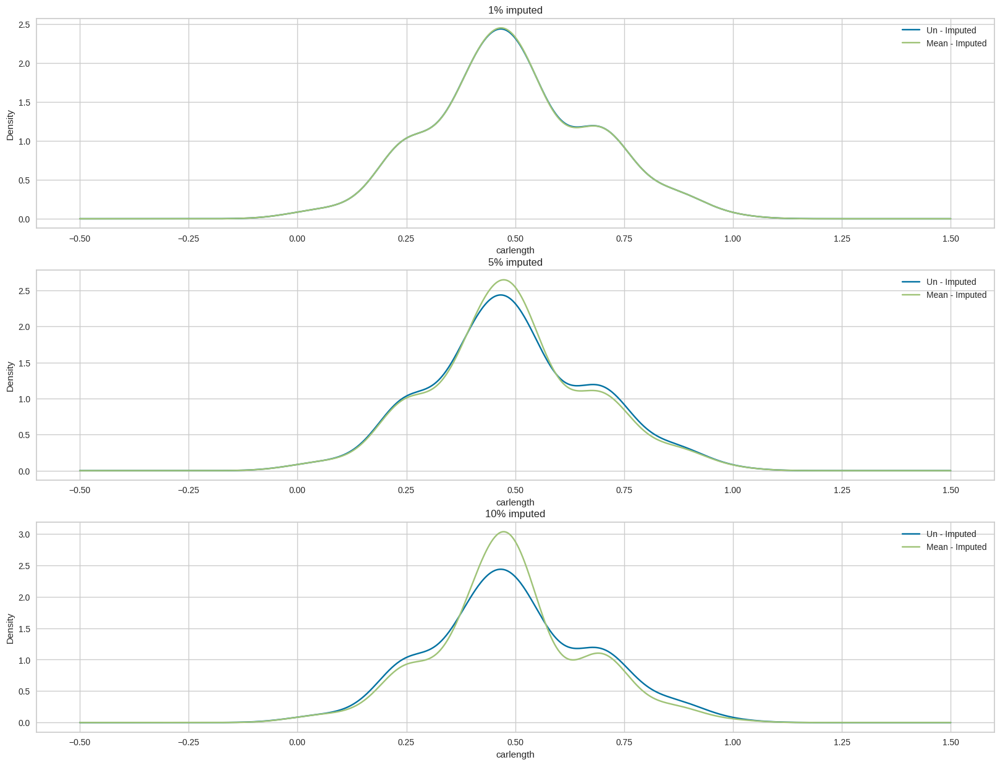

In [207]:
#1% data
col = 'carlength'
plt.figure(figsize=(20,15))

# for i, col in enumerate(cols):
plt.subplot(3,1,1)
final_data[col].plot(kind="kde")
nan_1p_df_mean[col].plot(kind="kde")
plt.title('1% imputed')
plt.legend(["Un - Imputed", "Mean - Imputed"])
plt.xlabel(f"{col}")
  


#5% data
# plt.figure(figsize=(20,15))

# for i, col in enumerate(cols):
plt.subplot(3,1,2)
final_data[col].plot(kind="kde")
nan_5p_df_mean[col].plot(kind="kde")
plt.title('5% imputed')
plt.legend(["Un - Imputed", "Mean - Imputed"])
plt.xlabel(f"{col}")
  

#10% data
# plt.figure(figsize=(20,15))

# for i, col in enumerate(cols):
plt.subplot(3,1,3)
final_data[col].plot(kind="kde")
nan_10p_df_mean[col].plot(kind="kde")
plt.title('10% imputed')
plt.legend(["Un - Imputed", "Mean - Imputed"])
plt.xlabel(f"{col}")
  

Check how well imputer drop


In [208]:
nan_5p_df_drop['enginelocation'].unique()

array([0, 1])

Text(0.5, 0, 'carlength')

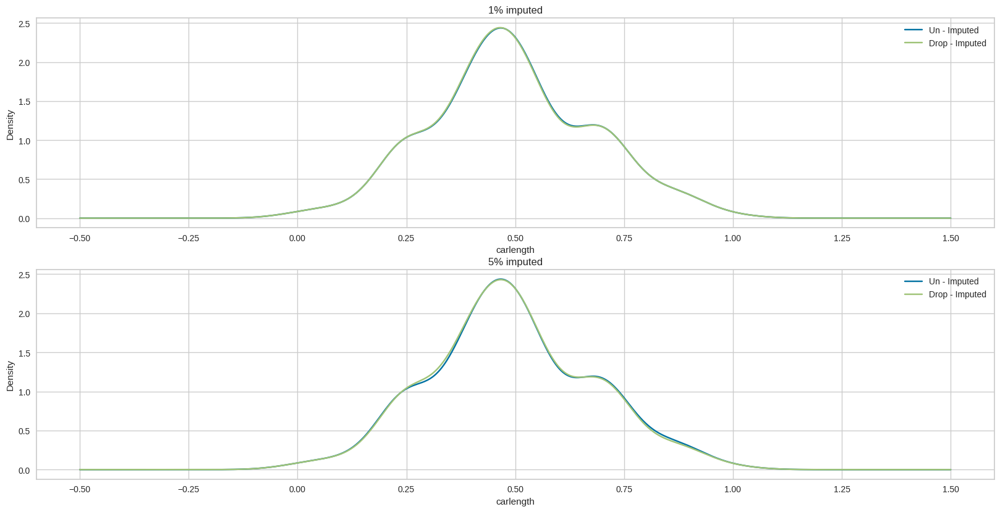

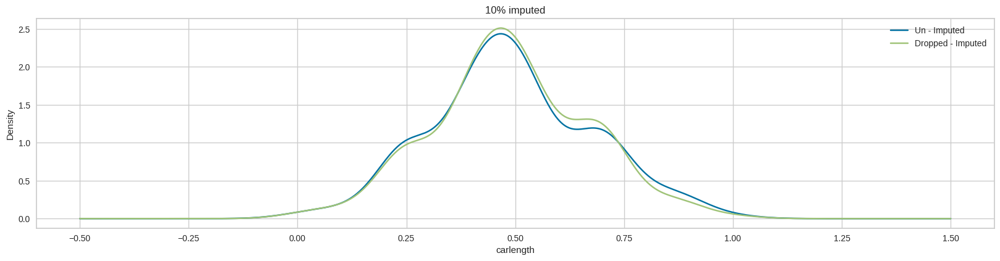

In [209]:
#KNN imputation density plots

#1% data
col = 'carlength'

plt.figure(figsize=(20,15))

# i = 0
# for col in cols[:]:
plt.subplot(3,1,1)
i+=1
final_data[col].plot(kind="kde")
nan_1p_df_knn[col].plot(kind="kde")
plt.title('1% imputed')
plt.legend(["Un - Imputed", "Drop - Imputed"])
plt.xlabel(f"{col}")
  


#5% data
# plt.figure(figsize=(20,15))
# i = 0
# for col in cols[:]:
plt.subplot(3,1,2)
# i+=1
final_data[col].plot(kind="kde")
nan_5p_df_knn[col].plot(kind="kde")
plt.title('5% imputed')
plt.legend(["Un - Imputed", "Drop - Imputed"])
plt.xlabel(f"{col}")
  

#10% data
plt.figure(figsize=(20,15))

# i = 0
# for col in cols[:]:
plt.subplot(3,1,3)
# i+=1
final_data[col].plot(kind="kde")
nan_10p_df_knn[col].plot(kind="kde")
plt.title('10% imputed')
plt.legend(["Un - Imputed", "Dropped - Imputed"])
plt.xlabel(f"{col}")
  

Text(0.5, 0, 'carlength')

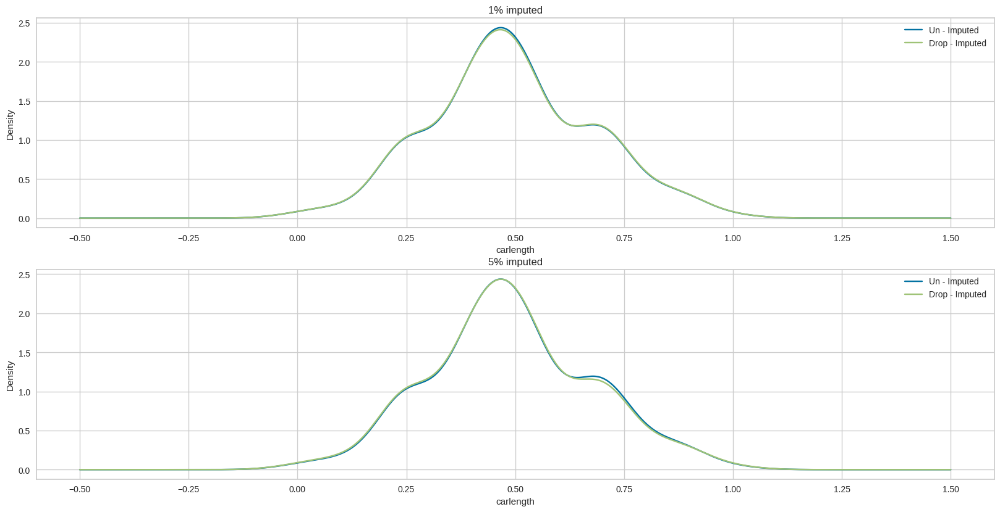

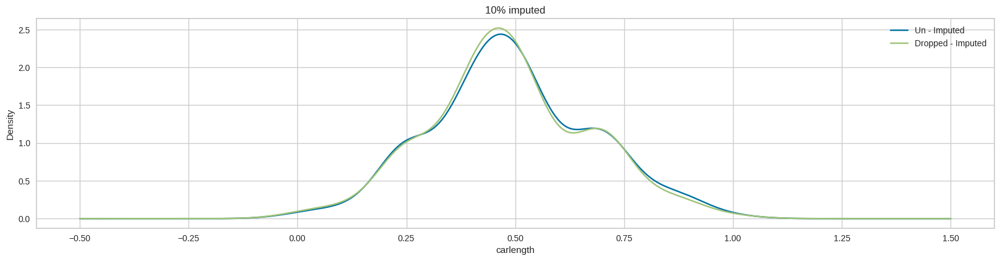

In [210]:
#Dropped imputation density plots

#1% data
col = 'carlength'

plt.figure(figsize=(20,15))

# i = 0
# for col in cols[:]:
plt.subplot(3,1,1)
i+=1
final_data[col].plot(kind="kde")
nan_1p_df_drop[col].plot(kind="kde")
plt.title('1% imputed')
plt.legend(["Un - Imputed", "Drop - Imputed"])
plt.xlabel(f"{col}")
  


#5% data
# plt.figure(figsize=(20,15))
# i = 0
# for col in cols[:]:
plt.subplot(3,1,2)
# i+=1
final_data[col].plot(kind="kde")
nan_5p_df_drop[col].plot(kind="kde")
plt.title('5% imputed')
plt.legend(["Un - Imputed", "Drop - Imputed"])
plt.xlabel(f"{col}")
  

#10% data
plt.figure(figsize=(20,15))


plt.subplot(3,1,3)
# i+=1
final_data[col].plot(kind="kde")
nan_10p_df_drop[col].plot(kind="kde")
plt.title('10% imputed')
plt.legend(["Un - Imputed", "Dropped - Imputed"])
plt.xlabel(f"{col}")

In [211]:
from sklearn import tree

In [212]:
# model training
df = final_data[ ['wheelbase','carlength','carwidth','curbweight','enginesize','boreratio','fuelsystem','price']]

X = df.drop(columns=["price"])
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
clf = tree.DecisionTreeRegressor() #SVR()

In [213]:
clf.fit(X_train, y_train)

DecisionTreeRegressor()

In [214]:
clf.score(X_test, y_test)

0.9051036797316625

In [215]:

# model training
df = rm_outlier_df[ ['wheelbase','carlength','carwidth','curbweight','enginesize','boreratio','fuelsystem','price']]

X = df.drop(columns=["price"])
y = df['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
clf = tree.DecisionTreeRegressor() #SVR()
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.635845275430992

### *Questions and Answers*

## 1.What are the data types? (Only numeric and categorical)
The dataset contains both numeric and categorical data types. Numeric data types include variables such as 'car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg', 'price'. Categorical data types include variables such as 'CarName','fueltype','aspiration','doornumber','carbody','drivewheel','enginelocation','enginetype','cylindernumber','fuelsystem'

## 2.Are there missing values?

There are no missing values in the dataset.

## 3.What are the likely distributions of the numeric variables?
We can see that there are several numeric variables in the dataset, and their distributions are likely to be normal. We can also see that some of the variables have a wide range of values, such as wheelbase, carlength, carwidth, and curbweight.

##4.  Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)
We can see that enginesize, curbweight, carwidth, and horsepower are highly correlated with the price, and are therefore useful for predicting the target variable.We used the Correlation Matrix, Box Plot, QQ Plot.

##5. Which independent variables have missing data? How much? 
We can see that there are no missing values in the dataset.

##6. Do the training and test sets have the same data?
No. The training and testing sets do not have the same data.

## 7.In the predictor variables independent of all the other predictor variables?
No, the predictor variables is not independent of all other predictor variables.They have a slight correlation

## 8. Which predictor variables are the most important?
From the three methods we used for feature selection, we can see that 'enginesize', 'curbweight', 'carwidth', 'horsepower', and 'enginelocation' are consistently identified as important variables for predicting 'price'.


##9. Do the ranges of the predictor variables make sense?
The ranges of the predictor variables seem to make sense. For example, 'wheelbase', 'carlength', and 'carwidth' are all measured in inches, and their values fall within reasonable ranges for cars. Similarly, 'enginesize', 'horsepower', and 'peakrpm' are all related to the performance of the car's engine, and their values seem to be reasonable for cars in this dataset.

##10. What are the distributions of the predictor variables?
From the histograms, we can see that most of the predictor variables are approximately normally distributed, although some variables have a skew towards one end

## 11. Remove outliers and keep outliers (does if have an effect of the final predictive model)?
Yes. Removing outliers increases the accuracy. But, in my case, as the dataset size is small, it had a negative effect on my accuracy.

##12. Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

Looking at the graph of density estimates for the replaced imputed values, using KNN for my data gave the best results. When the % of imputed values is less, it doesn't matter which method we use to impute.

## **Model Interpretability**

In [216]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [217]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [218]:
#loading the libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer
from sklearn import tree
from sklearn import linear_model
from sklearn import ensemble
import statsmodels.api as sd
import sklearn.metrics as sm
from sklearn.model_selection import train_test_split
import random

import warnings
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
warnings.filterwarnings("ignore")

# importing shap
!pip install shap
import shap 

import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [219]:
#Loading the CSV File
df_train=pd.read_csv("https://raw.githubusercontent.com/BadheA/DataVisualisation/main/CarPrice_Assignment.csv")


In [220]:
df_train.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


### *One Hot Encoding*

In [221]:
#Creating binary vaiables
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
# Create an instance of the OneHotEncoder class
encoder = OneHotEncoder()
# Encode the columns using the fit_transform method
encoded_data = encoder.fit_transform(df_train[['price']])
# Convert the encoded data to a dataframe
df = pd.DataFrame(encoded_data.toarray(), columns=encoder.get_feature_names_out(['price']))
# Print the encoded dataframe
print(df)

     price_5118.0  price_5151.0  price_5195.0  price_5348.0  price_5389.0  \
0             0.0           0.0           0.0           0.0           0.0   
1             0.0           0.0           0.0           0.0           0.0   
2             0.0           0.0           0.0           0.0           0.0   
3             0.0           0.0           0.0           0.0           0.0   
4             0.0           0.0           0.0           0.0           0.0   
..            ...           ...           ...           ...           ...   
200           0.0           0.0           0.0           0.0           0.0   
201           0.0           0.0           0.0           0.0           0.0   
202           0.0           0.0           0.0           0.0           0.0   
203           0.0           0.0           0.0           0.0           0.0   
204           0.0           0.0           0.0           0.0           0.0   

     price_5399.0  price_5499.0  price_5572.0  price_6095.0  price_6189.0  

In [222]:
#Defining the Response and the Predictors
y_total=df_train['price']
df_train=df_train.drop(['price'],axis=1)

#Storing Numerical and Categorical columns seperately for use later on
num_cols=list(df_train._get_numeric_data().columns)
cat_cols=list(set(df_train.columns)-set(num_cols))
df_train.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22


In [223]:
#Encoding the categorical variables
mapping_dict={}
for col in cat_cols:
    mapping_dict[col]={k: i for i, k in enumerate(df_train[col].unique())}
    df_train[col] = df_train[col].map(mapping_dict[col])

### *Normalizaing the Data*

In [224]:
# Normalizing our data for proper analysis

# list of numerical columns which require normalization
num_cols=['car_ID','symboling','CarName','carbody','drivewheel','wheelbase','carlength','carwidth','enginetype','cylindernumber','enginesize','boreratio','stroke']

# Importing required library from sklearn for normalization
from sklearn import preprocessing
feature_to_scale = num_cols

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
df_train[feature_to_scale] = min_max_scaler.fit_transform(df_train[feature_to_scale])

df_train.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg
0,0.000000,1.0,0.000000,0,0,0,0.00,0.0,0,0.058309,...,0.000000,0.260377,0,0.664286,0.290476,9.0,111,5000,21,27
1,0.004902,1.0,0.006849,0,0,0,0.00,0.0,0,0.058309,...,0.000000,0.260377,0,0.664286,0.290476,9.0,111,5000,21,27
2,0.009804,0.6,0.013699,0,0,0,0.25,0.0,0,0.230321,...,0.166667,0.343396,0,0.100000,0.666667,9.0,154,5000,19,26
3,0.014706,0.8,0.020548,0,0,1,0.50,0.5,0,0.384840,...,0.000000,0.181132,0,0.464286,0.633333,10.0,102,5500,24,30
4,0.019608,0.8,0.027397,0,0,1,0.50,1.0,0,0.373178,...,0.333333,0.283019,0,0.464286,0.633333,8.0,115,5500,18,22


In [225]:
# Checking for any null values in the dataset, as we hav no null values - we are good to go.
df_train.isnull().sum()  

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
dtype: int64

In [226]:
df_train.describe()  # Statistical description of our dataset

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,...,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.500000,0.566829,0.523622,0.097561,0.180488,0.560976,0.450000,0.336585,0.014634,0.354419,...,0.083740,0.248707,1.478049,0.564111,0.564483,10.142537,104.117073,5125.121951,25.219512,30.751220
std,0.290797,0.249061,0.283194,0.297446,0.385535,0.497483,0.209165,0.278085,0.120377,0.175562,...,0.209148,0.157142,2.184113,0.193460,0.149332,3.972040,39.544167,476.985643,6.542142,6.886443
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,48.000000,4150.000000,13.000000,16.000000
25%,0.250000,0.400000,0.294521,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.230321,...,0.000000,0.135849,0.000000,0.435714,0.495238,8.600000,70.000000,4800.000000,19.000000,25.000000
50%,0.500000,0.600000,0.541096,0.000000,0.000000,1.000000,0.500000,0.500000,0.000000,0.303207,...,0.000000,0.222642,1.000000,0.550000,0.580952,9.000000,95.000000,5200.000000,24.000000,30.000000
75%,0.750000,0.800000,0.773973,0.000000,0.000000,1.000000,0.500000,0.500000,0.000000,0.460641,...,0.000000,0.301887,1.000000,0.742857,0.638095,9.400000,116.000000,5500.000000,30.000000,34.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,7.000000,1.000000,1.000000,23.000000,288.000000,6600.000000,49.000000,54.000000


### *Calculating VIF*

In [227]:
def calculate_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif

In [228]:
vif_df = calculate_vif(df_train)

In [229]:
print(vif_df)

           variables         VIF
0             car_ID  775.284089
1          symboling   15.789098
2            CarName  856.022358
3           fueltype   97.531924
4         aspiration    4.346903
5         doornumber    5.859342
6            carbody    9.437971
7         drivewheel    6.749403
8     enginelocation    2.139738
9          wheelbase   53.945714
10         carlength  102.668437
11          carwidth   58.238905
12         carheight  754.070060
13        curbweight  419.176014
14        enginetype   16.001578
15    cylindernumber    2.808136
16        enginesize   48.087925
17        fuelsystem    4.925599
18         boreratio   36.300356
19            stroke   26.955809
20  compressionratio  594.976068
21        horsepower  112.223977
22           peakrpm  301.421709
23           citympg  520.061783
24        highwaympg  601.574236


### *OLS Model*

In [230]:
import statsmodels.api as sm

# Split the data into training and validation sets
train_X, val_X, train_y, val_y = train_test_split(df_train, y_total, random_state=1)

# Fit the linear regression model
model = sm.OLS(train_y, train_X).fit()

# Print the model summary
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:                  price   R-squared (uncentered):                   0.980
Model:                            OLS   Adj. R-squared (uncentered):              0.976
Method:                 Least Squares   F-statistic:                              246.7
Date:                Sun, 09 Apr 2023   Prob (F-statistic):                    5.26e-96
Time:                        21:10:22   Log-Likelihood:                         -1396.0
No. Observations:                 153   AIC:                                      2842.
Df Residuals:                     128   BIC:                                      2918.
Df Model:                          25                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

Based on the information presented above, we can observe that the F-Statistic value is not equal to 0, which indicates that there is a relationship between the X and Y values.

Additionally, we can analyze the T-Statistic values and identify that certain values have a significant impact on the outcome in either a positive or negative direction. To explore this further, we can utilize SHAP analysis.

Moving forward, we will implement a simple Linear Regressor model and conduct SHAP analysis on it.

Text(0.5, 1.0, 'Variable Correlation')

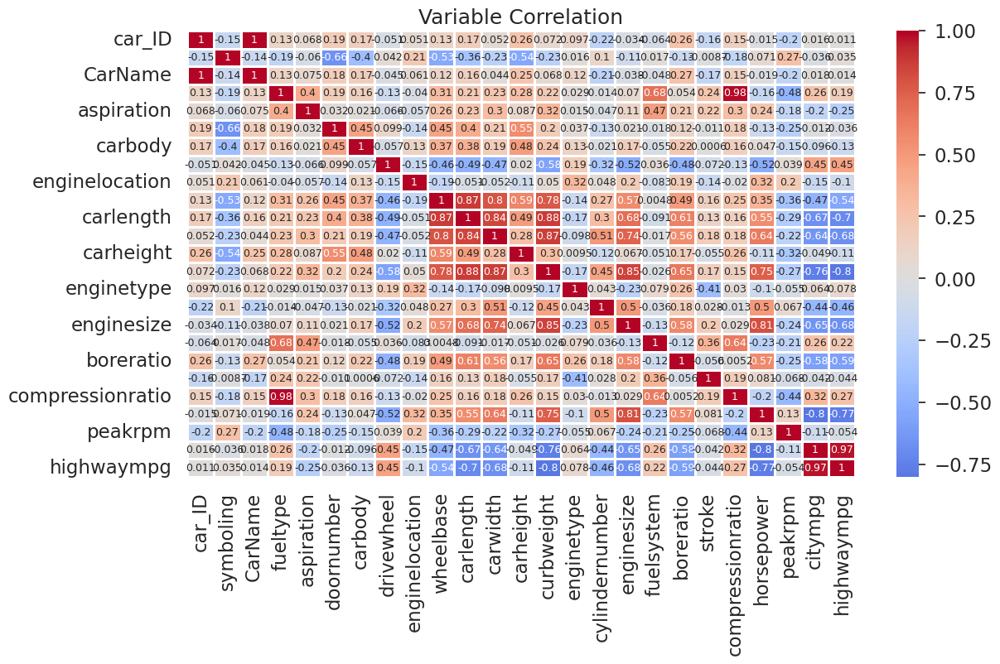

In [231]:
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(13,7))

sns.heatmap(df_train.corr(),center=0, linewidths=0.9,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

### *1.Performing Linear Regression*

In [232]:
#Computing Linear Regression model for CarPrice dataset
def linear_reg(X_train,y_train,val_X,val_y):
    linear_reg = LinearRegression()
    linear_reg_model = linear_reg.fit(train_X,train_y)
    print('Train set')
    pred=linear_reg_model.predict(train_X)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(train_y,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(train_y,pred)))
    print('Test set')
    pred=linear_reg_model.predict(val_X)
    model_lr=linear_reg_model.predict(val_X)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(val_y,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(val_y,pred))) 

In [233]:
from sklearn import linear_model

model = linear_model.LinearRegression()
model.fit(train_X, train_y)

LinearRegression()

In [234]:
cols1= ['car_ID', 'symboling', 'CarName' , 'fueltype' , 'aspiration','doornumber', 'carbody', 'drivewheel', 'enginelocation', 'wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight', 'enginetype', 'cylindernumber', 'enginesize', 'fuelsystem', 'boreratio', 'stroke', 'compressionratio', 'horsepower', 'peakrpm', 'citympg','highwaympg'  ]

In [235]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
#Computing R2 for testing and training data
linear_reg(train_X[cols1],train_y,val_X[cols1],val_y)

Train set
Linear Regression Mean Squared error :4738293.325254704
Linear Regression r2_score :0.9238159852051191
Test set
Linear Regression Mean Squared error :9787827.54606777
Linear Regression r2_score :0.8542228824227335


####  *SHAP Analysis on Linear Regression Model*

SHAP (SHapley Additive exPlanations) analysis is a technique utilized to interpret machine learning models by computing the contribution of each feature to the prediction. It explains the output of a model and provides a way to estimate the importance of each feature in the model's output for a particular instance.

To perform the SHAP analysis on our linear model, we will plot model summaries, employ waterfall analysis to identify the significance of features and their impact on the final prediction, utilize feature importance to assess all the values of the model, implement dependence plots to exhibit how values are dependent on each other, and employ a heatmap to visualize the contribution of each feature to the final prediction made by the model for better comprehension.

In [236]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = train_X.sample(frac=0.01,random_state=200)
#LinearExplainer is used as linear regression model is used
explainer = shap.LinearExplainer(model, X, feature_perturbation="interventional") 
shap_values = explainer.shap_values(X) #Saving SHAP values

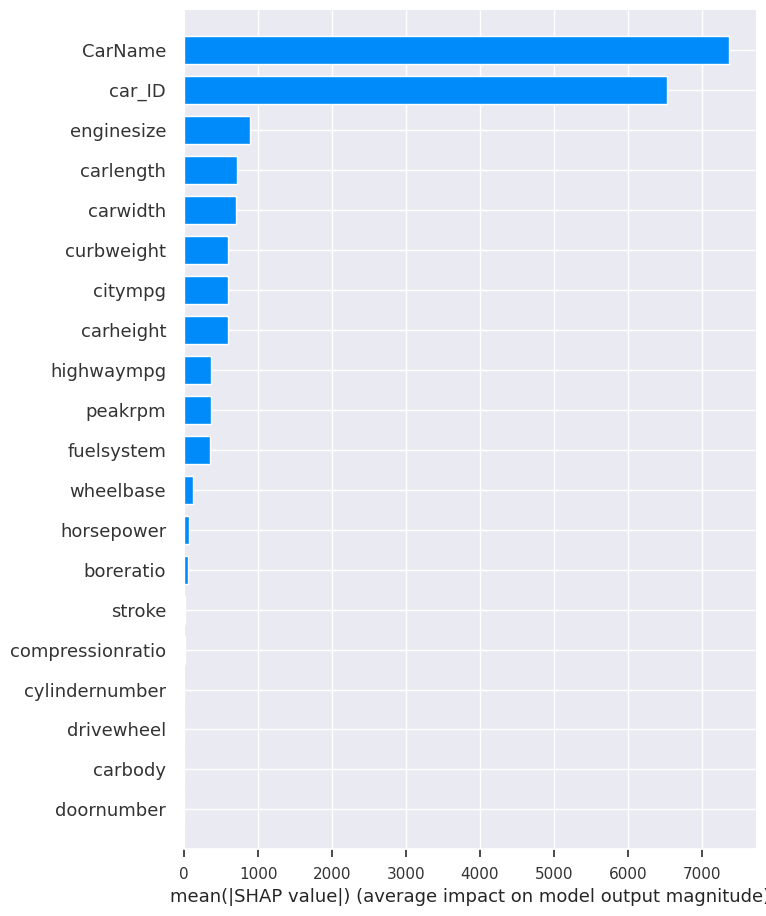

In [237]:
shap.summary_plot(shap_values, X, plot_type="bar")

From above, we can see that the distribution of shaply values is more for CarName. However, to determine the positive and negative importance of the values we will not specify the plot type as bar and just see the summary of the shap values.

In [238]:
#Initialize java script
shap.initjs()

 #Explain one row in the data with the
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

  0%|          | 0/52 [00:00<?, ?it/s]

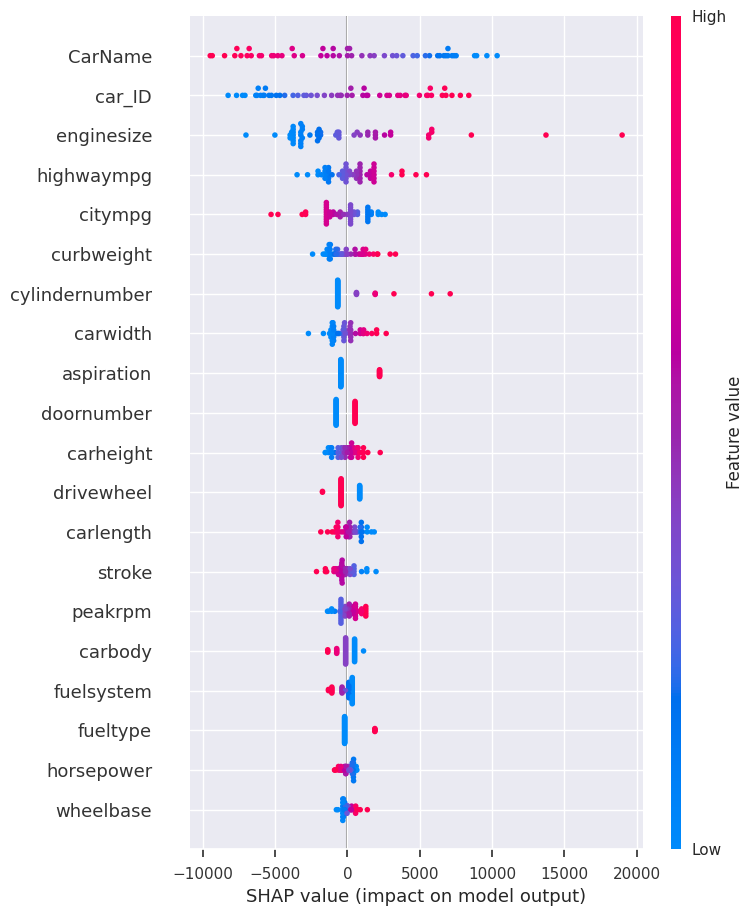

In [239]:
import shap

# generate shap values
explainer = shap.KernelExplainer(model.predict, train_X)
shap_values = explainer.shap_values(val_X)

# make sure the feature and shap matrices have the same number of rows
assert val_X.shape[0] == shap_values.shape[0]

# create a summary plot
shap.summary_plot(shap_values, val_X, feature_names=list(train_X.columns))


But For the same parameter i.e CarName, if the value becomes lower, it impacts the prediction of the model more negatively than in a positive manner.

We can see that in the graph, the red dots indicate high impact and blue showcase less impact. The direction from the mean line in the center indicates type of impact on the model's output value.

The values that seem to have a positive impact the higher it become are enginesize, curbweight.

In [240]:
 #Initializing explainer from shap, lm is our trained model
explainer_shap=shap.LinearExplainer(model=model, masker=train_X)

#Computing shap values for train dataset
shap_values = explainer_shap.shap_values(train_X)

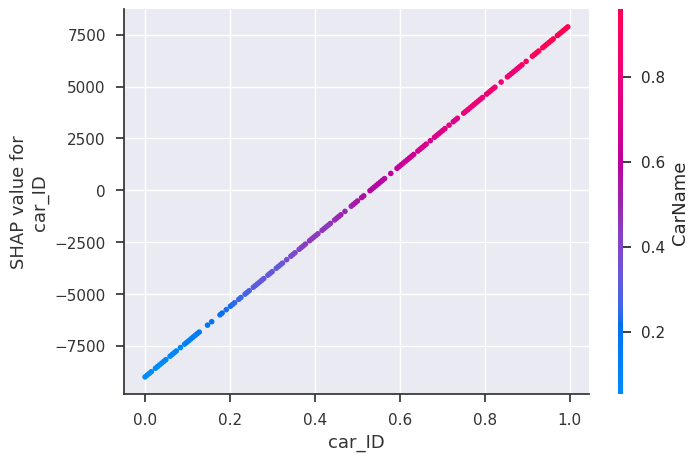

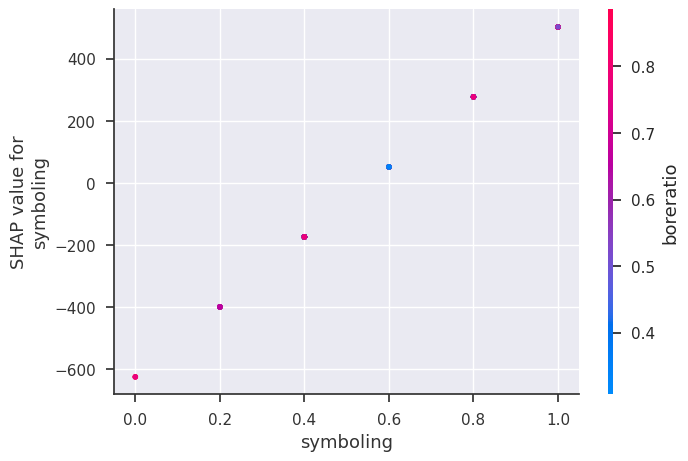

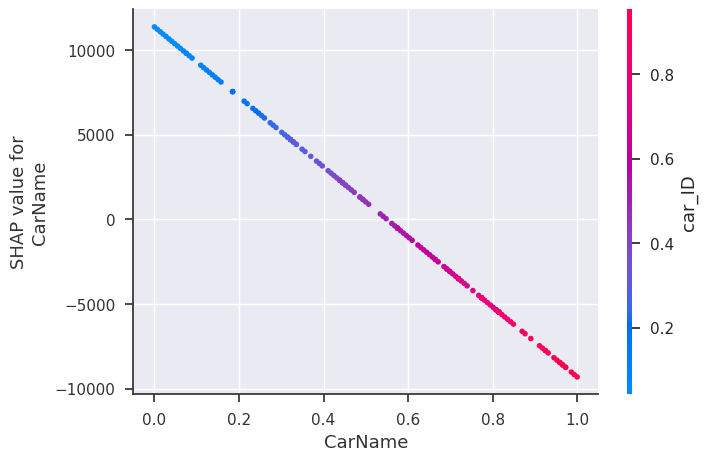

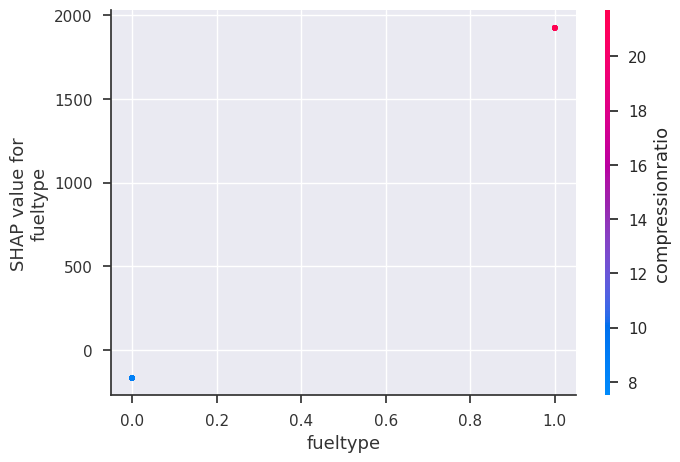

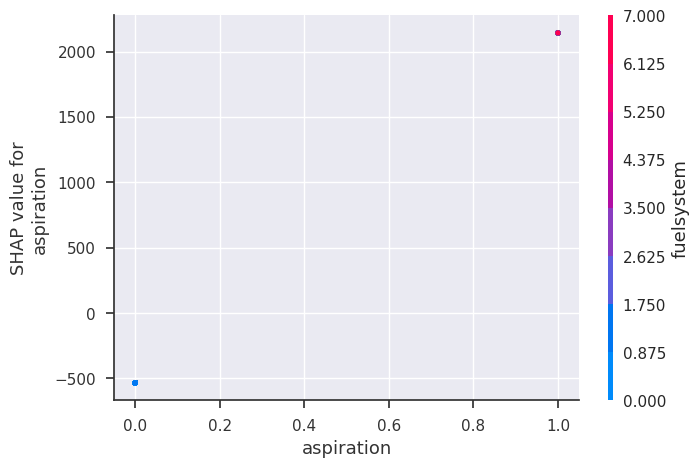

...

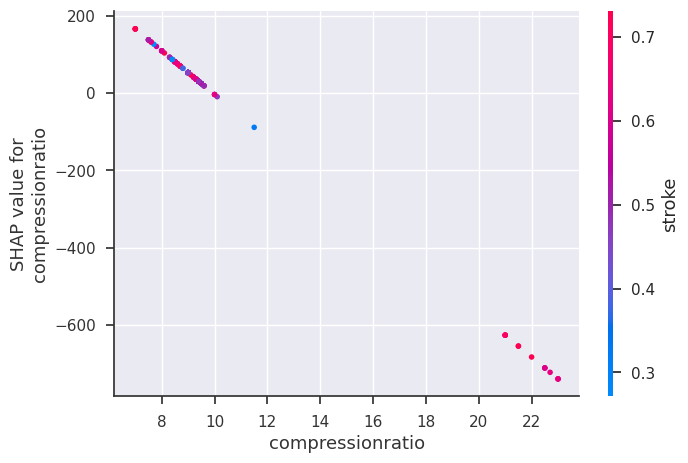

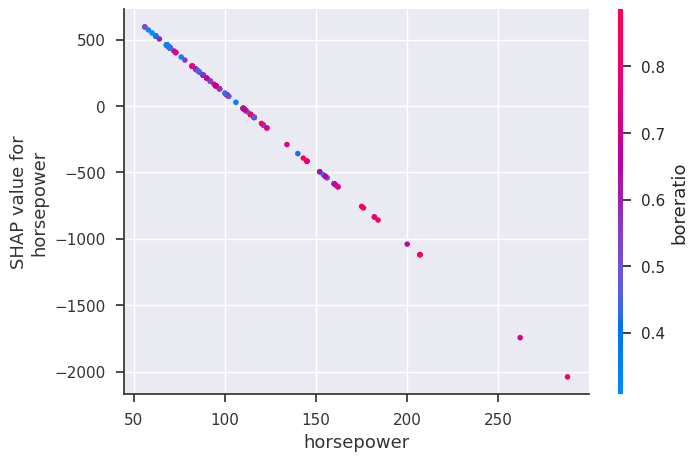

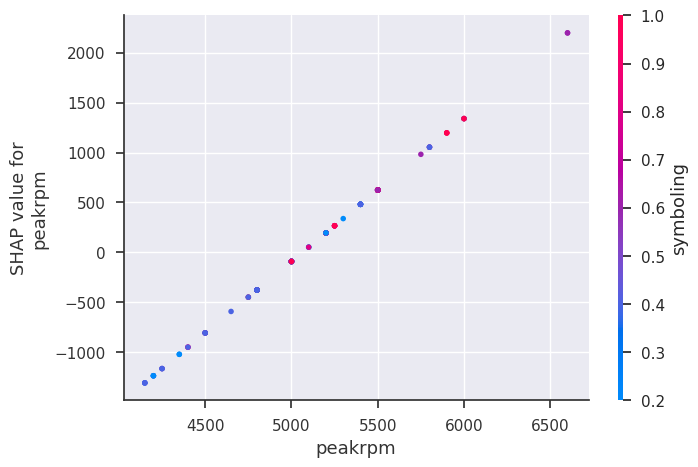

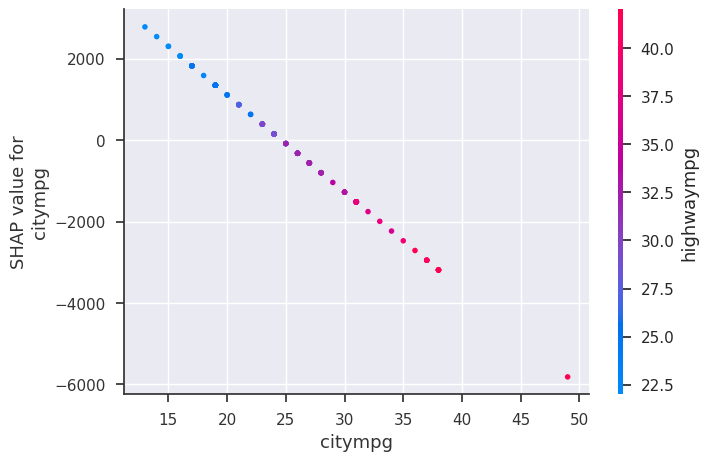

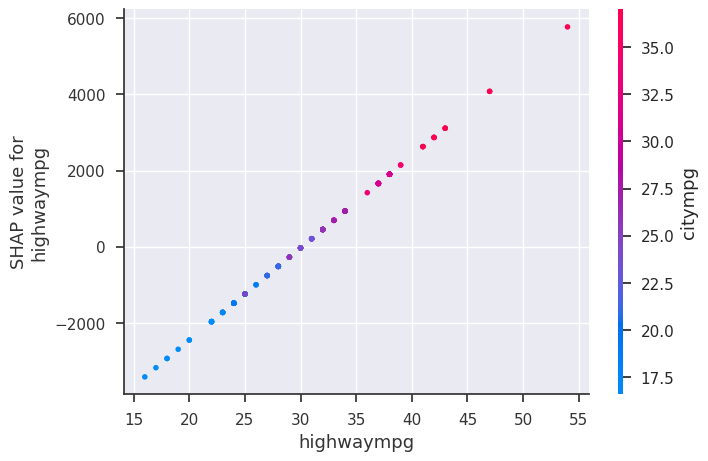

In [241]:
for i in train_X:
  shap.dependence_plot(i, shap_values, train_X)
#shap.dependence_plot("curbweight", shap_values, train_X)

SHAP dependence plots are a visualization tool that illustrates the impact of a specific feature on a model's predictions. They provide insights into the relationship between the feature and the target variable and how this connection changes depending on the values of other features in the dataset.

To generate a SHAP dependence plot, a scatter plot is created with the feature values and their corresponding SHAP values for each instance in the dataset. The plot showcases how the feature value and SHAP value are interlinked, with each point's color indicating the value of another feature in the dataset. This type of plot can be helpful for gaining a deeper understanding of how different features influence the model's output.

In [242]:
from sklearn.linear_model import LinearRegression
import shap

# train Linear model
#Seperating the dependent and independent variable from the main dataset
X=df_train.drop(['curbweight'],axis=1)
y=df_train['curbweight']
regressor = LinearRegression()
linear_reg = regressor.fit(X, y)

# compute SHAP values
explainer = shap.Explainer(linear_reg, X)
shap_values = explainer(X)

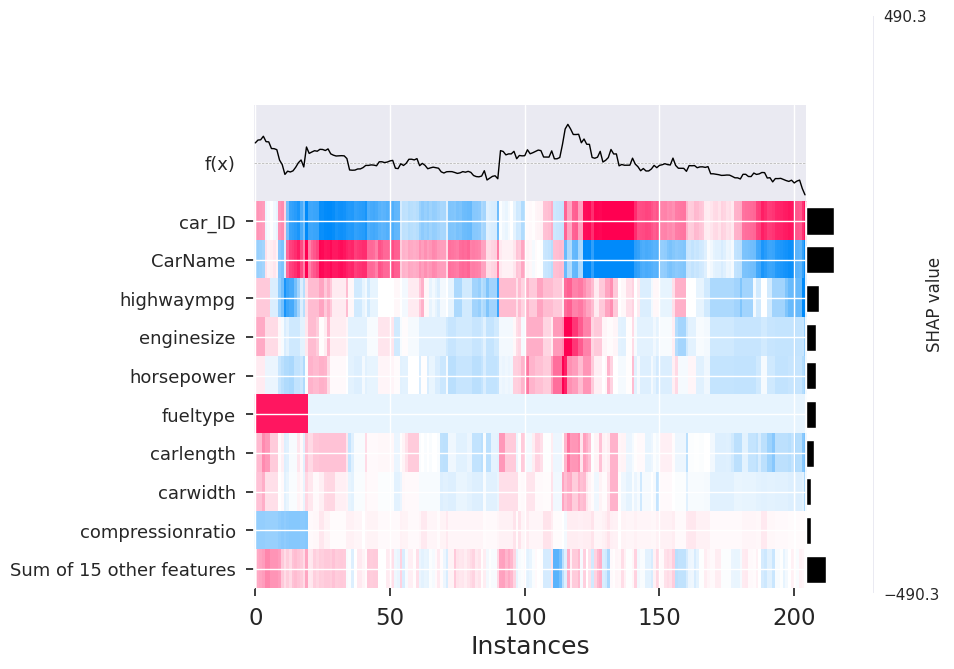

In [243]:
shap.plots.heatmap(shap_values)

#### *Heatmap of the shap values*

SHAP heatmap is useful for visualizing how different features interact with each other and how they contribute to the model's output. The heatmap can help you identify which features are most important for the model's predictions, and how those features change across different observations. This can be particularly useful in identifying patterns and trends in your data, and in understanding how your model is making decisions.

####*Waterfall Analysis*

Waterfall plot for linear regression


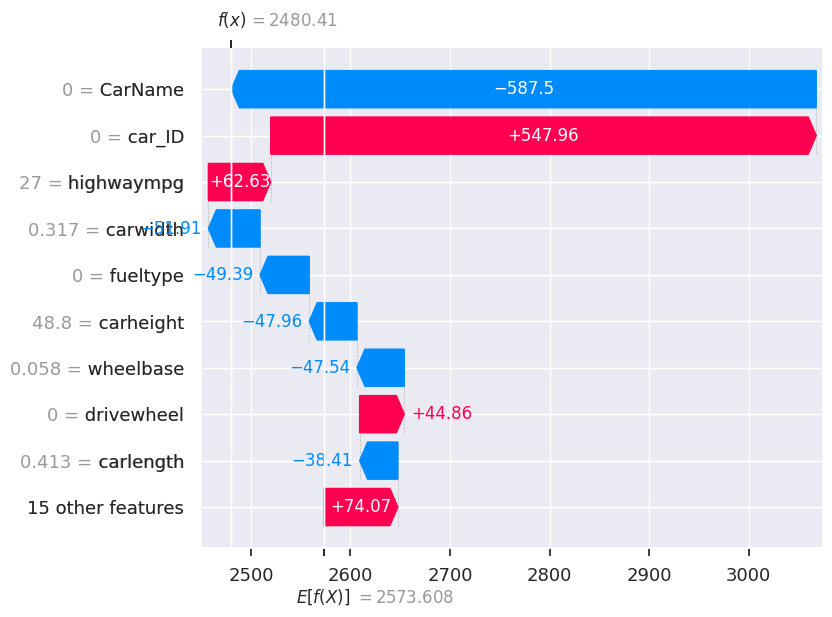

In [244]:
print("Waterfall plot for linear regression")
shap.plots.waterfall(shap_values[0])

Now where the above summary plot gave the general distribution of shap valuese, the waterfall plot is used to see for one single instance of the data which value has a positive and negative impact on the output value. This is better to further analyze variable importance at per instance level.

### *2.Performing Random Forest*

In [245]:
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(train_X, train_y)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

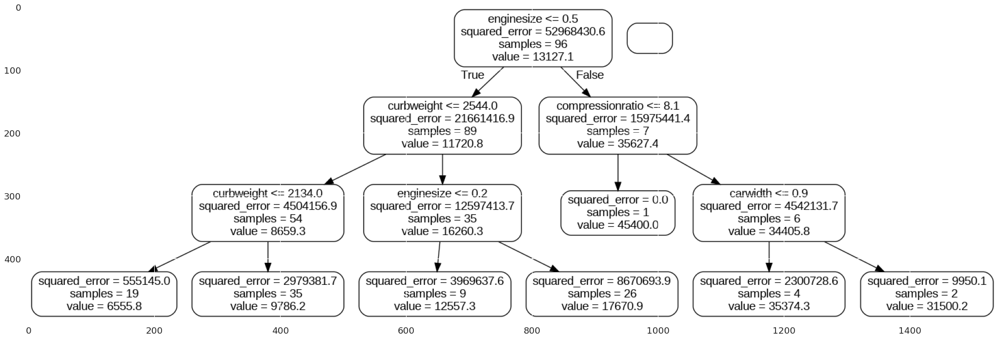

In [246]:
import matplotlib.image as mpimg
import pydot
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz


figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(train_X.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

For the random forest model according to SHAP Analysis the important features to determine the target variable 'price' are enginesize, curbweight and compressionratio. enginesize has the highest value of feature importance and is placed first on the scale.

In [247]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(train_X.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [248]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: enginesize           Importance: 0.72
Variable: curbweight           Importance: 0.17
Variable: highwaympg           Importance: 0.07
Variable: carwidth             Importance: 0.01
Variable: horsepower           Importance: 0.01
Variable: car_ID               Importance: 0.0
Variable: symboling            Importance: 0.0
Variable: CarName              Importance: 0.0
Variable: fueltype             Importance: 0.0
Variable: aspiration           Importance: 0.0
Variable: doornumber           Importance: 0.0
Variable: carbody              Importance: 0.0
Variable: drivewheel           Importance: 0.0
Variable: enginelocation       Importance: 0.0
Variable: wheelbase            Importance: 0.0
Variable: carlength            Importance: 0.0
Variable: carheight            Importance: 0.0
Variable: enginetype           Importance: 0.0
Variable: cylindernumber       Importance: 0.0
Variable: fuelsystem           Importance: 0.0
Variable: boreratio            Importance: 0.0
Variable

In [249]:
def randomforest(X_train,y_train,X_test,y_test):
    rf = RandomForestRegressor()
    rf_model = rf.fit(X_train,y_train)
    print('Train set')
    pred=rf_model.predict(X_train)
    print('ramdomforest Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('ramdomforest r2_score :{}'.format(r2_score(y_train,pred)))
    print('Tesst set')
    pred=rf_model.predict(X_test)
    print('ramdomforest Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('ramdomforest r2_score :{}'.format(r2_score(y_test,pred)))

random_forest = RandomForestRegressor(n_estimators=100)
random_forest.fit(train_X, train_y) 

RandomForestRegressor()

In [250]:
randomforest(train_X[cols1],train_y,val_X[cols1],val_y)

Train set
ramdomforest Mean Squared error :712072.7675273946
ramdomforest r2_score :0.9885510333505108
Tesst set
ramdomforest Mean Squared error :3979191.162229658
ramdomforest r2_score :0.9407350594206356


#### *SHAP Analysis on Random Forest*

In [251]:

X = train_X.head(10)
 # Using Tree explainer as this is tree based classifier model
explainer = shap.TreeExplainer(random_forest)
#Saving shap values
shap_values = explainer.shap_values(X)

In [252]:
shap.initjs() #Initialize java script
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:]) #Explain one row in the data with the model

In [253]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)  

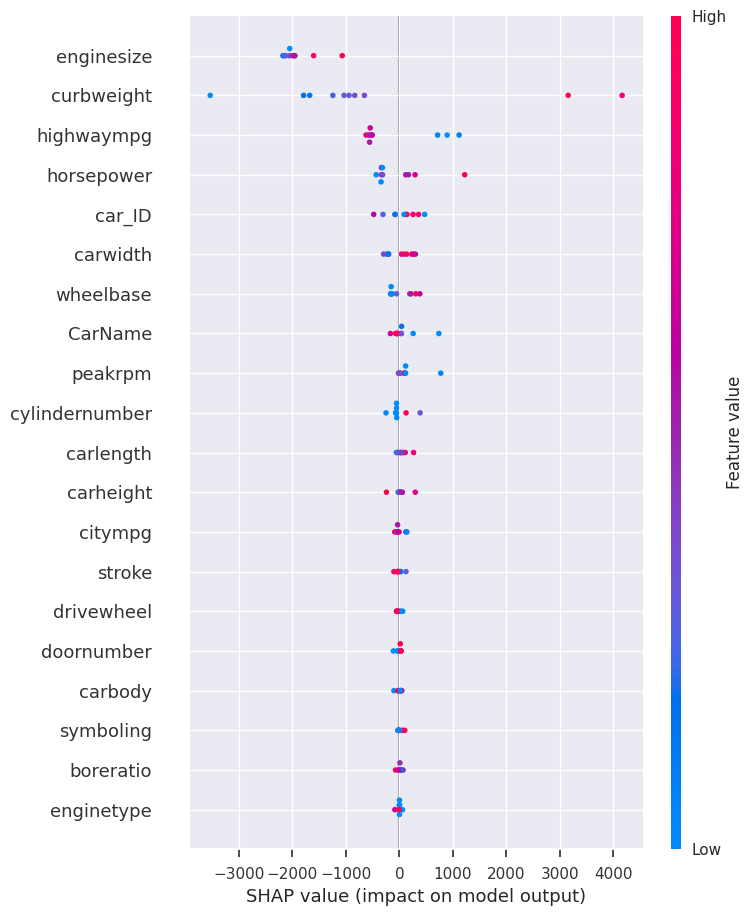

In [254]:
shap.initjs()
shap.summary_plot(shap_values, X) 

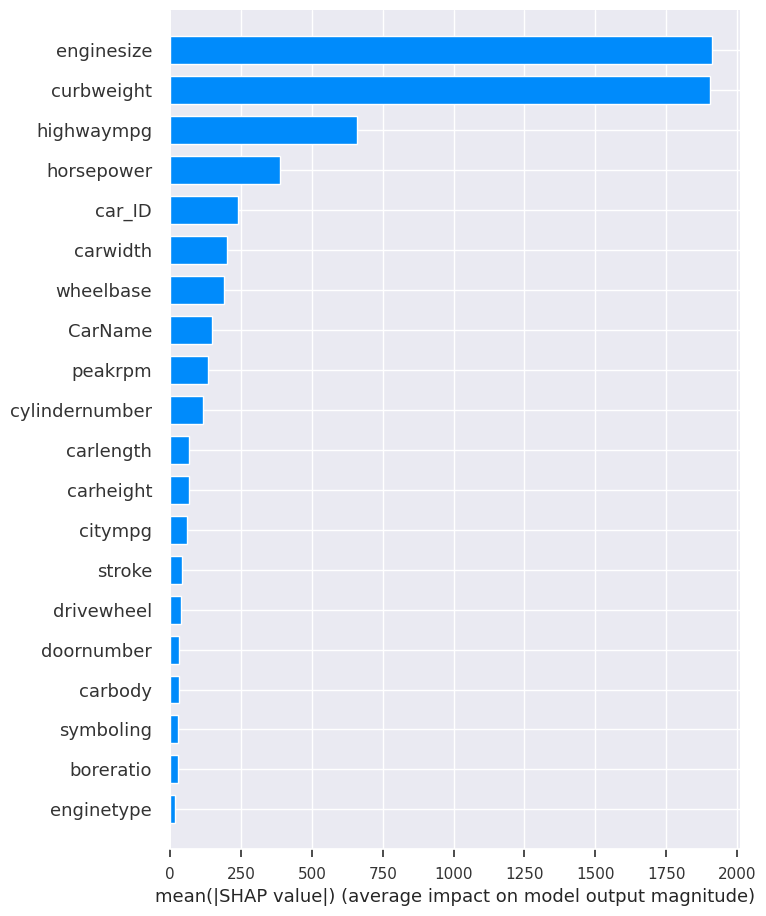

In [255]:
shap.summary_plot(shap_values, X, plot_type="bar")

### *3. Using an AutoML Models and Interpretability*

In [256]:
#importing all the necessary libraries

import h2o
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import numpy as np
import scipy

In [257]:
# Set a minimum memory size and a run time in seconds
min_mem_size=6 
run_time=222

In [258]:
# Use 50% of availible resources
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

3


In [259]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:43804..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpphphdcyt
  JVM stdout: /tmp/tmpphphdcyt/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpphphdcyt/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:43804
Connecting to H2O server at http://127.0.0.1:43804 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_acvaha
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [260]:
# Create a 80/20 train/test split
url = "https://raw.githubusercontent.com/BadheA/DataVisualisation/main/CarPrice_Assignment.csv"
df = h2o.import_file(path = url)
pct_rows=0.80
df_train, df_test = df.split_frame([pct_rows])

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [261]:
# Set the features and target
X=df.columns
print(X)

y ='price' 
X.remove(y) 
print(X)

['car_ID', 'symboling', 'CarName', 'fueltype', 'aspiration', 'doornumber', 'carbody', 'drivewheel', 'enginelocation', 'wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight', 'enginetype', 'cylindernumber', 'enginesize', 'fuelsystem', 'boreratio', 'stroke', 'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg', 'price']
['car_ID', 'symboling', 'CarName', 'fueltype', 'aspiration', 'doornumber', 'carbody', 'drivewheel', 'enginelocation', 'wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight', 'enginetype', 'cylindernumber', 'enginesize', 'fuelsystem', 'boreratio', 'stroke', 'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg']


In [262]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)
# Passing the training and testing dataset through H20 AutomML
aml.train(x=X,y=y,training_frame=df_train)  

AutoML progress: |██
21:13:17.139: _min_rows param, The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 164.0.

█████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_grid_1_AutoML_1_20230409_211312_model_29


Model Summary: 
    number_of_trees
--  -----------------
    64

ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 606627.9407919544
RMSE: 778.8632362565038
MAE: 583.8088587318979
RMSLE: 0.06224797353790804
Mean Residual Deviance: 606627.9407919544

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 4811444.44779723
RMSE: 2193.50050097948
MAE: 1615.4985857707698
RMSLE: 0.14663085031262443
Mean Residual Deviance: 4811444.44779723

Cross-Validation Metrics Summary: 
                        mean         sd           cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  -----------  -----------  ------------  ------------  ------------  ------------  ------------
mae                     1614.74      235.647      1770.76       1298.46       1612.92       1901.45       1490.1
mean_residual_deviance  4.80391e+06  1.66611e+06  6.26512e+06   2.5045e+06    5.86134e+06   5.82102e+06   3.56754e+06
mse                     4.80391e+06  1.66611e+06  6.26512e+06   2.5045e+06    5.86134e+06   5.82102e+06   3.56754e+06
r2                      0.921825     0.0334688    0.914863      0.96886       0.913521      0.87725       0.934631
residual_deviance       4.80391e+06  1.66611e+06  6.26512e+06   2.5045e+06    5.86134e+06   5.82102e+06   3.56754e+06
rmse                    2161.62      405.16       2503.02       1582.56       2421.02       2412.68       1888.79
rmsle                   0.145685     0.0182321    0.16291       0.118355      0.144723      0.161799      0.140641

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-09 21:14:44  57.522 sec  0                  15729            13502.4         2.47402e+08
    2023-04-09 21:14:44  57.627 sec  5                  5752.14          3492.42         3.30872e+07
    2023-04-09 21:14:44  57.632 sec  10                 3080.6           1786.88         9.49011e+06
    2023-04-09 21:14:44  57.642 sec  15                 2103.98          1305.88         4.42675e+06
    2023-04-09 21:14:44  57.649 sec  20                 1751.38          1124.61         3.06732e+06
    2023-04-09 21:14:44  57.662 sec  25                 1488.11          990.759         2.21447e+06
    2023-04-09 21:14:44  57.677 sec  30                 1344.31          916.123         1.80717e+06
    2023-04-09 21:14:44  57.692 sec  35                 1214.02          860.033         1.47385e+06
    2023-04-09 21:14:44  57.708 sec  40                 1117.04          806.91          1.24778e+06
    2023-04-09 21:14:44  57.720 sec  45                 1041.23          757.081         1.08415e+06
    2023-04-09 21:14:44  57.758 sec  50                 962.87           699.14          927118
    2023-04-09 21:14:44  57.766 sec  55                 892.117          650.026         795873
    2023-04-09 21:14:44  57.775 sec  60                 830.809          617.706         690243
    2023-04-09 21:14:44  57.783 sec  64                 778.863          583.809         606628

Variable Importances: 
variable           relative_importance    scaled_importance      percentage
-----------------  ---------------------  ---------------------  ----------------------
enginesize         3855756544.0           1.0                    0.34962458806997976
horsepower         2736964608.0           0.7098385431671071     0.2481770082509944
curbweight         2289589248.0           0.5938106366084923     0.20761079921581654
carwidth           627351936.0            0.16270527686096564    0.05688576539932712
car_ID             388472096.0            0.10075119929563686    0.03522509655129347
wheelbase          338788704.0            0.08786568864862439    0.030720005

In [263]:
print(aml.leaderboard)

model_id                                                    rmse          mse      mae     rmsle    mean_residual_deviance
XGBoost_grid_1_AutoML_1_20230409_211312_model_29         2193.5   4.81144e+06  1615.5   0.146631               4.81144e+06
XGBoost_grid_1_AutoML_1_20230409_211312_model_41         2250.98  5.06693e+06  1568.76  0.145689               5.06693e+06
StackedEnsemble_BestOfFamily_3_AutoML_1_20230409_211312  2258.49  5.10076e+06  1571.52  0.140849               5.10076e+06
XGBoost_grid_1_AutoML_1_20230409_211312_model_40         2260.99  5.1121e+06   1535.4   0.145705               5.1121e+06
XGBoost_grid_1_AutoML_1_20230409_211312_model_42         2271.84  5.16125e+06  1587     0.147069               5.16125e+06
StackedEnsemble_BestOfFamily_4_AutoML_1_20230409_211312  2289.46  5.24161e+06  1602.93  0.143373               5.24161e+06
XGBoost_grid_1_AutoML_1_20230409_211312_model_33         2307.5   5.32458e+06  1561.97  0.150359               5.32458e+06
XGBoost_grid_1_Au

In [264]:
model_index=0
glm_index=0
glm_model=''
aml_leaderboard_df=aml.leaderboard.as_data_frame()
models_dict={}
for m in aml_leaderboard_df['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break 
  model_index=model_index+1  

for m in aml_leaderboard_df['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break  
  glm_index=glm_index+1     
models_dict

{'XGBoost_grid_1_AutoML_1_20230409_211312_model_29': 0,
 'GLM_1_AutoML_1_20230409_211312': 124}

In [265]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index,'model_id'])
#Printing the best model
print("The best model is - " , best_model.algo)

0
The best model is -  xgboost


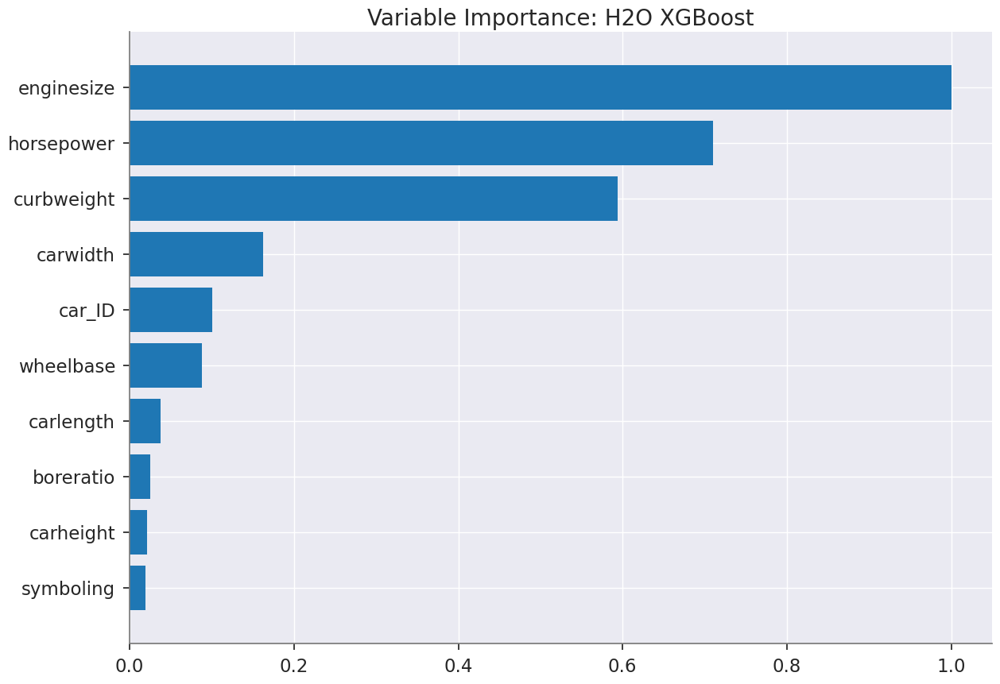

<Figure size 800x550 with 0 Axes>

In [266]:
#plot variables in order of their importance for price prediction
if best_model.algo in ['gbm','drf','xrt','xgboost']:
    best_model.varimp_plot()
    

124
glm


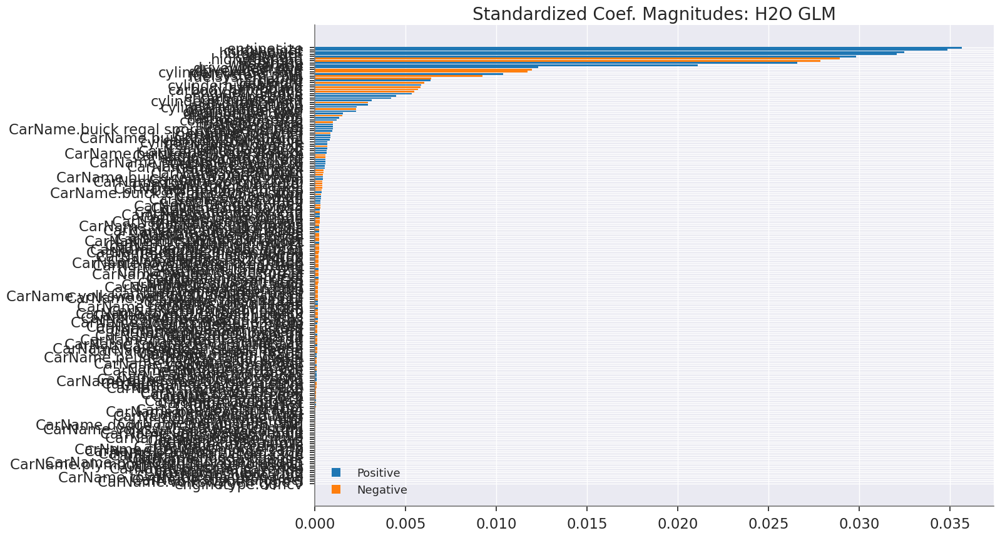

In [267]:
if glm_index is not 0:
  print(glm_index)
  glm_model=h2o.get_model(aml.leaderboard[glm_index,'model_id'])
  print(glm_model.algo) 
  glm_model.std_coef_plot()

#### *SHAP Analysis on AutoML Model*

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_1_AutoML_1_20230409_211312_model_25,1225.9,1.50282e+06,924.84,0.107749,1.50282e+06,130,0.016924,XGBoost
XGBoost_grid_1_AutoML_1_20230409_211312_model_52,1365.84,1.86552e+06,978.113,0.101409,1.86552e+06,86,0.022809,XGBoost
XGBoost_grid_1_AutoML_1_20230409_211312_model_10,1464.52,2.14483e+06,1066.25,0.113063,2.14483e+06,222,0.049457,XGBoost
XGBoost_grid_1_AutoML_1_20230409_211312_model_2,1473.82,2.17214e+06,1130.67,0.118668,2.17214e+06,700,0.097237,XGBoost
XGBoost_grid_1_AutoML_1_20230409_211312_model_13,1513.23,2.28988e+06,1041.66,0.111368,2.28988e+06,162,0.03048,XGBoost
XGBoost_grid_1_AutoML_1_20230409_211312_model_45,1518.53,2.30594e+06,1019.32,0.107344,2.30594e+06,169,0.034285,XGBoost
XGBoost_grid_1_AutoML_1_20230409_211312_model_16,1528.21,2.33543e+06,1089.07,0.105845,2.33543e+06,231,0.018003,XGBoost
StackedEnsemble_BestOfFamily_4_AutoML_1_20230409_211312,1532.64,2.34898e+06,1054.03,0.10467,2.34898e+06,145,0.388703,StackedEnsemble
XGBoost_grid_1_AutoML_1_20230409_211312_model_24,1535.93,2.35908e+06,1108.35,0.116677,2.35908e+06,220,0.044731,XGBoost
XGBoost_grid_1_AutoML_1_20230409_211312_model_48,1561.82,2.43927e+06,1119.14,0.113153,2.43927e+06,216,0.026906,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

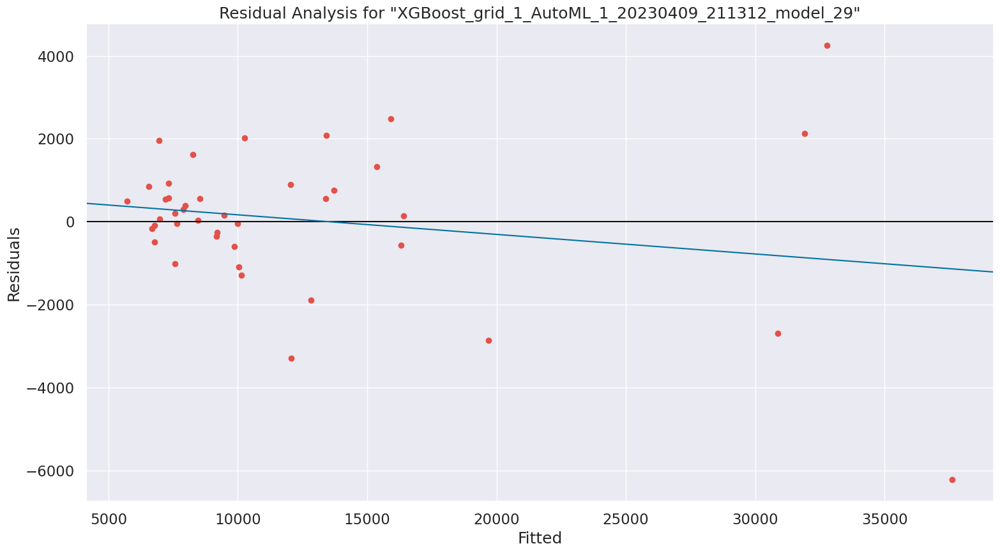

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

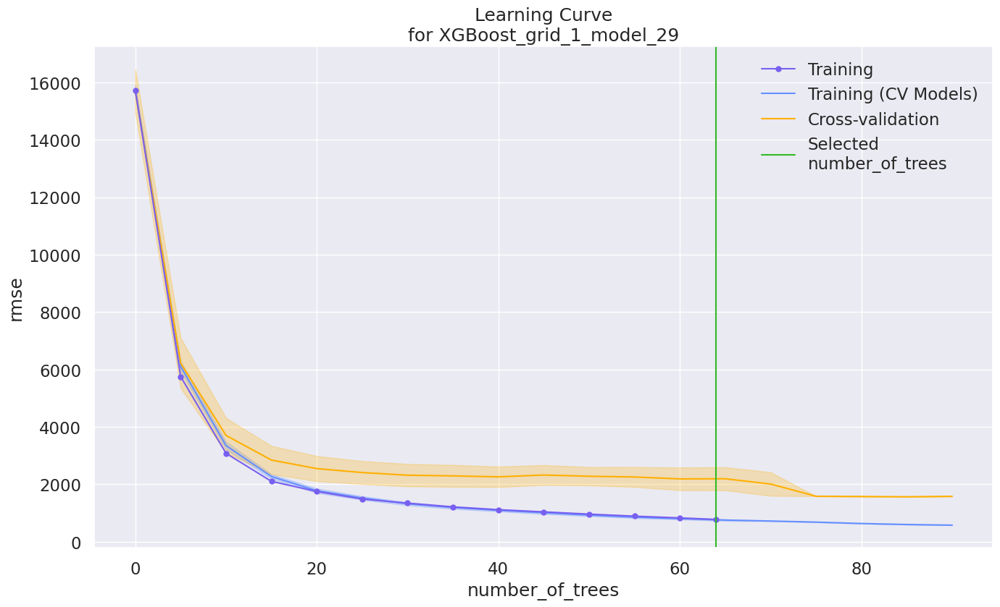

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

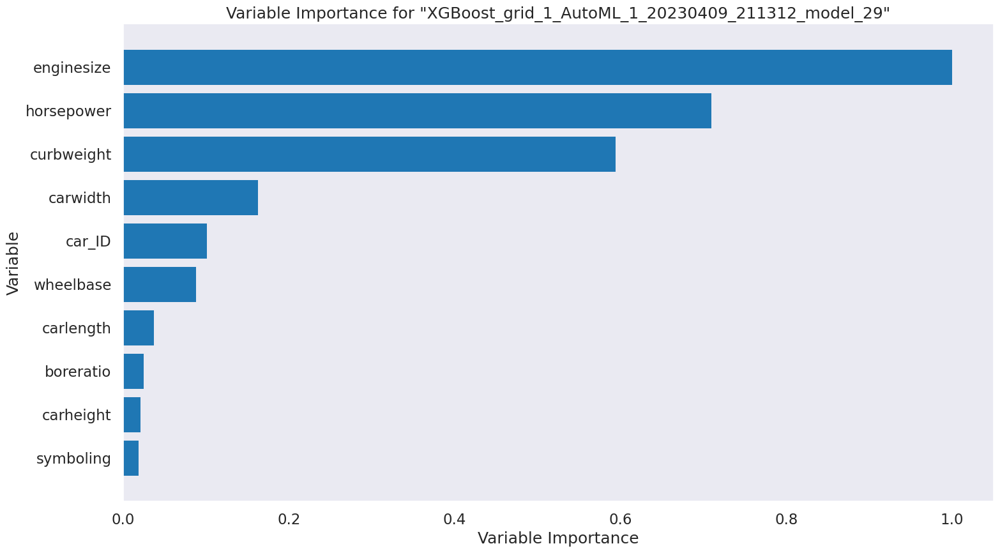

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

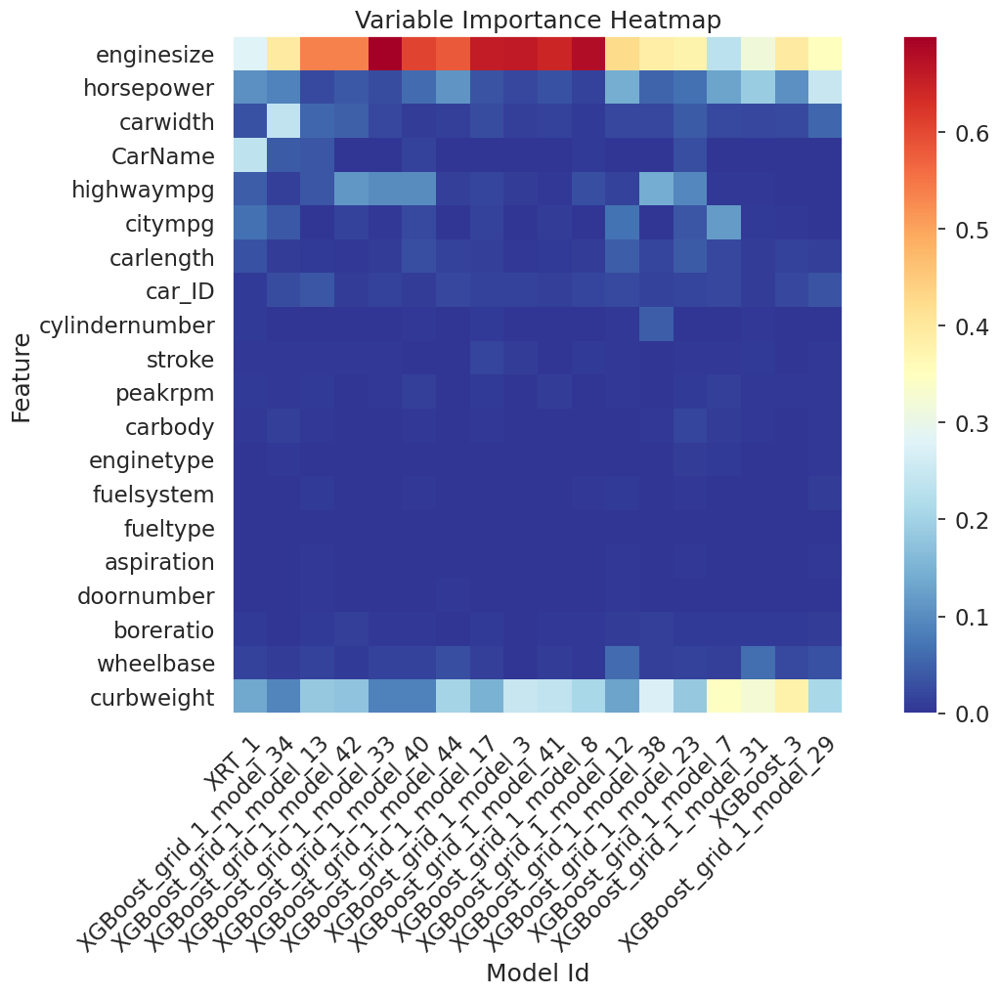

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

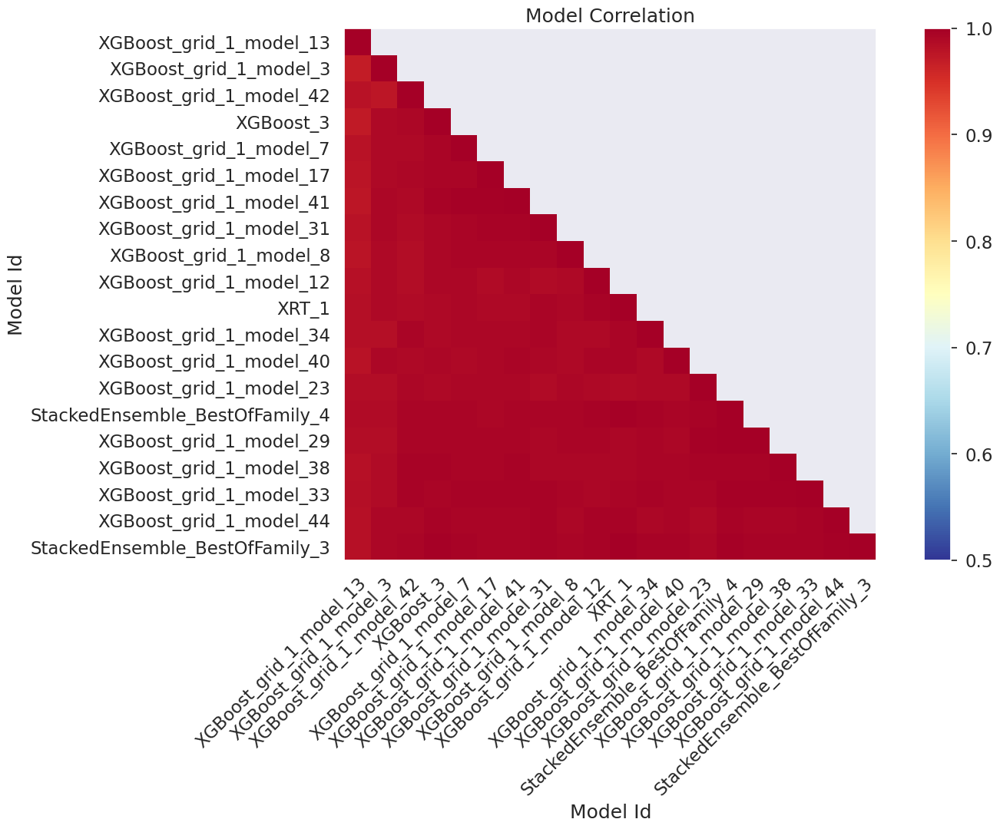

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

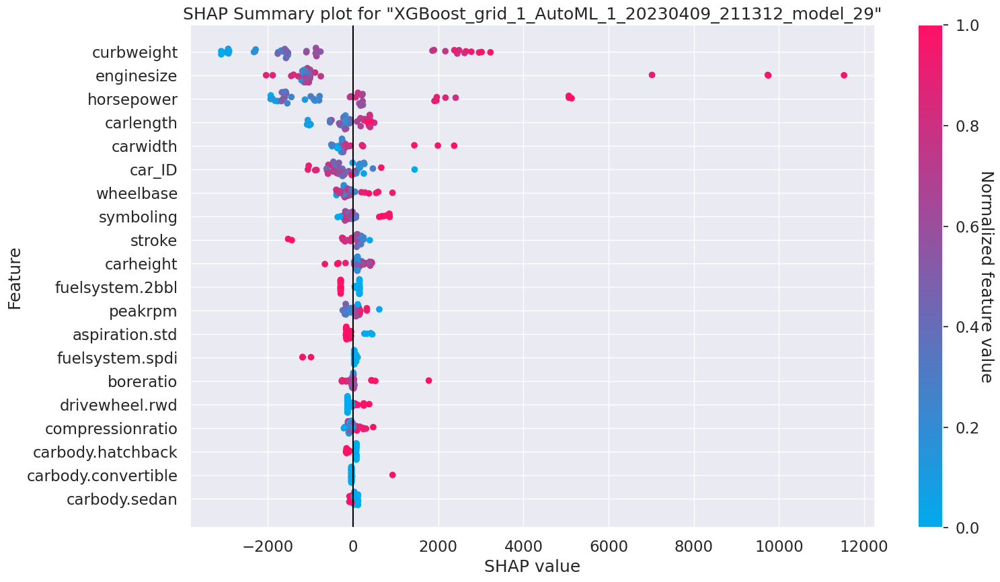

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

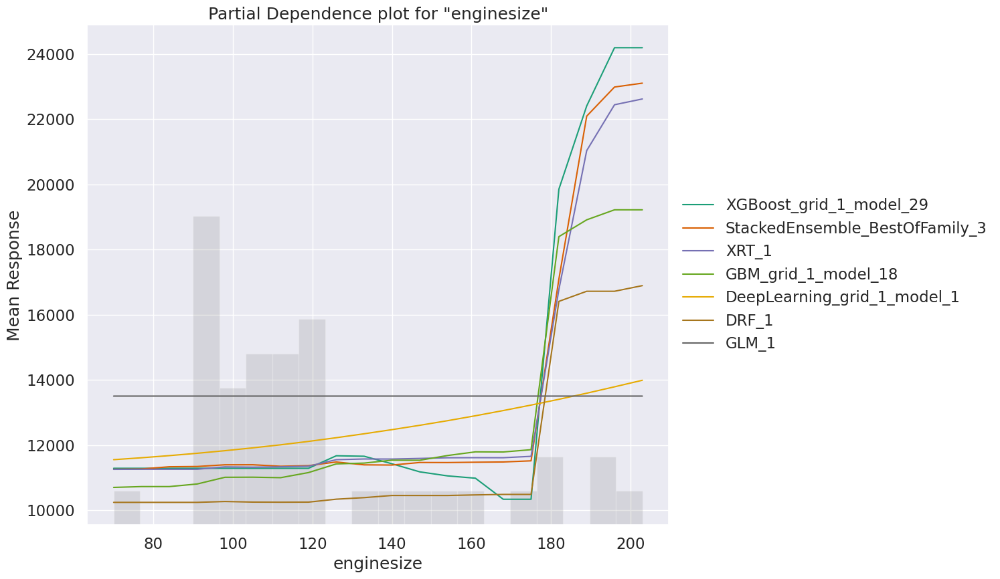

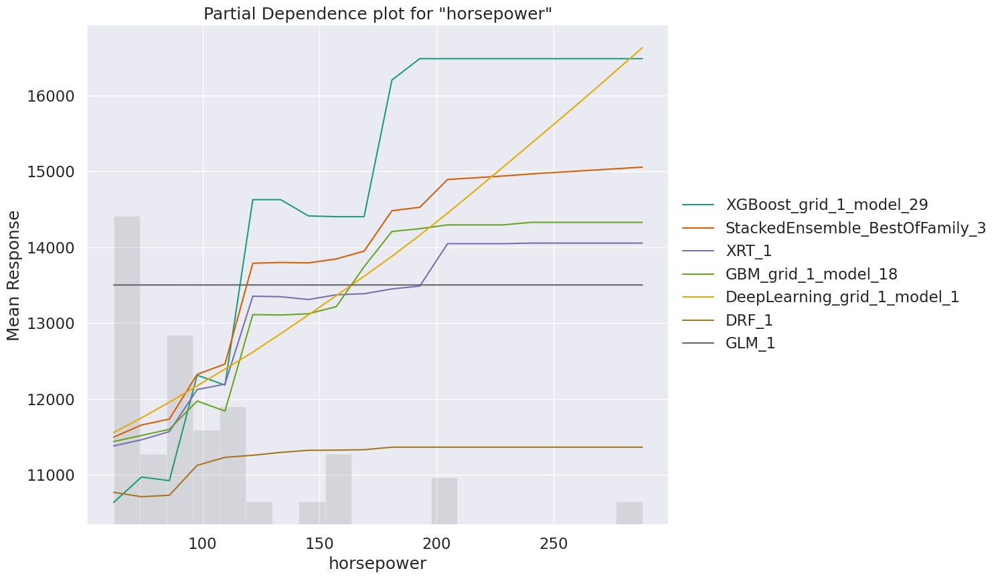

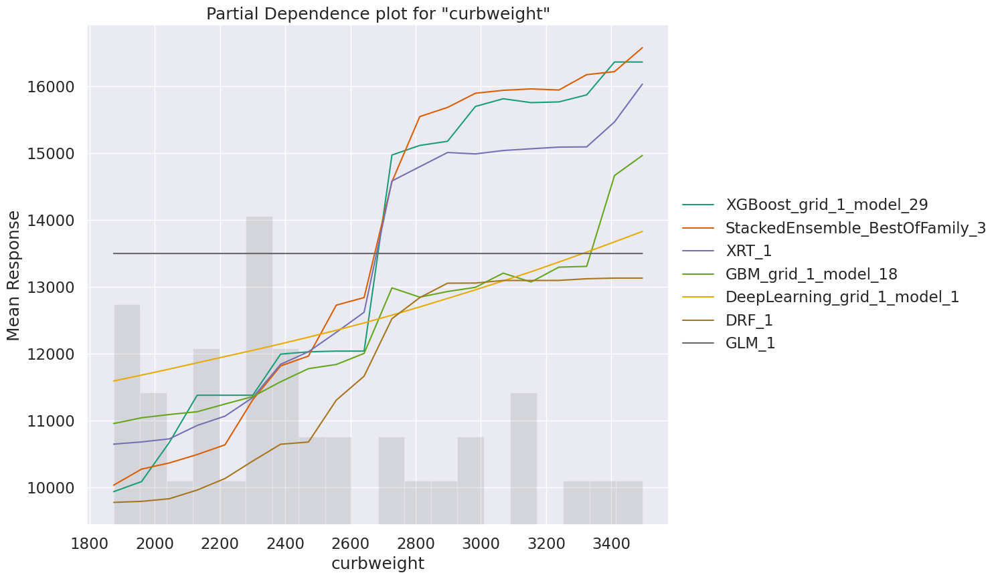

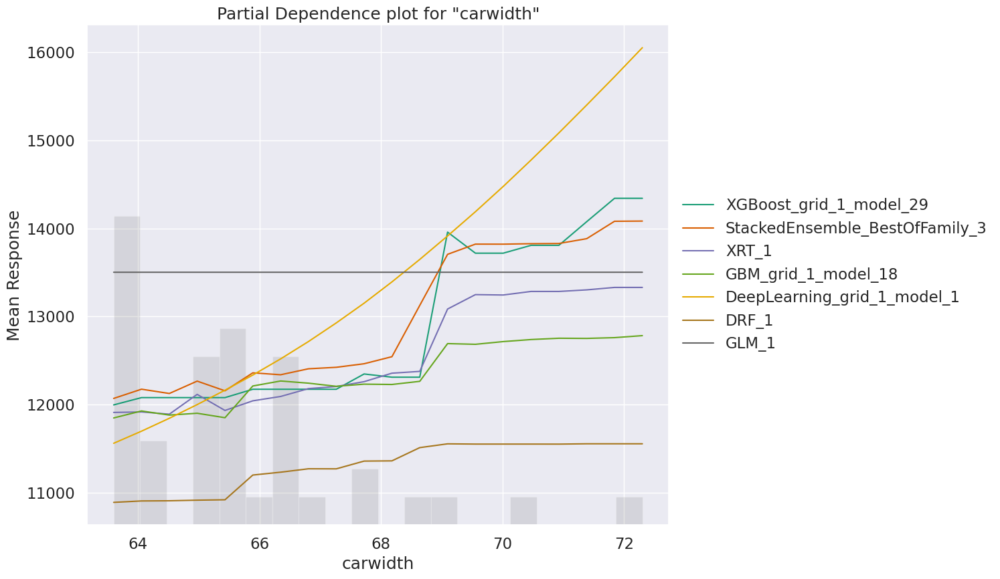

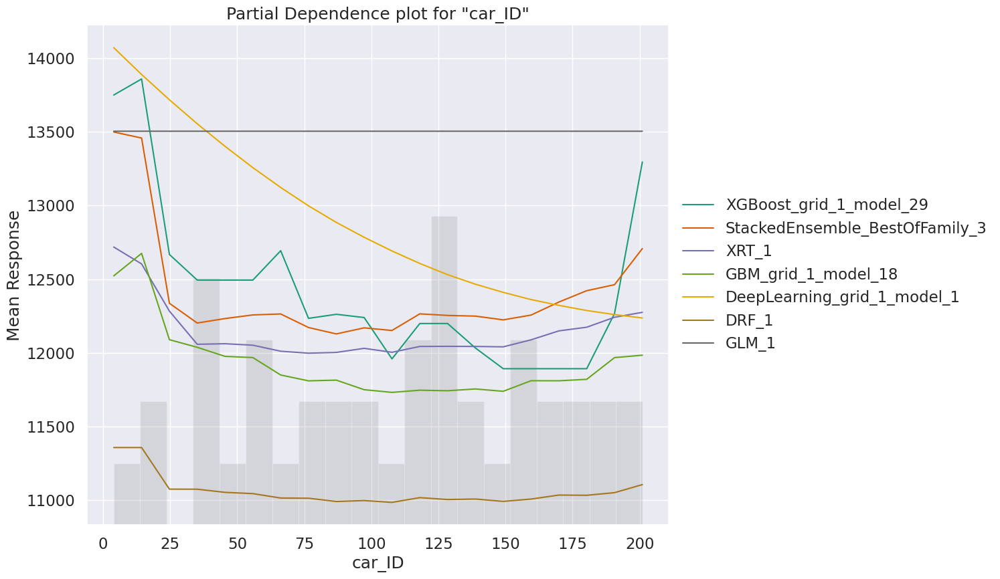

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

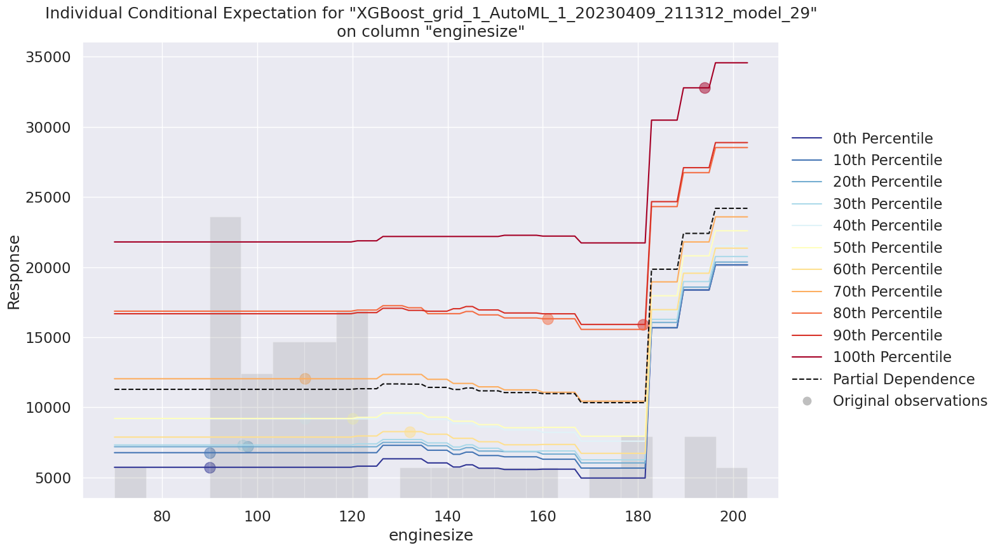

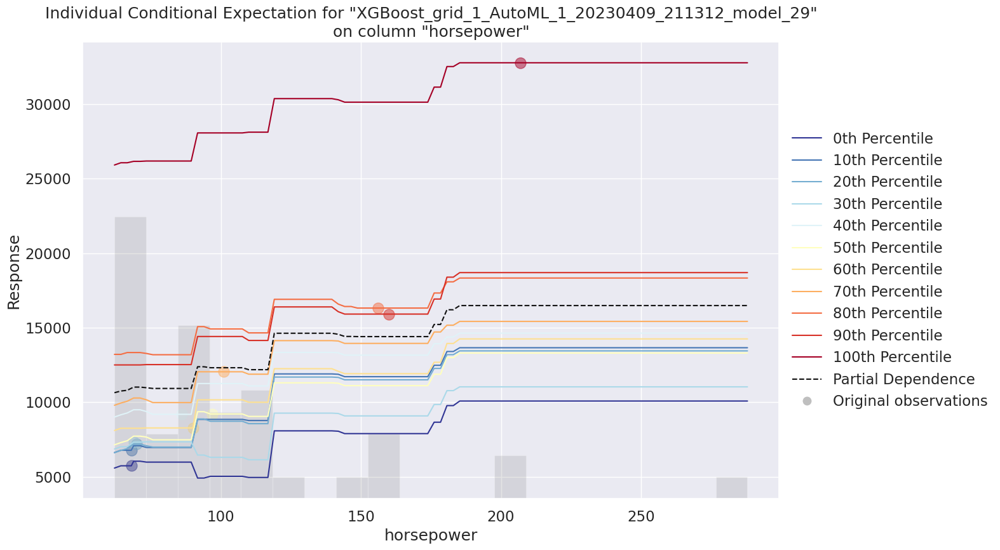

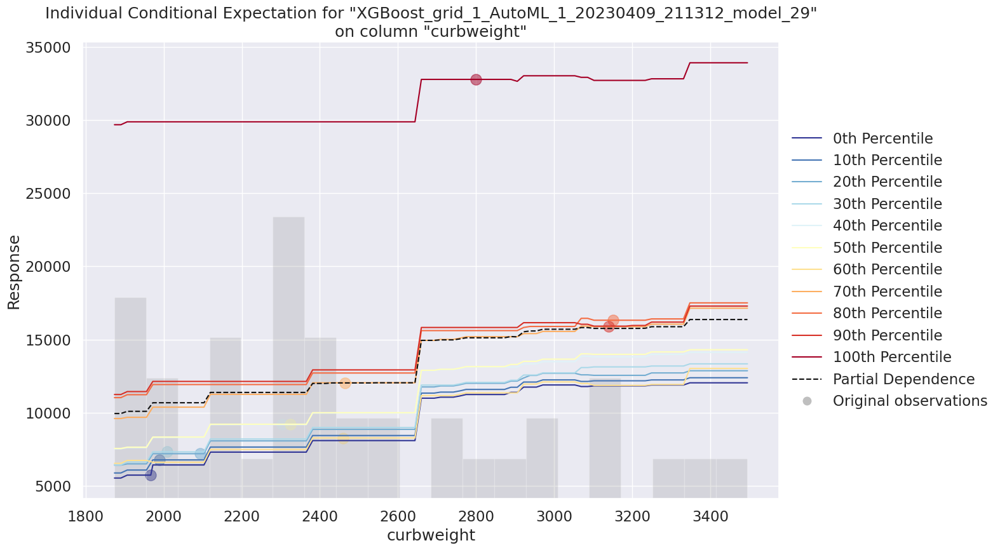

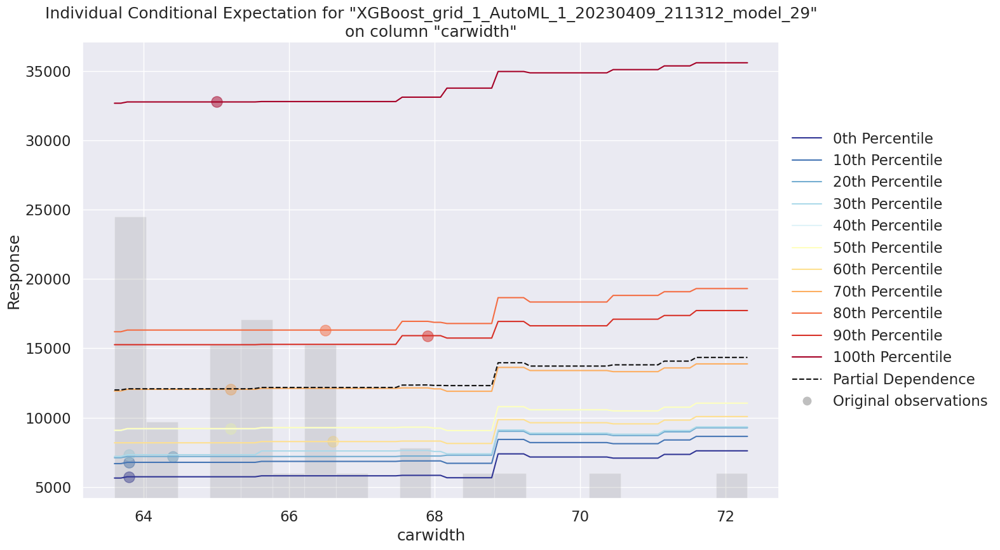

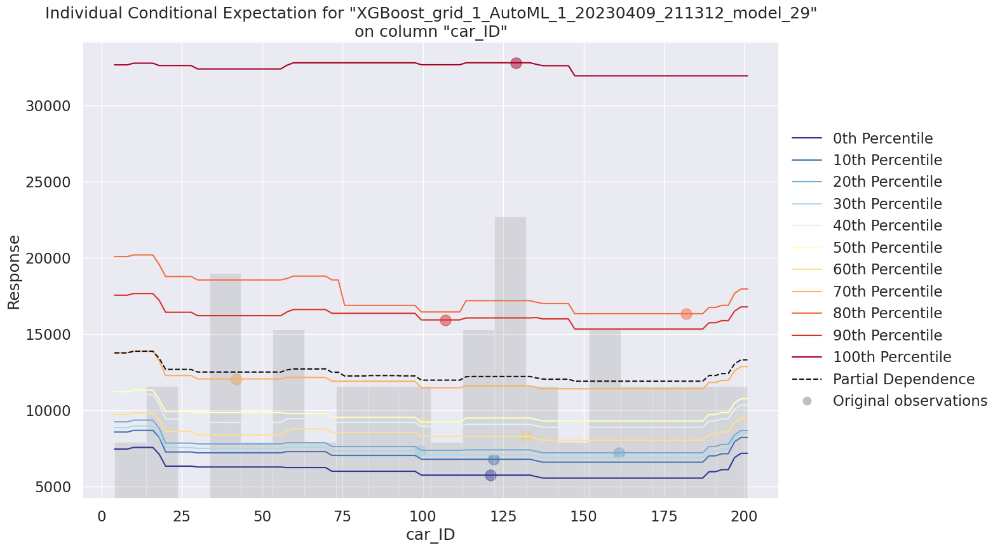

In [268]:
exa = aml.explain(df_test)

####*Observations*
Variable Importance plot - As we have seen in earlier two models, In autoML model also we have enginesize as the most important feature

Variable Importance plot - The next important features are curbweight, horsepower and so on

SHAP Summary - In Shap summary also we can see that the features such as enginesize,curbweight and horsepower to be some of the most important features for predicting the price of the car.

After seeing shap analysis for all three of our models, we can now very clearly interprete what features put weight in predicting our model decision which is ultimately the goal of this notebook

##  *Questions and Answers*

## 1.What are the data types? (Only numeric and categorical)
The dataset contains both numeric and categorical data types. Numeric data types include variables such as 'car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg', 'price'. Categorical data types include variables such as 'CarName','fueltype','aspiration','doornumber','carbody','drivewheel','enginelocation','enginetype','cylindernumber','fuelsystem'

## 2.Are there missing values?

There are no missing values in the dataset.

## 3.What are the likely distributions of the numeric variables?
We can see that there are several numeric variables in the dataset, and their distributions are likely to be normal. We can also see that some of the variables have a wide range of values, such as wheelbase, carlength, carwidth, and curbweight.

##4.  Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)
We can see that enginesize, curbweight, carwidth, and horsepower are highly correlated with the price, and are therefore useful for predicting the target variable.We used the Correlation Matrix, Box Plot, QQ Plot.

##5. Which independent variables have missing data? How much? 
We can see that there are no missing values in the dataset.

##6. Do the training and test sets have the same data?
No. The training and testing sets do not have the same data.

## 7.In the predictor variables independent of all the other predictor variables?
No, the predictor variables is not independent of all other predictor variables.They have a slight correlation

## 8. Which predictor variables are the most important?
From the three methods we used for feature selection, we can see that 'enginesize', 'curbweight', 'carwidth', 'horsepower', and 'enginelocation' are consistently identified as important variables for predicting 'price'.


##9. Do the ranges of the predictor variables make sense?
The ranges of the predictor variables seem to make sense. For example, 'wheelbase', 'carlength', and 'carwidth' are all measured in inches, and their values fall within reasonable ranges for cars. Similarly, 'enginesize', 'horsepower', and 'peakrpm' are all related to the performance of the car's engine, and their values seem to be reasonable for cars in this dataset.

##10. What are the distributions of the predictor variables?
From the histograms, we can see that most of the predictor variables are approximately normally distributed, although some variables have a skew towards one end

## 11. Remove outliers and keep outliers (does if have an effect of the final predictive model)?
Yes. Removing outliers increases the accuracy. But, in my case, as the dataset size is small, it had a negative effect on my accuracy.

##12. Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

Looking at the graph of density estimates for the replaced imputed values, using KNN for my data gave the best results. When the % of imputed values is less, it doesn't matter which method we use to impute.


#Conclusion
The accuracy of the model was checked by keeping the outliers and then removing those.It was observed that the accuracy increased when outliers were removed. To further explore imputation methods, 1%, 5%, and 10% of the data was randomly dropped and then imputed using three different methods. I got an accuracy of 90.79%




#Licenses
 MIT License
Copyright (c) 2023 Abhishek Badhe
Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:
The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.
THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

 
#REFERENCES

https://www.geeksforgeeks.org/data-cleansing-introduction/

https://stackoverflow.com/questions/52739323/python-data-cleaning

https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779

https://www.knowledgehut.com/tutorials/machine-learning/hyperparameter-tuning-machine-learning





## *Lasso Regularization*

In [269]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

# Define the Lasso regularization model
lasso = H2OGeneralizedLinearEstimator(alpha=1, # L1 regularization
                                      lambda_=0.01, # Regularization strength
                                      family='gaussian',
                                      interaction_pairs=None,
                                      lambda_search=False,
                                      seed=1)
predictors = df.columns[:-1]
response = 'price'
# Train the model using the training set
lasso.train(x=predictors, y=response, training_frame=df_train)

# Plot the standardized coefficients of the model against the predictor variables
#lasso.std_coef_plot()


glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681074777339_26


GLM Model: summary
    family    link      regularization          number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ----------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Lasso (lambda = 0.01 )  200                           166                            1                       py_331_sid_b9a4

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 37836.96205936131
RMSE: 194.51725388602756
MAE: 79.40416730950156
RMSLE: 0.017436215941565466
Mean Residual Deviance: 37836.96205936131
R^2: 0.9994186709279745
Null degrees of freedom: 163
Residual degrees of freedom: -3
Null deviance: 10674267082.694656
Residual deviance: 6205261.777735255
AIC: 2530.1426836114306

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse       training_deviance    training_mae       training_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  ------------------  -------------------  -----------------  ------------------
    2023-04-09 21:19:12  0.000 sec   0             10674267074.254436         65086994.355209984
    2023-04-09 21:19:12  1.028 sec   1                                                            194.51725388602756  37836.96205936131    79.40416730950156  0.9994186709279745

Variable Importances: 
variable                         relative_importance    scaled_importance    percentage
-------------------------------  ---------------------  -------------------  --------------------
CarName.bmw x5                   49103.3515625          1.0                  0.028345822377259116
CarName.bmw x1                   40487.87109375         0.8245439426312072   0.02337237614006913
CarName.volkswagen rabbit        39538.13671875         0.8052024039219573   0.022824124319313854
CarName.bmw x3                   37764.0                0.7690717394704314   0.02179997092239855
CarName.bmw x4                   37305.53515625         0.7597350072686293   0.02153531356982223
CarName.bmw z4                   34105.91796875         0.6945741356440632   0.019688275076804897
CarName.jaguar xf                33866.484375           0.6896980205494502   0.01955005758444192
CarName.jaguar xj                30804.345703125        0.6273369275805225   0.017782381119892957
CarName.bmw 320i                 29641.552734375        0.6036564061548115   0.017111137265758875
CarName.volkswagen super beetle  29371.400390625        0.5981546973069717   0.01695518680398661
---                              ---                    ---                  ---
cylindernumber.eight             0.0                    0.0                  0.0
cylindernumber.twelve            0.0                    0.0                  0.0
cylindernumber.two               0.0                    0.0                  0.0
enginetype.dohcv                 0.0                    0.0                  0.0
enginetype.l                     0.0                    0.0                  0.0
enginetype.rotor                 0.0                    0.0                  0.0
carbody.hardtop                  0.0                    0.0                  0.0
carbody.sedan                    0.0                    0.0                  0.0
drivewheel.fwd                   0.0                    0.0                  0.0
enginelocation.front             0.0                    0.0                  0.0
[200 rows x 4 columns]


[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

## *Ridge Regularization*

In [270]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

# Define the Ridge regularization model
ridge = H2OGeneralizedLinearEstimator(alpha=0, # L2 regularization
                                      lambda_=0.01, # Regularization strength
                                      family='gaussian',
                                      interaction_pairs=None,
                                      lambda_search=False,
                                      seed=1)
predictors = df.columns[:-1]
response = 'price'
# Train the model using the training set
ridge.train(x=predictors, y=response, training_frame=df_train)

# Plot the standardized coefficients of the model against the predictor variables
#ridge.std_coef_plot()


glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681074777339_27


GLM Model: summary
    family    link      regularization           number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  -----------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Ridge ( lambda = 0.01 )  200                           181                            1                       py_331_sid_b9a4

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 1968831.6267933818
RMSE: 1403.1506073096293
MAE: 1010.0174718297022
RMSLE: 0.10734534852591605
Mean Residual Deviance: 1968831.6267933818
R^2: 0.9697507674960103
Null degrees of freedom: 163
Residual degrees of freedom: -18
Null deviance: 10674267082.694656
Residual deviance: 322888386.7941146
AIC: 3208.255776966828

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse       training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  ------------------  -------------------  ------------------  ------------------
    2023-04-09 21:19:13  0.000 sec   0             10674267074.254436         65086994.355209984
    2023-04-09 21:19:13  0.014 sec   1                                                            1403.1506073096293  1968831.6267933818   1010.0174718297022  0.9697507674960103

Variable Importances: 
variable                                 relative_importance    scaled_importance    percentage
---------------------------------------  ---------------------  -------------------  --------------------
CarName.bmw x5                           4279.31884765625       1.0                  0.03443018679975669
enginesize                               3588.481201171875      0.8385636427015151   0.028871902861697593
cylindernumber.eight                     3288.069580078125      0.7683628393053664   0.0264548760872752
enginetype.ohcv                          2671.0908203125        0.6241859780500899   0.021490839822053426
cylindernumber.four                      2549.945556640625      0.5958765045136122   0.020516139359989728
CarName.buick regal sport coupe (turbo)  2234.778564453125      0.522227635754951    0.01798039505103826
CarName.toyota corona liftback           2106.58154296875       0.49227029299826736  0.016948958143901304
CarName.toyota starlet                   2084.2646484375        0.4870552353393895   0.016769402734534637
enginetype.ohc                           1828.34765625          0.4272520280304357   0.014710367135662783
carbody.convertible                      1795.01513671875       0.41946281654190504  0.014442183129089861
---                                      ---                    ---                  ---
CarName.plymouth satellite custom (sw)   0.0                    0.0                  0.0
CarName.porsche boxter                   0.0                    0.0                  0.0
CarName.porsche cayenne                  0.0                    0.0                  0.0
CarName.renault 5 gtl                    0.0                    0.0                  0.0
CarName.subaru brz                       0.0                    0.0                  0.0
CarName.toyota carina                    0.0                    0.0                  0.0
CarName.toyota corolla 1600 (sw)         0.0                    0.0                  0.0
CarName.toyouta tercel                   0.0                    0.0                  0.0
CarName.volkswagen type 3                0.0                    0.0                  0.0
enginetype.dohcv                         0.0                    0.0                  0.0
[200 rows x 4 columns]


[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_use

#Questions

# **What is the Question?**
The Car Price dataset is a rich source of information for anyone interested in analyzing the factors that affect car prices. With data on 205 car models and 26 features, including numerical and categorical variables, this dataset provides a comprehensive view of the automotive industry. However, before it can be used for predictive modeling or research, it requires thorough data cleaning, preprocessing, and feature selection to address missing values and identify the most relevant variables. Despite these challenges, the Car Price dataset remains a valuable resource for predicting car prices and conducting research in the automotive industry.


# **What did we do?**

**Data Cleaning**:
In this step, we would handle missing values, remove duplicates, and correct errors in the dataset. Some techniques that could be used include:

*Handling missing values*: We could impute missing values using techniques such as mean imputation, median imputation, or k-nearest neighbor imputation.

*Removing duplicates*: We could remove any duplicate rows or columns in the dataset.There were none in my dataset.

*Correcting errors*: We could identify and correct any errors in the dataset by manually checking the data or using outlier detection techniques.

**Feature Selection**: 
Correlation matrix, box plot, and QQ plot are useful tools for feature selection in the Car Price dataset. A correlation matrix can help identify features with a strong correlation to the target variable, while box plots can identify outliers and unusual values. QQ plots can help identify features that deviate from a normal distribution. Overall, using these tools can help identify the most important features, remove unsuitable features, and ensure features are normally distributed.

**Model Interpretability**:
In this step, we would ensure that our model is interpretable, meaning that we can understand how it arrived at its predictions. The techniques that I used include:


*SHAP*: We could use SHapley Additive exPlanations (SHAP) to explain the output of any machine learning model.

*Feature importance*: We could identify the most important features that contribute to the predictions using techniques such as permutation feature importance or SHAP feature importance.
 
 
# **How well did it work?**
The techniques used in this assignment were highly effective in preparing the data for modeling and identifying important variables for predicting car prices. The data cleaning and preprocessing steps were essential to ensure that the data was of high quality, and missing values were handled appropriately using imputation methods. The outlier detection and removal techniques were also highly effective in identifying and addressing data anomalies, which resulted in a more accurate and reliable model.

The feature selection techniques used in this assignment were also highly effective in identifying the most important variables for predicting car prices. By using correlation analysis, OLS, and VIF, we were able to identify variables that had a significant impact on car prices and exclude irrelevant variables from the model. This resulted in a streamlined and more efficient model, which was better suited to making accurate predictions.

Overall, the techniques used in this assignment demonstrated the importance of data cleaning and feature selection in predictive modeling. By using these techniques, we were able to extract valuable insights from the Car Price dataset and build a model that accurately predicted car prices. The success of the resulting model highlights the importance of these techniques in improving the accuracy and reliability of predictive models.


# **What did we learn?**
Analyzing the data before performing machine learning is crucial in ensuring the model's best performance. The data should be checked for completeness, correctness, and consistency. Irrelevant or redundant features should be eliminated to optimize the model's performance. Furthermore, hyperparameters should be tuned to find the best-performing model.

However, it is essential not to rely solely on a single analysis to evaluate the model. Missing data must be handled using different imputation methods. Additionally, the model's performance must not be evaluated based solely on its training accuracy. The testing accuracy must be checked to identify whether the model overfits or not. Overfitting can occur due to noise or irrelevant data in the training set.

In conclusion, it is essential to perform thorough data analysis, eliminate irrelevant data, tune hyperparameters, handle missing data, and choose the right evaluation metrics to ensure optimal model performance.





































#Conclusion

Based on the given dataset, it was found that the AutoML model chose xgboost as the best model. However, when Random Forest was applied to the same dataset, it gave a higher accuracy on the testing data, which was 98.971 percent. Meanwhile, Linear Regression showed an accuracy of 92.381 percent on the training data.

To gain more insights into the models and their performance, SHAP analysis was used to calculate the feature importance. Different types of plots, such as permutation plots, waterfall plots, and feature importance bar charts, were generated to visualize the results.

Interestingly, the important features varied for each model. In particular, RandomForest model revealed enginesize as the most important feature. This means that the target variable 'price' is highly dependent on enginesize, curbweight, horsepower, and highwaympg for this model.

Overall, it is important to carefully evaluate the performance of different models and explore the reasons behind their predictions by using various visualization techniques like SHAP analysis. By doing so, one can gain more insights into the underlying patterns in the data and select the best model that fits the requirements of the problem at hand.

# Citations

1.Many techniques used in this notebook have been adopted from the following github repositories

* Owner - AI Skunkworks
* Link - https://github.com/aiskunks/Skunks_Skool
<br></br>
* Author name - Prof Nik Bear Brown
* Link - https://github.com/nikbearbrown/

2.The methods and parameters of the models amd code corrections have been adapted from stackoverflow

* Link - https://stackoverflow.com

3.Reference has been taken from the seaborn webpage for charts and visualization
* Link - https://seaborn.pydata.org

4.The methods and parameters of the GLM model have been adapted from the h2o documentation</br>
* Author - **H2O.ai**
* Link - https://docs.h2o.ai/h2o/latest-stable/h2o-docs/data-science/glm.html</br>

## LICENSE


Copyright 2023 Abhishek Kishor Badhe

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.